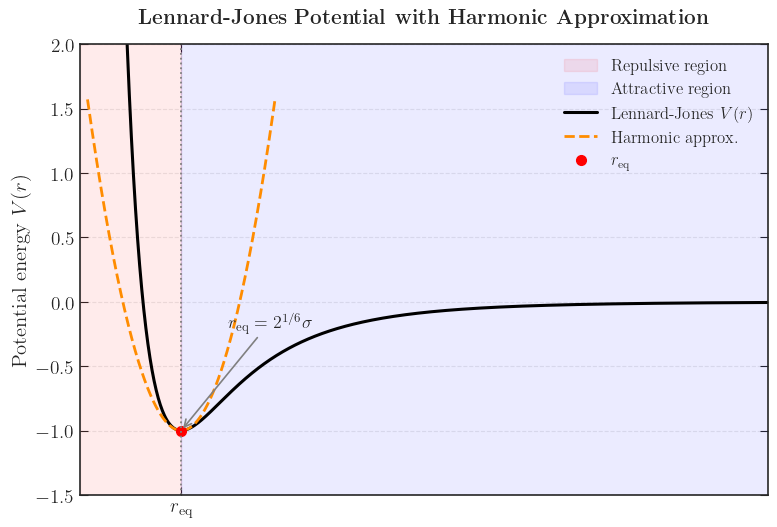

In [3]:
import numpy as np
import matplotlib.pyplot as plt
from matplotlib import rcParams

# ---------- Styling ----------
plt.style.use('seaborn-v0_8-white')
rcParams.update({
    'font.size': 14,
    'text.usetex': True,
    'font.family': 'serif',
    'axes.linewidth': 1.2,
    'xtick.direction': 'in',
    'ytick.direction': 'in',
    'xtick.top': True,
    'ytick.right': True,
    'xtick.major.size': 6,
    'ytick.major.size': 6,
    'legend.frameon': False
})

# ---------- Physical Constants ----------
epsilon = 1.0
sigma = 1.0

def V_LJ(r):
    return 4 * epsilon * ((sigma / r)**12 - (sigma / r)**6)

r_eq = 2**(1/6) * sigma
V_eq = V_LJ(r_eq)

def V_second_derivative(r):
    return 4 * epsilon * (12*11*sigma**12 / r**14 - 6*5*sigma**6 / r**8)

k_eff = V_second_derivative(r_eq)

def V_harmonic(r):
    return V_eq + 0.5 * k_eff * (r - r_eq)**2

# ---------- Plot Range ----------
r_vals = np.linspace(0.8, 3.0, 1000)
V_vals = V_LJ(r_vals)
r_local = np.linspace(r_eq - 0.3, r_eq + 0.3, 500)
V_h_vals = V_harmonic(r_local)

# ---------- Plot ----------
fig, ax = plt.subplots(figsize=(8, 5.5))

# Shade repulsive region (r < r_eq)
ax.axvspan(0.8, r_eq, color='red', alpha=0.08, label='Repulsive region')

# Shade attractive region (r > r_eq)
ax.axvspan(r_eq, 3.0, color='blue', alpha=0.08, label='Attractive region')

# LJ curve
ax.plot(r_vals, V_vals, color='black', lw=2.2, label=r"Lennard-Jones $V(r)$")

# Harmonic approximation near equilibrium
ax.plot(r_local, V_h_vals, '--', color='darkorange', lw=2.0, label="Harmonic approx.")

# Equilibrium point
ax.plot(r_eq, V_eq, 'ro', markersize=7, label=r"$r_{\rm eq}$")
ax.axvline(r_eq, color='gray', linestyle=':', lw=1.3)

# Annotate equilibrium point
ax.annotate(
    r"$r_{\rm eq} = 2^{1/6}\sigma$",
    xy=(r_eq, V_eq),
    xytext=(r_eq + 0.15, V_eq + 0.8),
    textcoords='data',
    arrowprops=dict(arrowstyle='->', lw=1.2, color='gray'),
    fontsize=13
)

# ---------- Labels and Layout ----------
ax.set_ylabel(r"Potential energy $V(r)$", fontsize=15)
ax.set_title(r"\textbf{Lennard-Jones Potential with Harmonic Approximation}", fontsize=15, pad=15)

# Clean x-axis: only label r_eq
ax.set_xticks([r_eq])
ax.set_xticklabels([r"$r_{\rm eq}$"])
ax.set_xlim(0.8, 3.0)
ax.set_ylim(-1.5, 2.0)

# Grid and Legend
ax.grid(True, which='both', linestyle='--', alpha=0.4)
ax.legend(fontsize=12, loc='upper right')
plt.tight_layout()
plt.show()


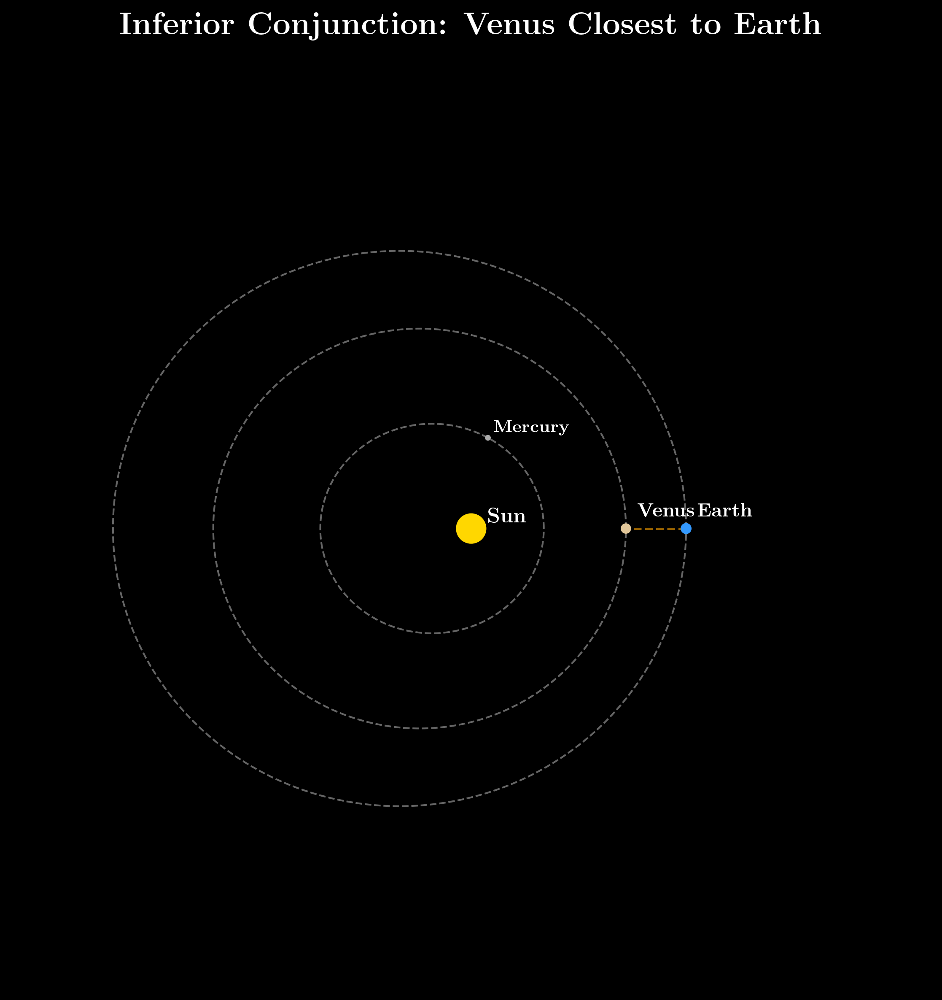

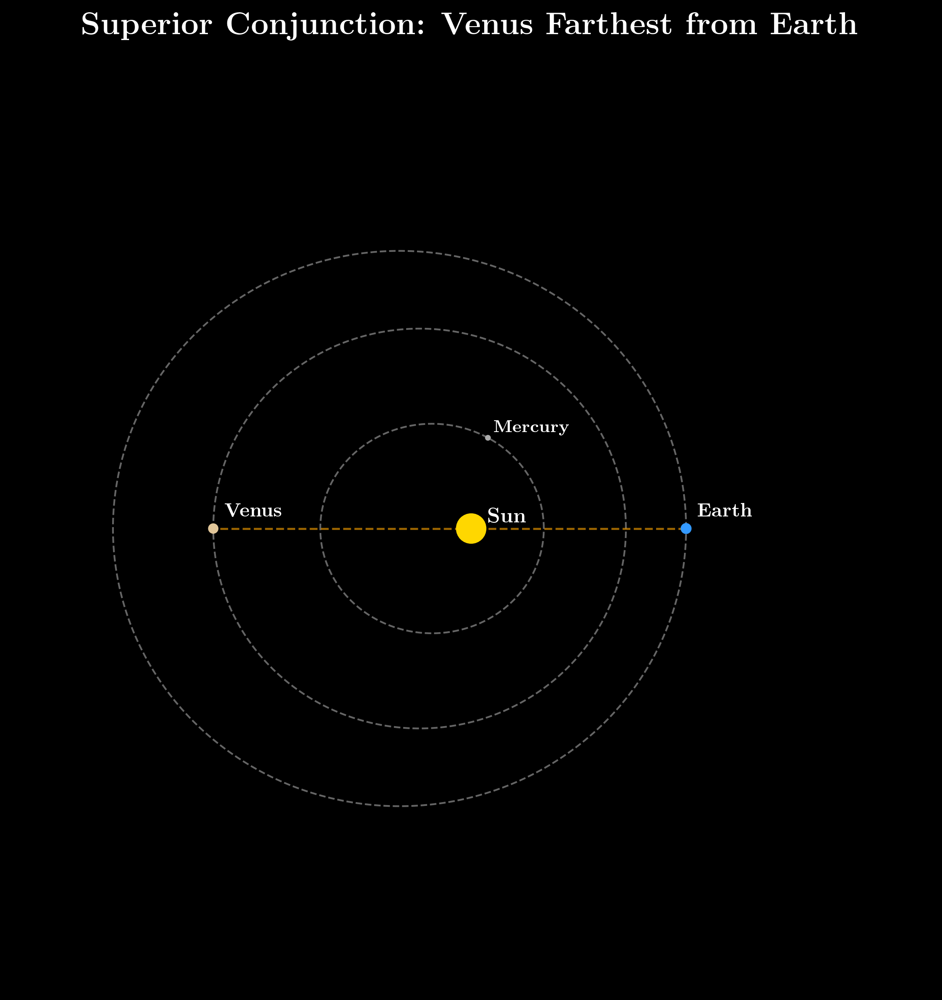

In [3]:
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.patches import Circle
from matplotlib import rcParams

# ---------- Styling ----------
plt.style.use('seaborn-v0_8-white')
rcParams.update({
    'text.usetex': True,
    'font.family': 'serif',
    'axes.facecolor': 'black',
    'figure.facecolor': 'black',
    'savefig.facecolor': 'black',
    'axes.edgecolor': 'white',
    'xtick.color': 'white',
    'ytick.color': 'white',
    'axes.labelcolor': 'white',
    'axes.titlesize': 18,
    'figure.dpi': 300
})

# ---------- Exaggerated Orbital Data (for clarity) ----------
bodies = {
    "Sun": {"radius": 0.05, "color": 'gold'},
    "Mercury": {"a": 0.39, "e": 0.35, "radius": 0.007, "color": '#aaaaaa'},
    "Venus":   {"a": 0.72, "e": 0.25, "radius": 0.015, "color": '#e1c699'},
    "Earth":   {"a": 1.00, "e": 0.25, "radius": 0.016, "color": '#3399ff'},
}

def draw_system(venus_angle_deg, title, save_as):
    fig, ax = plt.subplots(figsize=(8, 8))
    ax.set_aspect('equal')
    ax.set_xlim(-1.6, 1.6)
    ax.set_ylim(-1.6, 1.6)
    ax.axis('off')

    # ---------- Draw Orbits ----------
    theta = np.linspace(0, 2 * np.pi, 1000)
    for planet in ["Mercury", "Venus", "Earth"]:
        a = bodies[planet]["a"]
        e = bodies[planet]["e"]
        b = a * np.sqrt(1 - e**2)
        x = a * np.cos(theta) - a * e
        y = b * np.sin(theta)
        ax.plot(x, y, '--', color='white', lw=1.0, alpha=0.4)

    # ---------- Draw Sun ----------
    ax.add_patch(Circle((0, 0), bodies["Sun"]["radius"], color=bodies["Sun"]["color"], zorder=5))
    ax.text(0.06, 0.02, r"\textbf{Sun}", color='white', fontsize=12)

    # ---------- Earth at 0 deg ----------
    a_E, e_E = bodies["Earth"]["a"], bodies["Earth"]["e"]
    b_E = a_E * np.sqrt(1 - e_E**2)
    x_E = a_E * np.cos(0) - a_E * e_E
    y_E = 0
    ax.add_patch(Circle((x_E, y_E), bodies["Earth"]["radius"], color=bodies["Earth"]["color"], zorder=10))
    ax.text(x_E + 0.04, y_E + 0.04, r"\textbf{Earth}", color='white', fontsize=11)

    # ---------- Venus at input angle ----------
    angle = np.deg2rad(venus_angle_deg)
    a_V, e_V = bodies["Venus"]["a"], bodies["Venus"]["e"]
    b_V = a_V * np.sqrt(1 - e_V**2)
    x_V = a_V * np.cos(angle) - a_V * e_V
    y_V = b_V * np.sin(angle)
    ax.add_patch(Circle((x_V, y_V), bodies["Venus"]["radius"], color=bodies["Venus"]["color"], zorder=10))
    ax.text(x_V + 0.04, y_V + 0.04, r"\textbf{Venus}", color='white', fontsize=11)

    # ---------- Mercury at 60 degrees ----------
    angle_M = np.deg2rad(60)
    a_M, e_M = bodies["Mercury"]["a"], bodies["Mercury"]["e"]
    b_M = a_M * np.sqrt(1 - e_M**2)
    x_M = a_M * np.cos(angle_M) - a_M * e_M
    y_M = b_M * np.sin(angle_M)
    ax.add_patch(Circle((x_M, y_M), bodies["Mercury"]["radius"], color=bodies["Mercury"]["color"], zorder=10))
    ax.text(x_M + 0.02, y_M + 0.02, r"\textbf{Mercury}", color='white', fontsize=10)

    # ---------- Line: Earth to Venus ----------
    ax.plot([x_E, x_V], [y_E, y_V], linestyle='--', color='orange', lw=1.2, alpha=0.6)

    # ---------- Title ----------
    ax.set_title(title, color='white', pad=20)
    plt.tight_layout()
    plt.savefig(save_as, bbox_inches='tight')
    plt.show()

# ---------- Draw: Venus closest to Earth ----------
draw_system(
    venus_angle_deg=0,
    title=r"\textbf{Inferior Conjunction: Venus Closest to Earth}",
    save_as="venus_closest_with_mercury.pdf"
)

# ---------- Draw: Venus farthest from Earth ----------
draw_system(
    venus_angle_deg=180,
    title=r"\textbf{Superior Conjunction: Venus Farthest from Earth}",
    save_as="venus_farthest_with_mercury.pdf"
)


FileNotFoundError: [Errno 2] No such file or directory: '/mnt/data/surface_and_contours.png'

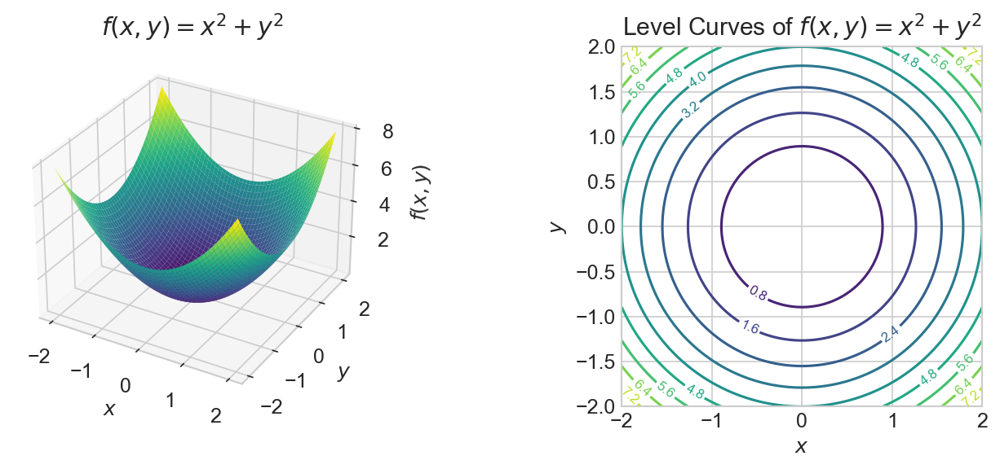

In [1]:
import numpy as np
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D

# Set a consistent style
plt.style.use('seaborn-v0_8-whitegrid')
plt.rcParams.update({'font.size': 12, 'figure.dpi': 150})

# 1. Surface and level curves: f(x, y) = x^2 + y^2
def plot_surface_and_contours():
    fig = plt.figure(figsize=(10, 4))

    # --- 3D surface plot ---
    ax1 = fig.add_subplot(1, 2, 1, projection='3d')
    x = np.linspace(-2, 2, 100)
    y = np.linspace(-2, 2, 100)
    X, Y = np.meshgrid(x, y)
    Z = X**2 + Y**2

    ax1.plot_surface(X, Y, Z, cmap='viridis', edgecolor='none')
    ax1.set_title('$f(x, y) = x^2 + y^2$')
    ax1.set_xlabel('$x$')
    ax1.set_ylabel('$y$')
    ax1.set_zlabel('$f(x, y)$')

    # --- Level curves ---
    ax2 = fig.add_subplot(1, 2, 2)
    cs = ax2.contour(X, Y, Z, levels=10, cmap='viridis')
    ax2.clabel(cs, inline=True, fontsize=8)
    ax2.set_title('Level Curves of $f(x, y) = x^2 + y^2$')
    ax2.set_xlabel('$x$')
    ax2.set_ylabel('$y$')
    ax2.set_aspect('equal')

    plt.tight_layout()
    plt.savefig("/mnt/data/surface_and_contours.png")
    plt.show()

plot_surface_and_contours()


FileNotFoundError: [Errno 2] No such file or directory: '/mnt/data/partial_derivatives_tangent_vectors.pdf'

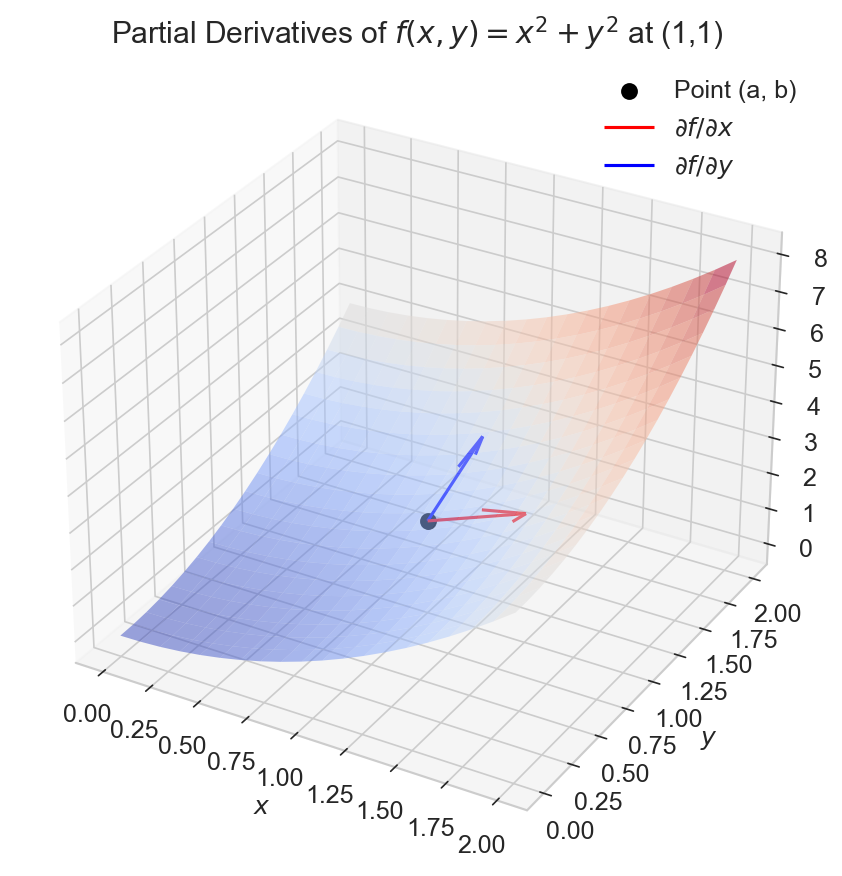

In [2]:
import numpy as np
import matplotlib.pyplot as plt

# Define the function f(x, y) = x^2 + y^2 and its partial derivatives
def f(x, y):
    return x**2 + y**2

def fx(x, y):
    return 2 * x

def fy(x, y):
    return 2 * y

# Choose a point (a, b) at which to compute the tangent vector
a, b = 1.0, 1.0
z = f(a, b)
grad = np.array([fx(a, b), fy(a, b)])  # Gradient vector

# Create grid for surface and tangent vector
x = np.linspace(0, 2, 20)
y = np.linspace(0, 2, 20)
X, Y = np.meshgrid(x, y)
Z = f(X, Y)

# Plot the surface with tangent vectors
fig = plt.figure(figsize=(8, 6))
ax = fig.add_subplot(111, projection='3d')

# Plot surface
ax.plot_surface(X, Y, Z, alpha=0.5, cmap='coolwarm', edgecolor='none')

# Plot point
ax.scatter(a, b, z, color='k', s=50, label='Point (a, b)')

# Plot tangent vectors (partial derivatives)
ax.quiver(a, b, z, 1, 0, fx(a, b), length=0.5, color='red', label=r'$\partial f/\partial x$')
ax.quiver(a, b, z, 0, 1, fy(a, b), length=0.5, color='blue', label=r'$\partial f/\partial y$')

# Labels and legend
ax.set_xlabel('$x$')
ax.set_ylabel('$y$')
ax.set_zlabel('$f(x, y)$')
ax.set_title('Partial Derivatives of $f(x, y) = x^2 + y^2$ at (1,1)')
ax.legend()

plt.tight_layout()
plt.savefig("/mnt/data/partial_derivatives_tangent_vectors.pdf")
plt.show()


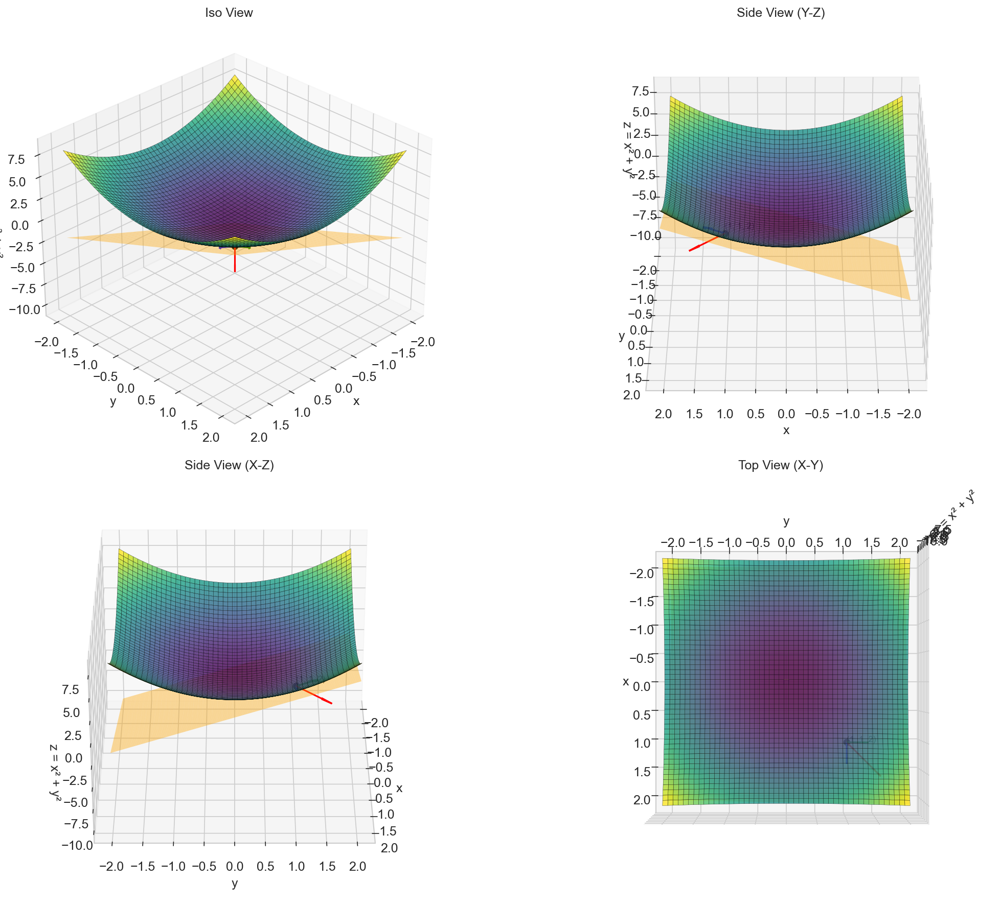

/var/folders/z9/4pcc0vs57ns2s8jv05__14_80000gn/T/ipykernel_3760/6792085.py:70: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


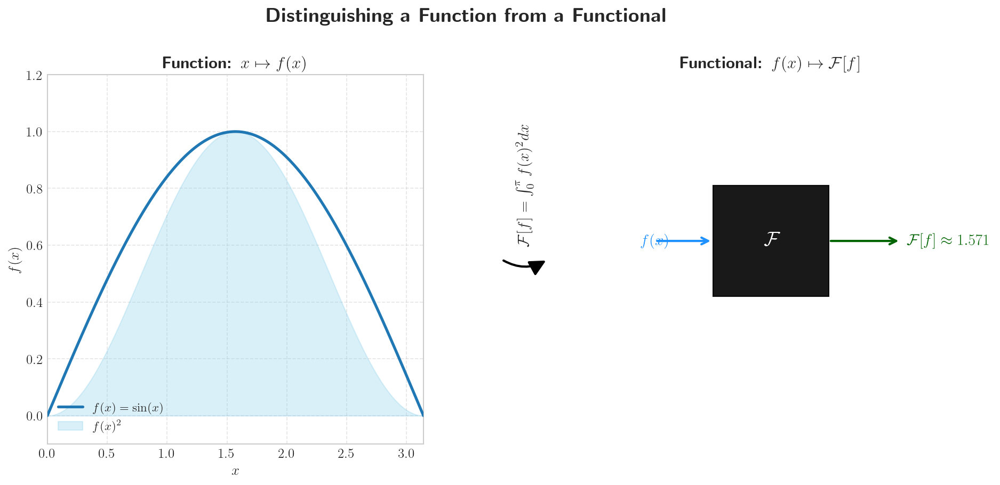

In [9]:
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.patches import FancyArrowPatch, Rectangle
import matplotlib.patheffects as path_effects
from matplotlib.gridspec import GridSpec

# Function and Functional definitions
x = np.linspace(0, np.pi, 300)
f_x = np.sin(x)
f_squared = f_x ** 2
F_val = np.trapz(f_squared, x)

# Create figure with custom layout
fig = plt.figure(figsize=(14, 6), dpi=150)
gs = GridSpec(1, 3, width_ratios=[1.3, 0.2, 1], wspace=0.3)

# Function Plot
ax0 = fig.add_subplot(gs[0])
ax0.plot(x, f_x, color='#1f77b4', linewidth=2.5, label=r"$f(x) = \sin(x)$", zorder=3)
ax0.fill_between(x, f_squared, alpha=0.3, color='#87CEEB', label=r"$f(x)^2$", zorder=2)
ax0.set_title(r"\textbf{Function: $x \mapsto f(x)$}", fontsize=15)
ax0.set_xlabel(r"$x$", fontsize=13)
ax0.set_ylabel(r"$f(x)$", fontsize=13)
ax0.grid(True, linestyle='--', alpha=0.5)
ax0.legend(loc="lower left", fontsize=11)
ax0.set_xlim(0, np.pi)
ax0.set_ylim(-0.1, 1.2)

# Arrow panel
ax_arrow = fig.add_subplot(gs[1])
ax_arrow.axis("off")

# Draw curved arrow using FancyArrowPatch
arrow = FancyArrowPatch((0.1, 0.5), (0.9, 0.5),
                        connectionstyle="arc3,rad=0.3",
                        arrowstyle='-|>', mutation_scale=30, lw=2, color='black')
ax_arrow.add_patch(arrow)

ax_arrow.text(0.5, 0.7, r"$\mathcal{F}[f] = \int_0^\pi f(x)^2 dx$", fontsize=14,
              ha='center', va='center', rotation=90)

# Functional Output Panel
ax1 = fig.add_subplot(gs[2])
ax1.axis("off")
ax1.set_title(r"\textbf{Functional: $f(x) \mapsto \mathcal{F}[f]$}", fontsize=15)

# Draw functional box
box = Rectangle((0.3, 0.4), 0.4, 0.3, color='black', alpha=0.9)
ax1.add_patch(box)
ax1.text(0.5, 0.55, r"$\mathcal{F}$", color='white', fontsize=18,
         ha='center', va='center', weight='bold')

# Input arrow to box
arrow1 = FancyArrowPatch((0.1, 0.55), (0.3, 0.55), arrowstyle='->',
                         mutation_scale=15, lw=2, color='dodgerblue')
ax1.add_patch(arrow1)
ax1.text(0.05, 0.55, r"$f(x)$", fontsize=14, color='dodgerblue', va='center')

# Output arrow from box
arrow2 = FancyArrowPatch((0.7, 0.55), (0.95, 0.55), arrowstyle='->',
                         mutation_scale=15, lw=2, color='darkgreen')
ax1.add_patch(arrow2)
txt = ax1.text(0.97, 0.55, rf"$\mathcal{{F}}[f] \approx {F_val:.3f}$",
               fontsize=14, color='darkgreen', va='center', ha='left')
txt.set_path_effects([path_effects.Stroke(linewidth=1, foreground='white'),
                      path_effects.Normal()])

# Final touches
fig.suptitle(r"\textbf{Distinguishing a Function from a Functional}", fontsize=18, y=1.02)
plt.tight_layout()
plt.show()



RuntimeError: latex was not able to process the following string:
b'$\\\\mathbb{R}$'

Here is the full command invocation and its output:

latex -interaction=nonstopmode --halt-on-error --output-directory=tmpanrafn5n 4d917606cdd251f29c8b893b9099f34d.tex

This is pdfTeX, Version 3.141592653-2.6-1.40.24 (TeX Live 2022) (preloaded format=latex)
 restricted \write18 enabled.
entering extended mode
(./4d917606cdd251f29c8b893b9099f34d.tex
LaTeX2e <2021-11-15> patch level 1
L3 programming layer <2022-02-24>
(/usr/local/texlive/2022/texmf-dist/tex/latex/base/article.cls
Document Class: article 2021/10/04 v1.4n Standard LaTeX document class
(/usr/local/texlive/2022/texmf-dist/tex/latex/base/size10.clo))
(/usr/local/texlive/2022/texmf-dist/tex/latex/type1cm/type1cm.sty)
(/usr/local/texlive/2022/texmf-dist/tex/latex/cm-super/type1ec.sty
(/usr/local/texlive/2022/texmf-dist/tex/latex/base/t1cmr.fd))
(/usr/local/texlive/2022/texmf-dist/tex/latex/base/inputenc.sty)
(/usr/local/texlive/2022/texmf-dist/tex/latex/geometry/geometry.sty
(/usr/local/texlive/2022/texmf-dist/tex/latex/graphics/keyval.sty)
(/usr/local/texlive/2022/texmf-dist/tex/generic/iftex/ifvtex.sty
(/usr/local/texlive/2022/texmf-dist/tex/generic/iftex/iftex.sty)))
(/usr/local/texlive/2022/texmf-dist/tex/latex/underscore/underscore.sty)
(/usr/local/texlive/2022/texmf-dist/tex/latex/base/textcomp.sty)
(/usr/local/texlive/2022/texmf-dist/tex/latex/l3backend/l3backend-dvips.def)
No file 4d917606cdd251f29c8b893b9099f34d.aux.
*geometry* driver: auto-detecting
*geometry* detected driver: dvips
! Undefined control sequence.
<recently read> \mathbb 
                        
l.30 {\sffamily $\mathbb
                        {R}$}%
No pages of output.
Transcript written on tmpanrafn5n/4d917606cdd251f29c8b893b9099f34d.log.




Error in callback <function _draw_all_if_interactive at 0x10b90c360> (for post_execute), with arguments args (),kwargs {}:


RuntimeError: latex was not able to process the following string:
b'$\\\\mathbb{R}$'

Here is the full command invocation and its output:

latex -interaction=nonstopmode --halt-on-error --output-directory=tmpgvo2lv1m 4d917606cdd251f29c8b893b9099f34d.tex

This is pdfTeX, Version 3.141592653-2.6-1.40.24 (TeX Live 2022) (preloaded format=latex)
 restricted \write18 enabled.
entering extended mode
(./4d917606cdd251f29c8b893b9099f34d.tex
LaTeX2e <2021-11-15> patch level 1
L3 programming layer <2022-02-24>
(/usr/local/texlive/2022/texmf-dist/tex/latex/base/article.cls
Document Class: article 2021/10/04 v1.4n Standard LaTeX document class
(/usr/local/texlive/2022/texmf-dist/tex/latex/base/size10.clo))
(/usr/local/texlive/2022/texmf-dist/tex/latex/type1cm/type1cm.sty)
(/usr/local/texlive/2022/texmf-dist/tex/latex/cm-super/type1ec.sty
(/usr/local/texlive/2022/texmf-dist/tex/latex/base/t1cmr.fd))
(/usr/local/texlive/2022/texmf-dist/tex/latex/base/inputenc.sty)
(/usr/local/texlive/2022/texmf-dist/tex/latex/geometry/geometry.sty
(/usr/local/texlive/2022/texmf-dist/tex/latex/graphics/keyval.sty)
(/usr/local/texlive/2022/texmf-dist/tex/generic/iftex/ifvtex.sty
(/usr/local/texlive/2022/texmf-dist/tex/generic/iftex/iftex.sty)))
(/usr/local/texlive/2022/texmf-dist/tex/latex/underscore/underscore.sty)
(/usr/local/texlive/2022/texmf-dist/tex/latex/base/textcomp.sty)
(/usr/local/texlive/2022/texmf-dist/tex/latex/l3backend/l3backend-dvips.def)
No file 4d917606cdd251f29c8b893b9099f34d.aux.
*geometry* driver: auto-detecting
*geometry* detected driver: dvips
! Undefined control sequence.
<recently read> \mathbb 
                        
l.30 {\sffamily $\mathbb
                        {R}$}%
No pages of output.
Transcript written on tmpgvo2lv1m/4d917606cdd251f29c8b893b9099f34d.log.




RuntimeError: latex was not able to process the following string:
b'$\\\\mathbb{R}$'

Here is the full command invocation and its output:

latex -interaction=nonstopmode --halt-on-error --output-directory=tmp1wg1g25c 4d917606cdd251f29c8b893b9099f34d.tex

This is pdfTeX, Version 3.141592653-2.6-1.40.24 (TeX Live 2022) (preloaded format=latex)
 restricted \write18 enabled.
entering extended mode
(./4d917606cdd251f29c8b893b9099f34d.tex
LaTeX2e <2021-11-15> patch level 1
L3 programming layer <2022-02-24>
(/usr/local/texlive/2022/texmf-dist/tex/latex/base/article.cls
Document Class: article 2021/10/04 v1.4n Standard LaTeX document class
(/usr/local/texlive/2022/texmf-dist/tex/latex/base/size10.clo))
(/usr/local/texlive/2022/texmf-dist/tex/latex/type1cm/type1cm.sty)
(/usr/local/texlive/2022/texmf-dist/tex/latex/cm-super/type1ec.sty
(/usr/local/texlive/2022/texmf-dist/tex/latex/base/t1cmr.fd))
(/usr/local/texlive/2022/texmf-dist/tex/latex/base/inputenc.sty)
(/usr/local/texlive/2022/texmf-dist/tex/latex/geometry/geometry.sty
(/usr/local/texlive/2022/texmf-dist/tex/latex/graphics/keyval.sty)
(/usr/local/texlive/2022/texmf-dist/tex/generic/iftex/ifvtex.sty
(/usr/local/texlive/2022/texmf-dist/tex/generic/iftex/iftex.sty)))
(/usr/local/texlive/2022/texmf-dist/tex/latex/underscore/underscore.sty)
(/usr/local/texlive/2022/texmf-dist/tex/latex/base/textcomp.sty)
(/usr/local/texlive/2022/texmf-dist/tex/latex/l3backend/l3backend-dvips.def)
No file 4d917606cdd251f29c8b893b9099f34d.aux.
*geometry* driver: auto-detecting
*geometry* detected driver: dvips
! Undefined control sequence.
<recently read> \mathbb 
                        
l.30 {\sffamily $\mathbb
                        {R}$}%
No pages of output.
Transcript written on tmp1wg1g25c/4d917606cdd251f29c8b893b9099f34d.log.




<Figure size 1500x750 with 1 Axes>

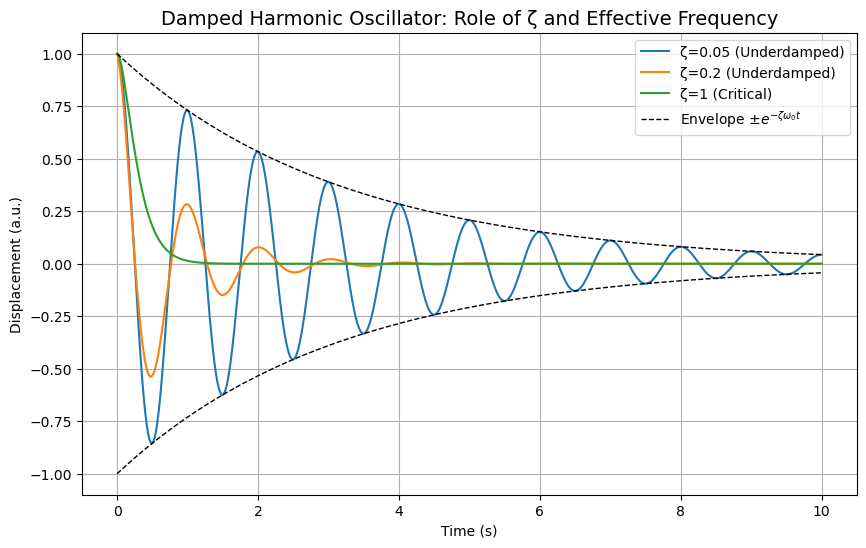

In [1]:
import numpy as np
import matplotlib.pyplot as plt

# Parameters
omega0 = 2 * np.pi       # natural frequency (rad/s)
zeta_values = [0.05, 0.2, 1.0]  # underdamped, moderately damped, critically damped
t = np.linspace(0, 10, 1000)

# Function for damped oscillator response
def damped_oscillation(t, omega0, zeta):
    if zeta < 1:  # underdamped
        omega_eff = omega0 * np.sqrt(1 - zeta**2)
        return np.exp(-zeta * omega0 * t) * np.cos(omega_eff * t)
    elif np.isclose(zeta, 1):  # critically damped
        return np.exp(-omega0 * t) * (1 + omega0 * t)
    else:  # overdamped
        r1 = -omega0 * (zeta - np.sqrt(zeta**2 - 1))
        r2 = -omega0 * (zeta + np.sqrt(zeta**2 - 1))
        return np.exp(r1 * t) - np.exp(r2 * t)

# Plotting
plt.figure(figsize=(10, 6))

for zeta in zeta_values:
    x_t = damped_oscillation(t, omega0, zeta)
    label = (
        f"ζ={zeta} (Underdamped)" if zeta < 1 else
        "ζ=1 (Critical)" if np.isclose(zeta, 1) else
        f"ζ={zeta} (Overdamped)"
    )
    plt.plot(t, x_t, label=label)

# Envelope for underdamped case
zeta_env = 0.05
envelope = np.exp(-zeta_env * omega0 * t)
plt.plot(t, envelope, "k--", lw=1, label="Envelope ±$e^{-ζ ω_0 t}$")
plt.plot(t, -envelope, "k--", lw=1)

plt.title("Damped Harmonic Oscillator: Role of ζ and Effective Frequency", fontsize=14)
plt.xlabel("Time (s)")
plt.ylabel("Displacement (a.u.)")
plt.legend()
plt.grid(True)
plt.show()


<>:28: SyntaxWarning: invalid escape sequence '\z'
<>:28: SyntaxWarning: invalid escape sequence '\z'
/var/folders/z9/4pcc0vs57ns2s8jv05__14_80000gn/T/ipykernel_51656/2138730396.py:28: SyntaxWarning: invalid escape sequence '\z'
  ax.plot(t, x_t, label=f"$\zeta$={zeta}")


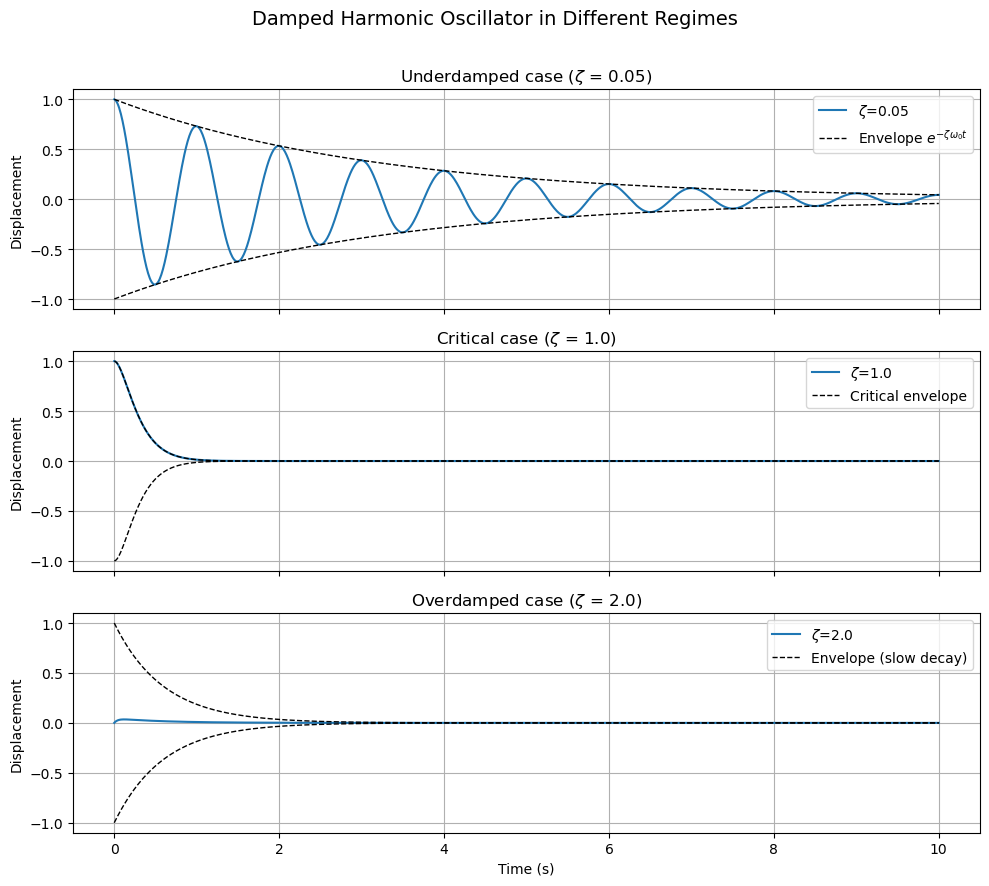

In [2]:
import numpy as np
import matplotlib.pyplot as plt

# Parameters
omega0 = 2 * np.pi       # natural frequency (rad/s)
zeta_values = [0.05, 1.0, 2.0]  # underdamped, critically damped, overdamped
t = np.linspace(0, 10, 1000)

# Function for damped oscillator response
def damped_oscillation(t, omega0, zeta):
    if zeta < 1:  # underdamped
        omega_eff = omega0 * np.sqrt(1 - zeta**2)
        return np.exp(-zeta * omega0 * t) * np.cos(omega_eff * t)
    elif np.isclose(zeta, 1):  # critically damped
        return np.exp(-omega0 * t) * (1 + omega0 * t)
    else:  # overdamped
        r1 = -omega0 * (zeta - np.sqrt(zeta**2 - 1))
        r2 = -omega0 * (zeta + np.sqrt(zeta**2 - 1))
        return (np.exp(r1 * t) - np.exp(r2 * t)) / (r1 - r2)

# Plotting
fig, axes = plt.subplots(3, 1, figsize=(10, 9), sharex=True)

for ax, zeta in zip(axes, zeta_values):
    x_t = damped_oscillation(t, omega0, zeta)

    # Plot main response
    ax.plot(t, x_t, label=f"$\zeta$={zeta}")

    # Plot envelope depending on regime
    if zeta < 1:  # underdamped: exponential envelope
        envelope = np.exp(-zeta * omega0 * t)
        ax.plot(t, envelope, "k--", lw=1, label="Envelope $e^{-ζ ω_0 t}$")
        ax.plot(t, -envelope, "k--", lw=1)
    elif np.isclose(zeta, 1):  # critical: envelope ~ e^{-ω0 t}(1+ω0 t)
        envelope = np.exp(-omega0 * t) * (1 + omega0 * t)
        ax.plot(t, envelope, "k--", lw=1, label="Critical envelope")
        ax.plot(t, -envelope, "k--", lw=1)
    else:  # overdamped: slower exponential dominates
        r1 = -omega0 * (zeta - np.sqrt(zeta**2 - 1))
        envelope = np.exp(r1 * t)
        ax.plot(t, envelope, "k--", lw=1, label="Envelope (slow decay)")
        ax.plot(t, -envelope, "k--", lw=1)

    # Styling
    regime = "Underdamped" if zeta < 1 else "Critical" if np.isclose(zeta, 1) else "Overdamped"
    ax.set_title(f"{regime} case ($\\zeta$ = {zeta})")
    ax.set_ylabel("Displacement")
    ax.grid(True)
    ax.legend()

axes[-1].set_xlabel("Time (s)")
plt.suptitle("Damped Harmonic Oscillator in Different Regimes", fontsize=14)
plt.tight_layout(rect=[0, 0, 1, 0.97])
plt.show()


FileNotFoundError: [Errno 2] No such file or directory: '/mnt/data/damped_driven_full.png'

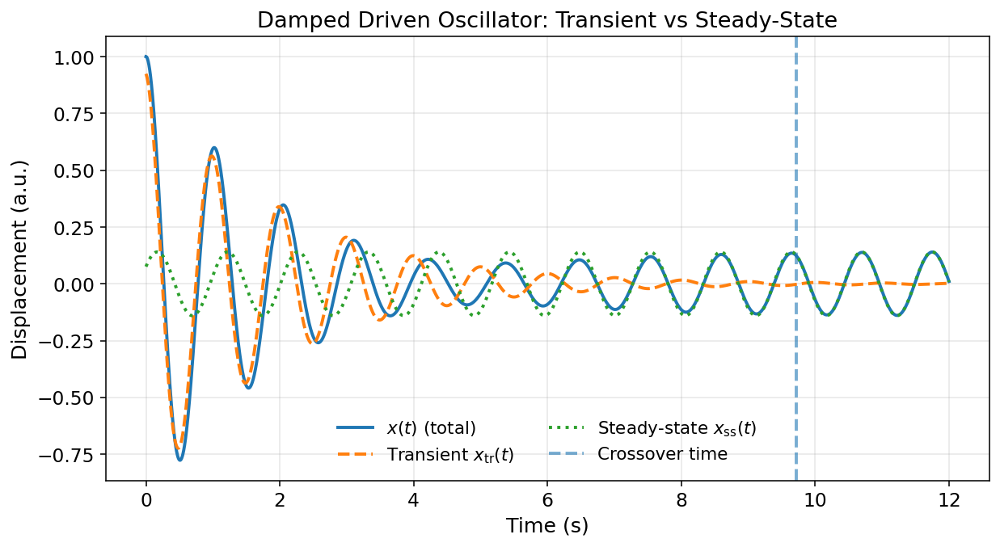

In [3]:
# Damped, driven harmonic oscillator: transient vs steady-state
# Publication-ready figures (matplotlib only, no seaborn, one chart per figure, no explicit colors).

import numpy as np
import matplotlib.pyplot as plt

# Use LaTeX-like text for clarity in labels
plt.rcParams.update({
    "text.usetex": False,  # keep False to avoid LaTeX dependency in this environment
    "font.size": 12,
    "axes.labelsize": 13,
    "axes.titlesize": 14,
    "legend.fontsize": 11,
    "figure.dpi": 140,
    "savefig.dpi": 300,
    "lines.linewidth": 2.0,
    "axes.grid": True,
    "grid.alpha": 0.3,
})

# Physical parameters
m = 1.0
omega0 = 2*np.pi*1.0      # natural frequency (rad/s)
zeta   = 0.08             # damping ratio (underdamped)
F0     = 1.0              # driving amplitude
omega  = 2*np.pi*0.95     # drive frequency (slightly detuned from resonance)

# Initial conditions
x0 = 1.0     # initial displacement
v0 = 0.0     # initial velocity

# Derived quantities
gamma = 2*zeta*omega0     # damping coefficient in equation: x'' + gamma x' + omega0^2 x = (F0/m) cos(omega t)
omega_d = omega0*np.sqrt(1 - zeta**2)  # damped frequency

# Steady-state (particular) amplitude and phase: X cos(omega t - delta)
X = (F0/m)/np.sqrt((omega0**2 - omega**2)**2 + (gamma*omega)**2)
delta = np.arctan2(gamma*omega, (omega0**2 - omega**2))

# Steady-state solution and its derivative
def x_ss(t):
    return X*np.cos(omega*t - delta)

def v_ss(t):
    return -X*omega*np.sin(omega*t - delta)

# Determine constants A and B for the transient (complementary) solution so that
# x(0)=x0 and v(0)=v0 are satisfied by x_total = x_transient + x_ss
# Transient: x_tr(t) = e^{-zeta*omega0 t} [ A cos(omega_d t) + B sin(omega_d t) ]
# At t=0: x_tr(0) = A, v_tr(0) = -zeta*omega0*A + omega_d*B
A = x0 - x_ss(0)
B = (v0 - v_ss(0) + zeta*omega0*A) / omega_d

def x_tr(t):
    return np.exp(-zeta*omega0*t)*(A*np.cos(omega_d*t) + B*np.sin(omega_d*t))

def x_total(t):
    return x_tr(t) + x_ss(t)

# Time arrays for plotting
t_max = 12
t = np.linspace(0, t_max, 5000)

# Estimate a crossover time when the transient envelope falls below a small fraction of the steady-state amplitude
env0 = np.sqrt(A**2 + B**2)
fraction = 0.05  # 5% of the steady-state amplitude
X_eff = max(X, 1e-9)  # avoid division by zero
t_cross = (1/(zeta*omega0))*np.log(max(env0,1e-12)/(fraction*X_eff))
t_cross = np.clip(t_cross, 0, t_max)

# === Figure 1: Full evolution with components ===
fig1 = plt.figure(figsize=(9, 5))
plt.plot(t, x_total(t), label=r"$x(t)$ (total)")
plt.plot(t, x_tr(t), linestyle="--", label=r"Transient $x_{\mathrm{tr}}(t)$")
plt.plot(t, x_ss(t), linestyle=":", label=r"Steady-state $x_{\mathrm{ss}}(t)$")
plt.axvline(t_cross, linestyle="--", alpha=0.6, label="Crossover time")
plt.title("Damped Driven Oscillator: Transient vs Steady-State")
plt.xlabel("Time (s)")
plt.ylabel("Displacement (a.u.)")
plt.legend(frameon=False, ncol=2)
plt.tight_layout()
fig1_path = "/mnt/data/damped_driven_full.png"
plt.savefig(fig1_path, bbox_inches="tight")
plt.show()

# === Figure 2: Early-time (transient-dominated) zoom ===
t_early = np.linspace(0, min(t_cross*1.2, t_max/2), 2000)
fig2 = plt.figure(figsize=(9, 5))
plt.plot(t_early, x_total(t_early), label=r"$x(t)$ (total)")
plt.plot(t_early, x_tr(t_early), linestyle="--", label=r"Transient $x_{\mathrm{tr}}(t)$")
plt.plot(t_early, x_ss(t_early), linestyle=":", label=r"Steady-state $x_{\mathrm{ss}}(t)$")
plt.title("Early Time: Dynamics Governed by Complementary (Transient) Solution")
plt.xlabel("Time (s)")
plt.ylabel("Displacement (a.u.)")
plt.legend(frameon=False, ncol=2)
plt.tight_layout()
fig2_path = "/mnt/data/damped_driven_early.png"
plt.savefig(fig2_path, bbox_inches="tight")
plt.show()

# === Figure 3: Late-time (steady-state dominated) zoom ===
t_late_start = max(t_cross*0.8, t_max/3)
t_late = np.linspace(t_late_start, t_max, 3000)
fig3 = plt.figure(figsize=(9, 5))
plt.plot(t_late, x_total(t_late), label=r"$x(t)$ (total)")
plt.plot(t_late, x_tr(t_late), linestyle="--", label=r"Transient $x_{\mathrm{tr}}(t)$")
plt.plot(t_late, x_ss(t_late), linestyle=":", label=r"Steady-state $x_{\mathrm{ss}}(t)$")
plt.title("Late Time: Steady-State Solution Takes Over")
plt.xlabel("Time (s)")
plt.ylabel("Displacement (a.u.)")
plt.legend(frameon=False, ncol=2)
plt.tight_layout()
fig3_path = "/mnt/data/damped_driven_late.png"
plt.savefig(fig3_path, bbox_inches="tight")
plt.show()

fig1_path, fig2_path, fig3_path


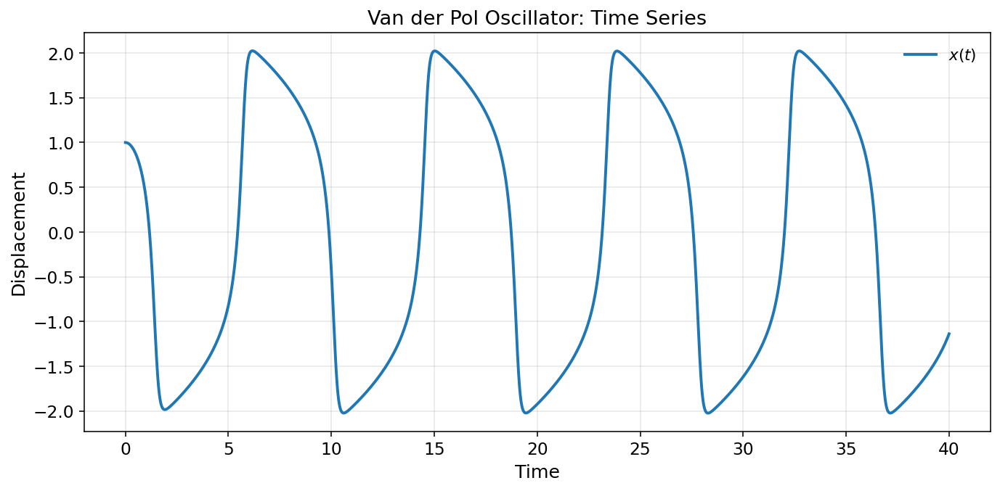

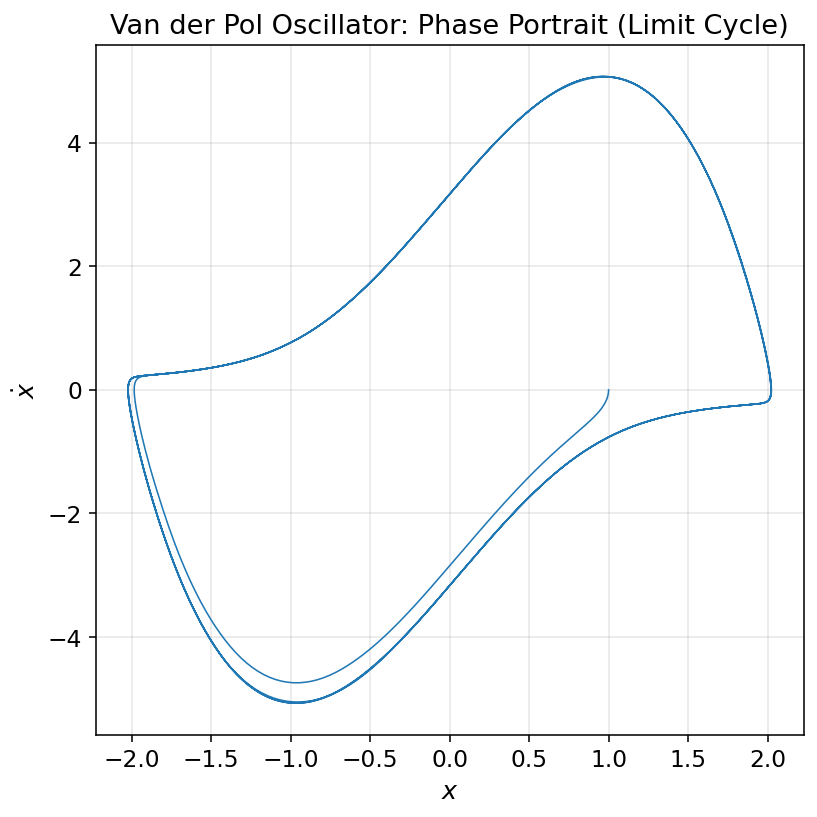

In [5]:
import numpy as np
import matplotlib.pyplot as plt
from scipy.integrate import solve_ivp

# Parameters for van der Pol oscillator
mu = 3.0   # nonlinearity parameter

# Define system of ODEs
# y[0] = x, y[1] = dx/dt
def vdp(t, y):
    x, v = y
    dxdt = v
    dvdt = mu * (1 - x**2) * v - x
    return [dxdt, dvdt]

# Initial conditions
x0 = 1.0
v0 = 0.0
y0 = [x0, v0]

# Time span
t_span = (0, 40)
t_eval = np.linspace(t_span[0], t_span[1], 5000)

# Solve ODE
sol = solve_ivp(vdp, t_span, y0, t_eval=t_eval, method="RK45")

# Plot time series
plt.figure(figsize=(10,5))
plt.plot(sol.t, sol.y[0], label=r"$x(t)$")
plt.xlabel("Time")
plt.ylabel("Displacement")
plt.title("Van der Pol Oscillator: Time Series")
plt.legend(frameon=False)
plt.grid(alpha=0.3)
plt.tight_layout()
plt.show()

# Phase portrait
plt.figure(figsize=(6,6))
plt.plot(sol.y[0], sol.y[1], lw=0.8)
plt.xlabel(r"$x$")
plt.ylabel(r"$\dot{x}$")
plt.title("Van der Pol Oscillator: Phase Portrait (Limit Cycle)")
plt.grid(alpha=0.3)
plt.tight_layout()
plt.show()


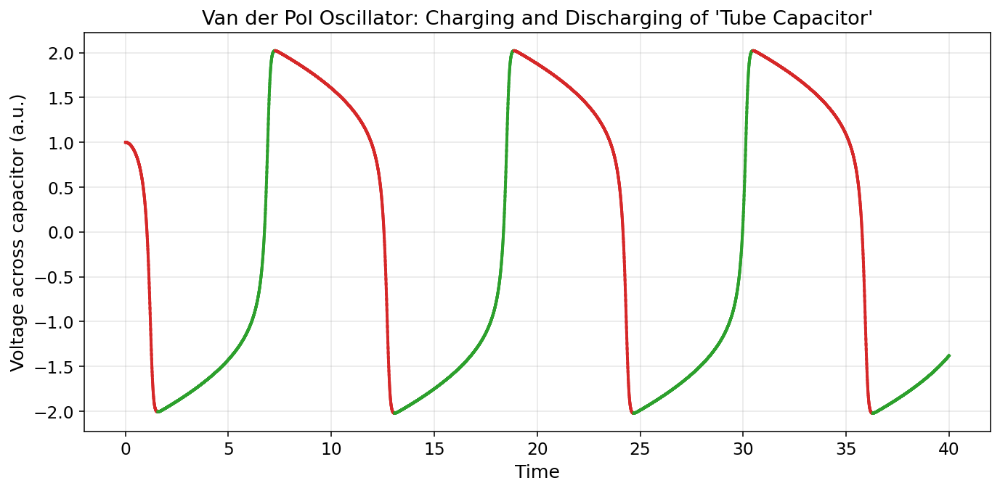

In [6]:
import numpy as np
import matplotlib.pyplot as plt
from scipy.integrate import solve_ivp

# Van der Pol parameters
mu = 5.0   # stronger nonlinearity to show relaxation oscillations

def vdp(t, y):
    x, v = y
    dxdt = v
    dvdt = mu * (1 - x**2) * v - x
    return [dxdt, dvdt]

# Initial conditions
x0, v0 = 1.0, 0.0
y0 = [x0, v0]

# Time span
t_span = (0, 40)
t_eval = np.linspace(t_span[0], t_span[1], 5000)

# Solve ODE
sol = solve_ivp(vdp, t_span, y0, t_eval=t_eval, method="RK45")

x = sol.y[0]
t = sol.t

# Plot charging/discharging
plt.figure(figsize=(10,5))
for i in range(len(t)-1):
    if x[i+1] > x[i]:
        plt.plot(t[i:i+2], x[i:i+2], color="tab:green")  # charging
    else:
        plt.plot(t[i:i+2], x[i:i+2], color="tab:red")    # discharging

plt.xlabel("Time")
plt.ylabel("Voltage across capacitor (a.u.)")
plt.title("Van der Pol Oscillator: Charging and Discharging of 'Tube Capacitor'")
plt.grid(alpha=0.3)
plt.tight_layout()
plt.show()


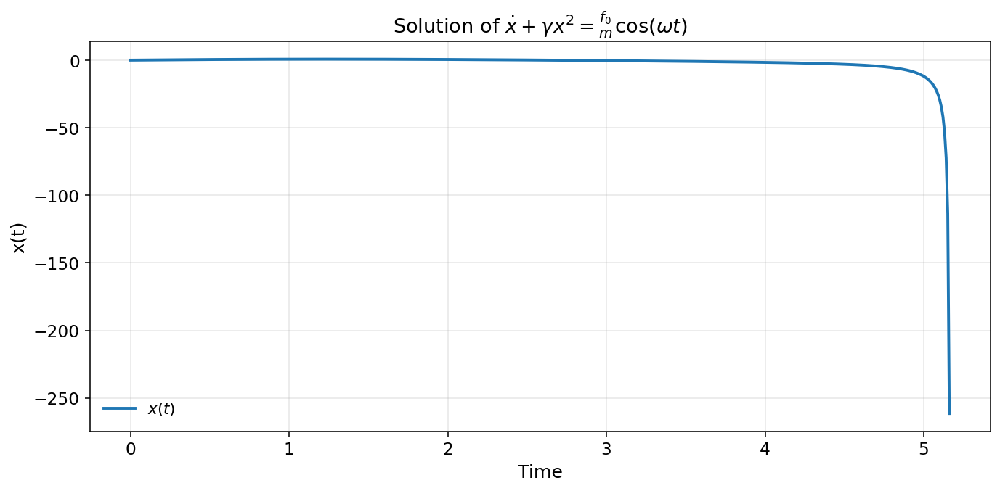

In [7]:
import numpy as np
import matplotlib.pyplot as plt
from scipy.integrate import solve_ivp

# Parameters
gamma = 0.5   # nonlinear damping coefficient
f0    = 1.0   # forcing amplitude
m     = 1.0   # mass
omega = 1.0   # drive frequency

# Define ODE: dx/dt = (f0/m) cos(omega t) - gamma x^2
def ode(t, x):
    return (f0/m)*np.cos(omega*t) - gamma*x**2

# Initial condition
x0 = [0.1]

# Time span
t_span = (0, 50)
t_eval = np.linspace(t_span[0], t_span[1], 5000)

# Solve numerically
sol = solve_ivp(ode, t_span, x0, t_eval=t_eval, method="RK45")

# Plot time series
plt.figure(figsize=(10,5))
plt.plot(sol.t, sol.y[0], label=r"$x(t)$")
plt.xlabel("Time")
plt.ylabel("x(t)")
plt.title(r"Solution of $\dot{x} + \gamma x^2 = \frac{f_0}{m}\cos(\omega t)$")
plt.grid(alpha=0.3)
plt.legend(frameon=False)
plt.tight_layout()
plt.show()


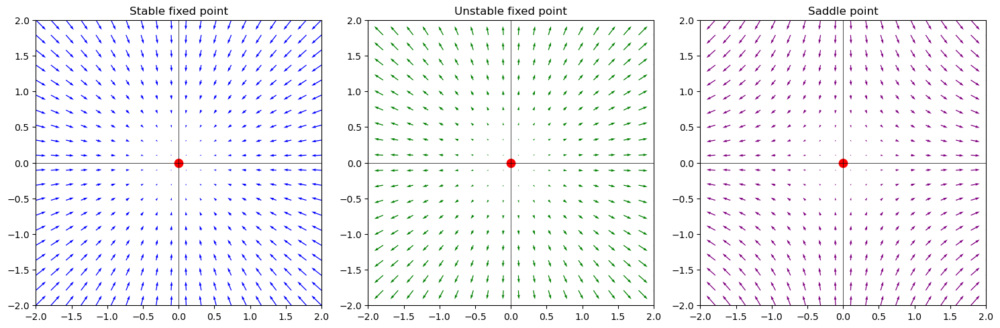

In [2]:
import numpy as np
import matplotlib.pyplot as plt

# Define grid
x = np.linspace(-2, 2, 20)
y = np.linspace(-2, 2, 20)
X, Y = np.meshgrid(x, y)

fig, axes = plt.subplots(1, 3, figsize=(15, 5))

# --- Stable fixed point (sink): dx/dt = -x, dy/dt = -y
U = -X
V = -Y
axes[0].quiver(X, Y, U, V, color="blue")
axes[0].set_title("Stable fixed point")
axes[0].scatter(0, 0, color="red", s=80)

# --- Unstable fixed point (source): dx/dt = x, dy/dt = y
U = X
V = Y
axes[1].quiver(X, Y, U, V, color="green")
axes[1].set_title("Unstable fixed point")
axes[1].scatter(0, 0, color="red", s=80)

# --- Saddle point: dx/dt = x, dy/dt = -y
U = X
V = -Y
axes[2].quiver(X, Y, U, V, color="purple")
axes[2].set_title("Saddle point")
axes[2].scatter(0, 0, color="red", s=80)

# Formatting
for ax in axes:
    ax.axhline(0, color='black', linewidth=0.5)
    ax.axvline(0, color='black', linewidth=0.5)
    ax.set_xlim(-2, 2)
    ax.set_ylim(-2, 2)
    ax.set_aspect('equal')

plt.tight_layout()
plt.show()


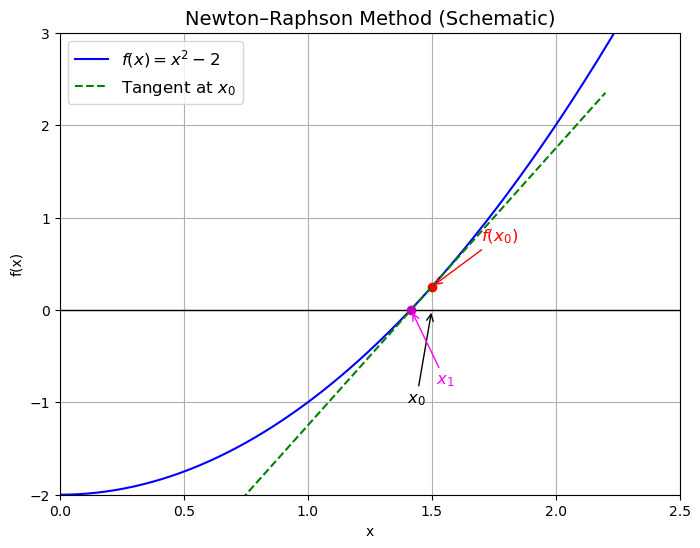

In [5]:
import numpy as np
import matplotlib.pyplot as plt

# Function and derivative
f = lambda x: x**2 - 2
f_prime = lambda x: 2*x

# Initial guess
x0 = 1.5
y0 = f(x0)

# Newton-Raphson update
x1 = x0 - f(x0)/f_prime(x0)

# Plot function
x = np.linspace(0, 2.5, 400)
y = f(x)

plt.figure(figsize=(8,6))
plt.axhline(0, color='k', linewidth=1)  # x-axis
plt.plot(x, y, 'b-', label=r"$f(x) = x^2 - 2$")

# Mark x0 and f(x0)
plt.plot(x0, y0, 'ro')
plt.annotate(r"$f(x_0)$", xy=(x0, y0), xytext=(x0+0.2, y0+0.5),
             arrowprops=dict(arrowstyle="->", color='red'), fontsize=12, color='red')
plt.annotate(r"$x_0$", xy=(x0, 0), xytext=(x0-0.1, -1),
             arrowprops=dict(arrowstyle="->", color='black'), fontsize=12)

# Tangent line at (x0, f(x0))
tangent_x = np.linspace(0.5, 2.2, 100)
tangent_y = y0 + f_prime(x0)*(tangent_x - x0)
plt.plot(tangent_x, tangent_y, 'g--', label="Tangent at $x_0$")

# Mark intersection with x-axis (x1)
plt.plot(x1, 0, 'mo')
plt.annotate(r"$x_1$", xy=(x1, 0), xytext=(x1+0.1, -0.8),
             arrowprops=dict(arrowstyle="->", color='magenta'), fontsize=12, color='magenta')

# Labels
plt.title("Newton–Raphson Method (Schematic)", fontsize=14)
plt.xlabel("x")
plt.ylabel("f(x)")
plt.legend(fontsize=12)
plt.ylim(-2, 3)
plt.xlim(0, 2.5)
plt.grid(True)
plt.show()


<>:44: SyntaxWarning: invalid escape sequence '\d'
<>:44: SyntaxWarning: invalid escape sequence '\d'
/var/folders/z9/4pcc0vs57ns2s8jv05__14_80000gn/T/ipykernel_25273/1949197526.py:44: SyntaxWarning: invalid escape sequence '\d'
  plt.scatter([x0 + delta_x], [f(x0 + delta_x)], color='blue', zorder=5, label="Varied point $x_0 + \delta x$")


Trial point x0 = 1.0
Derivative df/dx at x0 = 4.0
Chosen δx = 0.1
Predicted δf = 0.4000
Actual f(x0+δx) - f(x0) = 0.4100


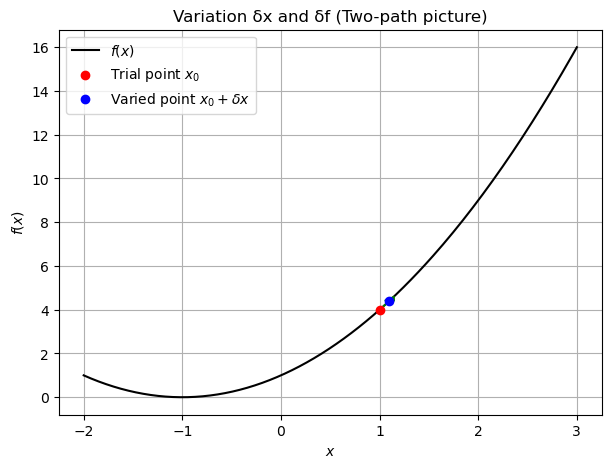

In [1]:
import numpy as np
import matplotlib.pyplot as plt

# Define the function f(x) we want to "optimize"
def f(x):
    return x**2 + 2*x + 1  # (x+1)^2, minimum at x=-1

# Choose a trial point x0
x0 = 1.0

# Choose a small variation direction eta and parameter epsilon
eta = 1.0  # variation direction
epsilons = np.linspace(-0.5, 0.5, 100)

# Compute trial path and varied path
trial_path_x = x0
varied_path_x = x0 + epsilons * eta

# Compute f(x) for trial and varied paths
trial_path_y = f(trial_path_x) * np.ones_like(epsilons)
varied_path_y = f(varied_path_x)

# The variation δf is the slope at ε=0 times the variation in ε
# This is essentially df/dx * δx
df_dx_at_x0 = 2*x0 + 2  # derivative of f(x)
delta_x = 0.1           # choose a small perturbation
delta_f = df_dx_at_x0 * delta_x

print(f"Trial point x0 = {x0}")
print(f"Derivative df/dx at x0 = {df_dx_at_x0}")
print(f"Chosen δx = {delta_x}")
print(f"Predicted δf = {delta_f:.4f}")
print(f"Actual f(x0+δx) - f(x0) = {f(x0+delta_x) - f(x0):.4f}")

# Plot
plt.figure(figsize=(7,5))
x_plot = np.linspace(-2, 3, 200)
plt.plot(x_plot, f(x_plot), label=r"$f(x)$", color='black')

# Mark the trial point
plt.scatter([x0], [f(x0)], color='red', zorder=5, label="Trial point $x_0$")

# Mark a varied point
plt.scatter([x0 + delta_x], [f(x0 + delta_x)], color='blue', zorder=5, label="Varied point $x_0 + \delta x$")

# Draw arrows showing variation
plt.arrow(x0, f(x0), delta_x, f(x0 + delta_x) - f(x0),
          head_width=0.1, head_length=0.2, fc='green', ec='green', zorder=4)

plt.title("Variation δx and δf (Two-path picture)")
plt.xlabel("$x$")
plt.ylabel("$f(x)$")
plt.legend()
plt.grid(True)
plt.show()


FileNotFoundError: [Errno 2] No such file or directory: '/mnt/data/classical_path_variation.pdf'

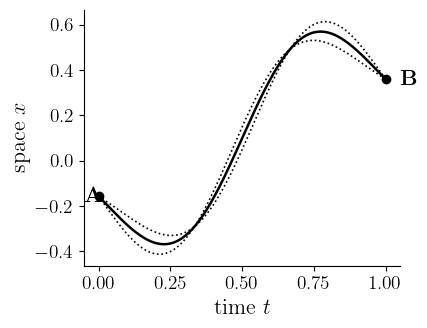

In [5]:
import matplotlib.pyplot as plt
import numpy as np

# Set up figure for publication quality
plt.rcParams.update({
    "text.usetex": True,
    "font.family": "serif",
    "font.size": 14,
    "axes.labelsize": 16,
    "axes.titlesize": 16,
    "legend.fontsize": 14
})

# Time axis
t = np.linspace(0, 1, 200)

# Classical path (smooth curve)
x_classical = 0.1 + 0.9 * np.sin(np.pi * t - np.pi/2) * np.exp(-0.5*(t-0.5)**2/0.1)

# Perturbed paths (slightly above/below classical)
x_upper = x_classical + 0.05 * np.sin(3*np.pi*t)
x_lower = x_classical - 0.05 * np.sin(3*np.pi*t)

# Create figure
fig, ax = plt.subplots(figsize=(4.5, 3.5))

# Plot classical path
ax.plot(t, x_classical, 'k-', linewidth=1.8, label='Classical path')

# Plot perturbed paths
ax.plot(t, x_upper, 'k:', linewidth=1.2)
ax.plot(t, x_lower, 'k:', linewidth=1.2)

# Mark points A and B
ax.plot(0, x_classical[0], 'ko', markersize=6)
ax.text(-0.05, x_classical[0], r'\textbf{A}', fontsize=16, va='center')

ax.plot(1, x_classical[-1], 'ko', markersize=6)
ax.text(1.05, x_classical[-1], r'\textbf{B}', fontsize=16, va='center')

# Axes labels
ax.set_xlabel(r"time $t$")
ax.set_ylabel(r"space $x$")

# Ticks for 0 and tau

# Remove top/right spines
ax.spines['top'].set_visible(False)
ax.spines['right'].set_visible(False)

# Adjust layout
plt.tight_layout()

# Save figure (vector format for publication)
plt.savefig("/mnt/data/classical_path_variation.pdf")
plt.savefig("/mnt/data/classical_path_variation.png", dpi=300)

plt.show()


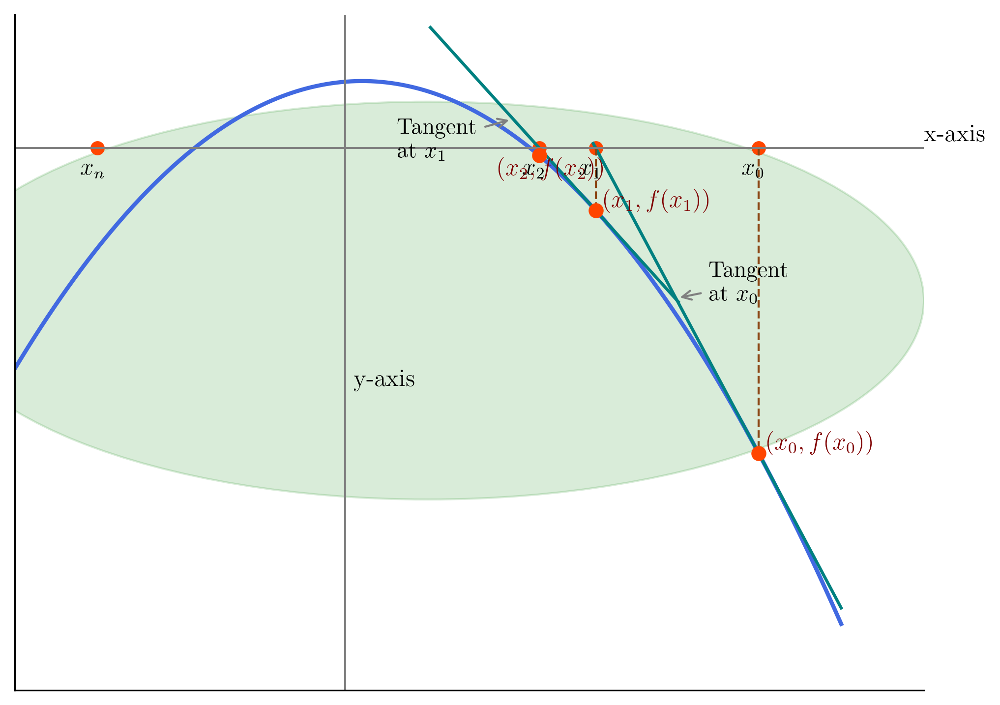

In [6]:
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.patches import Circle

# ----------------------------
# Function and derivative
# ----------------------------
def f(x):
    return np.exp(0.2 * x) - x**2

def df(x):
    return 0.2 * np.exp(0.2 * x) - 2*x

# ----------------------------
# Newton–Raphson iteration points
# ----------------------------
x0 = 2.5
x1 = x0 - f(x0)/df(x0)
x2 = x1 - f(x1)/df(x1)
xn = -1.5  # just for axis illustration

points = [(x0, f(x0)), (x1, f(x1)), (x2, f(x2))]

# ----------------------------
# Plot setup
# ----------------------------
fig, ax = plt.subplots(figsize=(7, 5), dpi=300)

# Light green background circle
circle = Circle(((x0+xn)/2, f(x0)/2), radius=3, color="green", alpha=0.15, zorder=0)
ax.add_patch(circle)

# Curve
X = np.linspace(xn-0.5, x0+0.5, 500)
ax.plot(X, f(X), color="royalblue", lw=2)

# Tangents
def tangent_line(xp):
    slope = df(xp)
    yp = f(xp)
    return lambda x: slope*(x - xp) + yp

X_tangent0 = np.linspace(x0-1, x0+0.5, 50)
ax.plot(X_tangent0, tangent_line(x0)(X_tangent0), color="teal", lw=1.5)

X_tangent1 = np.linspace(x1-1, x1+0.5, 50)
ax.plot(X_tangent1, tangent_line(x1)(X_tangent1), color="teal", lw=1.5)

# Points and vertical drops
for x, y in points:
    ax.scatter(x, y, color="orangered", s=40, zorder=5)
    ax.plot([x, x], [0, y], linestyle="--", color="saddlebrown", lw=1)

# Labels for points
ax.text(x0+0.05, f(x0)+0.05, r"$(x_0, f(x_0))$", fontsize=12, color="maroon")
ax.text(x1+0.05, f(x1)+0.05, r"$(x_1, f(x_1))$", fontsize=12, color="maroon")
ax.text(x2-0.25, f(x2)-0.3, r"$(x_2, f(x_2))$", fontsize=12, color="maroon")

# x-axis points
ax.scatter([x0, x1, x2, xn], [0, 0, 0, 0], color="orangered", s=35)
ax.text(xn-0.1, -0.4, r"$x_n$", fontsize=12)
ax.text(x2-0.1, -0.4, r"$x_2$", fontsize=12)
ax.text(x1-0.1, -0.4, r"$x_1$", fontsize=12)
ax.text(x0-0.1, -0.4, r"$x_0$", fontsize=12)

# Tangent annotations
ax.annotate("Tangent\nat $x_0$", xy=(x0-0.5, tangent_line(x0)(x0-0.5)),
            xytext=(x0-0.3, f(x0)/2), textcoords="data",
            arrowprops=dict(arrowstyle="->", color="gray"), fontsize=11)

ax.annotate("Tangent\nat $x_1$", xy=(x1-0.5, tangent_line(x1)(x1-0.5)),
            xytext=(x1-1.2, f(x1)+0.8), textcoords="data",
            arrowprops=dict(arrowstyle="->", color="gray"), fontsize=11)

# Axes
ax.axhline(0, color="gray", lw=1)
ax.axvline(0, color="gray", lw=1)

# Labels
ax.text(x0+1, 0.1, "x-axis", fontsize=12)
ax.text(0.05, f(x0)+1, "y-axis", fontsize=12)

# Limits
ax.set_xlim(xn-0.5, x0+1)
ax.set_ylim(min(f(X))-1, max(f(X))+1)

# Clean look
ax.set_xticks([])
ax.set_yticks([])
ax.spines['top'].set_visible(False)
ax.spines['right'].set_visible(False)

plt.tight_layout()
plt.show()


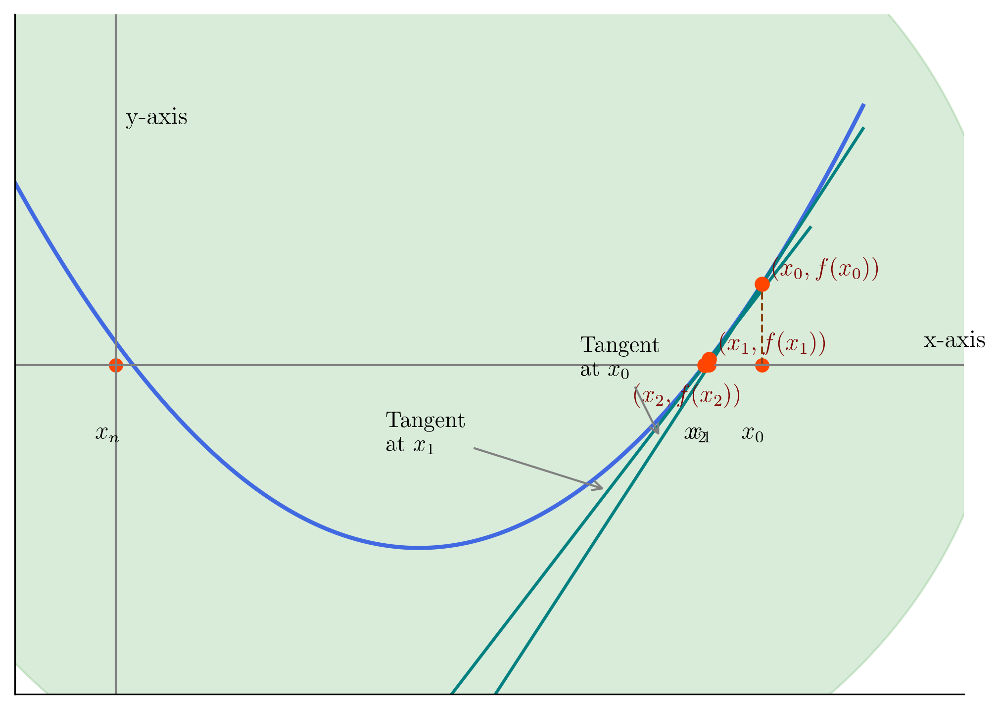

In [7]:
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.patches import Circle

# ----------------------------
# Function and derivative (convex upward)
# ----------------------------
def f(x):
    return 0.5 * (x - 1.5)**2 - 1  # upward parabola

def df(x):
    return (x - 1.5)

# ----------------------------
# Newton–Raphson iteration points
# ----------------------------
x0 = 3.2
x1 = x0 - f(x0)/df(x0)
x2 = x1 - f(x1)/df(x1)
xn = 0.0  # for axis labeling

points = [(x0, f(x0)), (x1, f(x1)), (x2, f(x2))]

# ----------------------------
# Plot setup
# ----------------------------
fig, ax = plt.subplots(figsize=(7, 5), dpi=300)

# Light green background circle
circle = Circle(((x0+xn)/2, (max(f(xn), f(x0)))/2), radius=2.8, 
                color="green", alpha=0.15, zorder=0)
ax.add_patch(circle)

# Curve
X = np.linspace(xn-0.5, x0+0.5, 500)
ax.plot(X, f(X), color="royalblue", lw=2)

# Tangents
def tangent_line(xp):
    slope = df(xp)
    yp = f(xp)
    return lambda x: slope*(x - xp) + yp

X_tangent0 = np.linspace(x0-2, x0+0.5, 50)
ax.plot(X_tangent0, tangent_line(x0)(X_tangent0), color="teal", lw=1.5)

X_tangent1 = np.linspace(x1-2, x1+0.5, 50)
ax.plot(X_tangent1, tangent_line(x1)(X_tangent1), color="teal", lw=1.5)

# Points and vertical drops
for x, y in points:
    ax.scatter(x, y, color="orangered", s=40, zorder=5)
    ax.plot([x, x], [0, y], linestyle="--", color="saddlebrown", lw=1)

# Labels for points
ax.text(x0+0.05, f(x0)+0.05, r"$(x_0, f(x_0))$", fontsize=12, color="maroon")
ax.text(x1+0.05, f(x1)+0.05, r"$(x_1, f(x_1))$", fontsize=12, color="maroon")
ax.text(x2-0.35, f(x2)-0.2, r"$(x_2, f(x_2))$", fontsize=12, color="maroon")

# x-axis points
ax.scatter([x0, x1, x2, xn], [0, 0, 0, 0], color="orangered", s=35)
ax.text(xn-0.1, -0.4, r"$x_n$", fontsize=12)
ax.text(x2-0.1, -0.4, r"$x_2$", fontsize=12)
ax.text(x1-0.1, -0.4, r"$x_1$", fontsize=12)
ax.text(x0-0.1, -0.4, r"$x_0$", fontsize=12)

# Tangent annotations
ax.annotate("Tangent\nat $x_0$", xy=(x0-0.5, tangent_line(x0)(x0-0.5)),
            xytext=(x0-0.9, f(x0)-0.5),
            arrowprops=dict(arrowstyle="->", color="gray"), fontsize=11)

ax.annotate("Tangent\nat $x_1$", xy=(x1-0.5, tangent_line(x1)(x1-0.5)),
            xytext=(x1-1.6, f(x1)-0.5),
            arrowprops=dict(arrowstyle="->", color="gray"), fontsize=11)

# Axes
ax.axhline(0, color="gray", lw=1)
ax.axvline(0, color="gray", lw=1)

# Labels
ax.text(x0+0.8, 0.1, "x-axis", fontsize=12)
ax.text(0.05, max(f(X))-0.1, "y-axis", fontsize=12)

# Limits
ax.set_xlim(xn-0.5, x0+1)
ax.set_ylim(min(f(X))-0.8, max(f(X))+0.5)

# Clean look
ax.set_xticks([])
ax.set_yticks([])
ax.spines['top'].set_visible(False)
ax.spines['right'].set_visible(False)

plt.tight_layout()
plt.show()


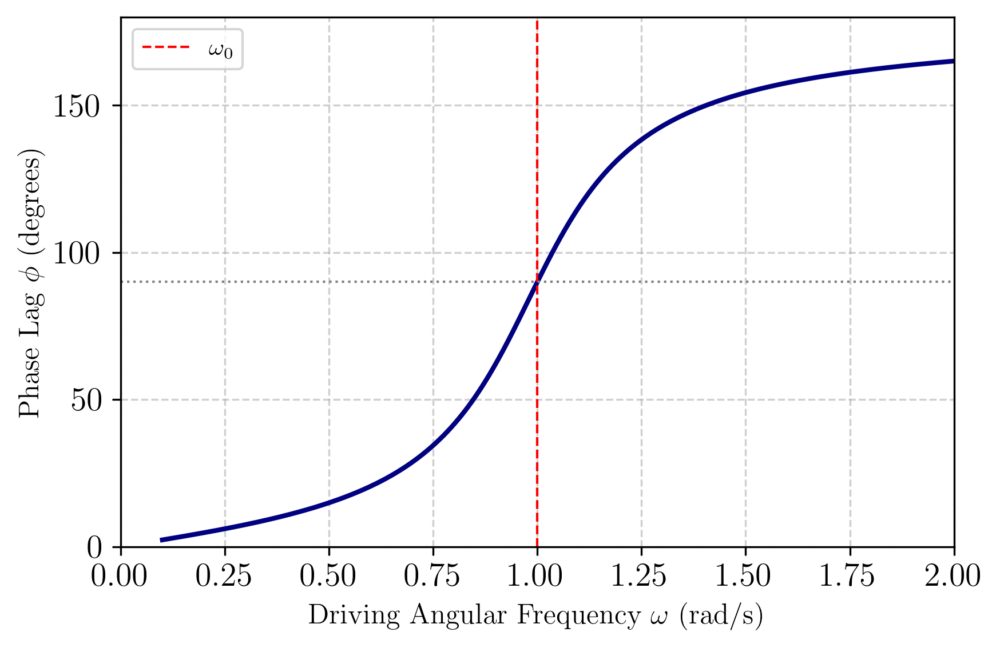

In [8]:
import numpy as np
import matplotlib.pyplot as plt

# Parameters
omega0 = 1.0       # Natural angular frequency
beta = 0.2         # Damping coefficient
omega = np.linspace(0.1, 2.0, 500)  # Driving frequency range

# Phase lag calculation
phi = np.arctan2(2 * beta * omega, omega0**2 - omega**2)

# Convert phase to degrees for better interpretability
phi_deg = np.degrees(phi)

# Plot settings
plt.figure(figsize=(6, 4), dpi=300)

plt.plot(omega, phi_deg, color='navy', linewidth=2)

# Labels and title
plt.xlabel(r"Driving Angular Frequency $\omega$ (rad/s)", fontsize=12)
plt.ylabel(r"Phase Lag $\phi$ (degrees)", fontsize=12)

# Reference lines
plt.axvline(omega0, color='red', linestyle='--', linewidth=1, label=r'$\omega_0$')
plt.axhline(90, color='gray', linestyle=':', linewidth=1)

# Style tweaks
plt.xlim(0, 2)
plt.ylim(0, 180)
plt.grid(True, which='both', linestyle='--', alpha=0.6)
plt.legend(fontsize=10)
plt.tight_layout()

# Save figure
plt.savefig("phase_lag_dho.png", dpi=300, bbox_inches='tight')

plt.show()


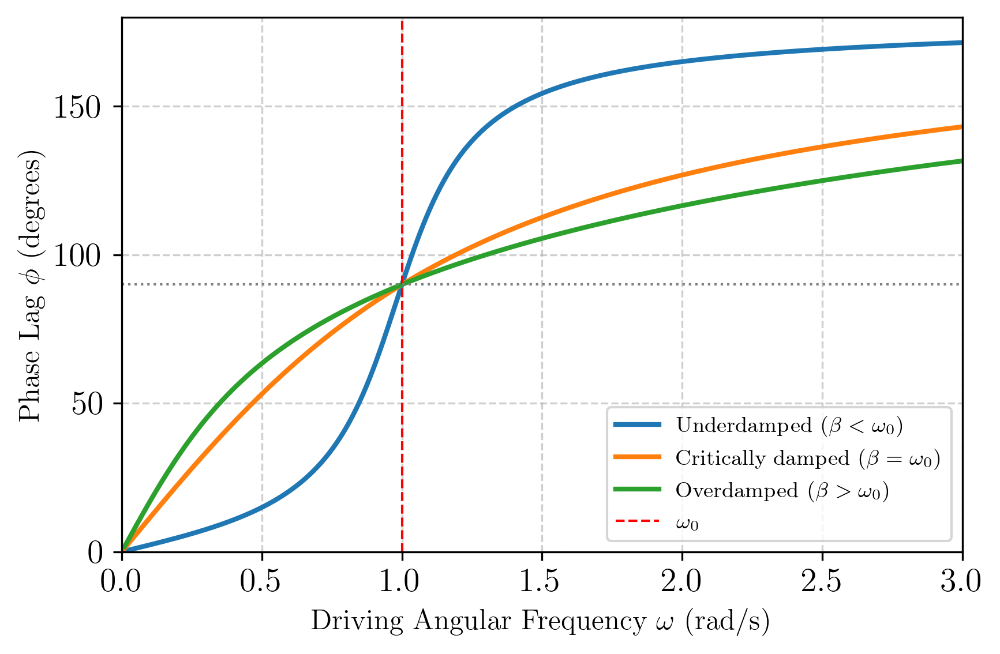

In [9]:
import numpy as np
import matplotlib.pyplot as plt

# Parameters
omega0 = 1.0                      # Natural angular frequency
omega = np.linspace(0.01, 3.0, 500)  # Driving frequency range

# Different damping regimes
betas = {
    "Underdamped ($\\beta < \\omega_0$)": 0.2,
    "Critically damped ($\\beta = \\omega_0$)": omega0,
    "Overdamped ($\\beta > \\omega_0$)": 1.5
}

# Plot setup
plt.figure(figsize=(6, 4), dpi=300)

for label, beta in betas.items():
    # Phase lag formula
    phi = np.arctan2(2 * beta * omega, omega0**2 - omega**2)
    phi_deg = np.degrees(phi)
    
    plt.plot(omega, phi_deg, linewidth=2, label=label)

# Labels
plt.xlabel(r"Driving Angular Frequency $\omega$ (rad/s)", fontsize=12)
plt.ylabel(r"Phase Lag $\phi$ (degrees)", fontsize=12)

# Reference lines
plt.axvline(omega0, color='red', linestyle='--', linewidth=1, label=r'$\omega_0$')
plt.axhline(90, color='gray', linestyle=':', linewidth=1)

# Style
plt.xlim(0, 3)
plt.ylim(0, 180)
plt.grid(True, linestyle='--', alpha=0.6)
plt.legend(fontsize=9)
plt.tight_layout()

# Save and show
plt.savefig("phase_lag_damping_regimes.png", dpi=300, bbox_inches='tight')
plt.show()


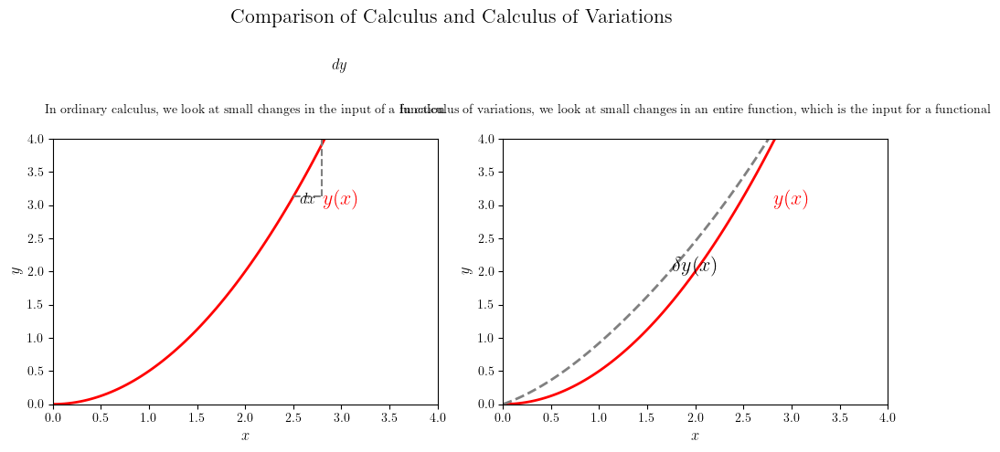

In [1]:
import matplotlib.pyplot as plt
import numpy as np

# Set the font to support LaTeX for math expressions
plt.rcParams['text.usetex'] = True
plt.rcParams['font.family'] = 'serif'

# Create a figure and two subplots
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(10, 5))

# Generate data for the plots
x = np.linspace(0, 4, 100)
y = 0.5 * x**2

# --- Plot 1: Ordinary Calculus ---
# Set axis limits
ax1.set_xlim(0, 4)
ax1.set_ylim(0, 4)
# Plot the function
ax1.plot(x, y, color='red', linewidth=2, label=r'$y(x)$')
# Add axis labels
ax1.set_xlabel(r'$x$', fontsize=12)
ax1.set_ylabel(r'$y$', fontsize=12)
# Add function label
ax1.text(3.0, 3.0, r'$y(x)$', color='red', fontsize=16, ha='center')

# Add the dx/dy annotations
x_point = 2.5
y_point = 0.5 * x_point**2
dx_len = 0.3
dy_len = y_point + 0.5 * (x_point + dx_len)**2 - y_point
# Draw the vertical line for dy
ax1.plot([x_point + dx_len, x_point + dx_len], [y_point, y_point + dy_len], '--', color='gray')
# Draw the horizontal line for dx
ax1.plot([x_point, x_point + dx_len], [y_point, y_point], '--', color='gray')
# Label dx and dy
ax1.text(x_point + dx_len / 2, y_point - 0.1, r'$dx$', fontsize=12, ha='center')
ax1.text(x_point + dx_len + 0.1, y_point + dy_len / 2, r'$dy$', fontsize=12, va='center')

# Set the text description below the plot
ax1.set_title(r'In ordinary calculus, we look at small changes in the input of a function',
              fontsize=10, ha='center', pad=20)


# --- Plot 2: Calculus of Variations ---
# Set axis limits
ax2.set_xlim(0, 4)
ax2.set_ylim(0, 4)
# Plot the original function
ax2.plot(x, y, color='red', linewidth=2)
# Add axis labels
ax2.set_xlabel(r'$x$', fontsize=12)
ax2.set_ylabel(r'$y$', fontsize=12)
# Add function label
ax2.text(3.0, 3.0, r'$y(x)$', color='red', fontsize=16, ha='center')

# Plot the perturbed function
y_perturbed = y + 0.5 * np.sin(x)
ax2.plot(x, y_perturbed, '--', color='gray', linewidth=2)

# Add the delta y annotation
ax2.text(2.0, 2.0, r'$\delta y(x)$', fontsize=16, ha='center')

# Set the text description below the plot
ax2.set_title(r'In calculus of variations, we look at small changes in an entire function, which is the input for a functional',
              fontsize=10, ha='center', pad=20)


# Adjust layout and display the plot
plt.tight_layout(rect=[0, 0, 1, 0.95]) # Adjust rect to make space for titles
plt.suptitle('Comparison of Calculus and Calculus of Variations', fontsize=16)
plt.show()



In [1]:
import math

def distance(P, Q):
    """
    Compute the Euclidean distance between two points P and Q in 2D.
    
    Parameters:
        P (tuple): Coordinates of the first point (x1, y1)
        Q (tuple): Coordinates of the second point (x2, y2)
    
    Returns:
        float: The distance between P and Q
    """
    x1, y1 = P
    x2, y2 = Q
    return math.sqrt((x2 - x1)**2 + (y2 - y1)**2)

# Example usage
P = (3, 4)
Q = (7, 1)
d = distance(P, Q)
print(f"The distance between P{P} and Q{Q} is {d:.2f}")


The distance between P(3, 4) and Q(7, 1) is 5.00


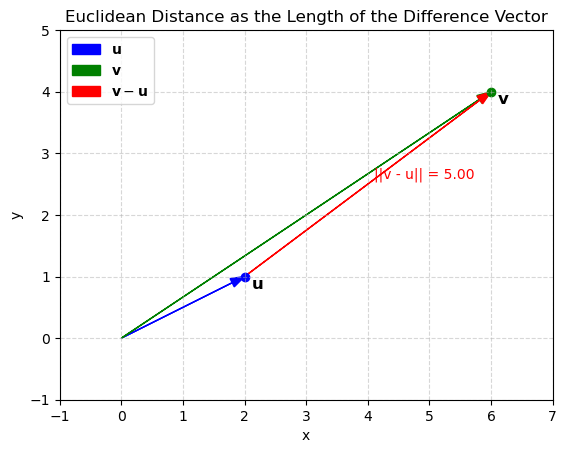

In [2]:
import numpy as np
import matplotlib.pyplot as plt

# Define two vectors (as points in 2D for visualization)
u = np.array([2, 1])
v = np.array([6, 4])

# Compute the difference vector
diff = v - u
distance = np.linalg.norm(diff)

# Create a plot
fig, ax = plt.subplots()
ax.set_aspect('equal')
ax.grid(True, linestyle='--', alpha=0.5)

# Draw origin
origin = np.array([0, 0])

# Plot u and v as arrows from the origin
ax.arrow(*origin, *u, head_width=0.15, color='blue', length_includes_head=True, label=r"$\mathbf{u}$")
ax.arrow(*origin, *v, head_width=0.15, color='green', length_includes_head=True, label=r"$\mathbf{v}$")

# Plot the difference vector from u to v
ax.arrow(*u, *(diff), head_width=0.15, color='red', length_includes_head=True, label=r"$\mathbf{v} - \mathbf{u}$")

# Mark points
ax.scatter(*u, color='blue')
ax.scatter(*v, color='green')

# Annotate points
ax.text(*(u + [0.1, -0.2]), r"$\mathbf{u}$", fontsize=12)
ax.text(*(v + [0.1, -0.2]), r"$\mathbf{v}$", fontsize=12)

# Annotate difference vector length
midpoint = u + diff / 2
ax.text(*(midpoint + [0.1, 0.1]), f"||v - u|| = {distance:.2f}", fontsize=10, color='red')

# Set limits
ax.set_xlim(-1, 7)
ax.set_ylim(-1, 5)
ax.set_xlabel("x")
ax.set_ylabel("y")
ax.legend()

plt.title("Euclidean Distance as the Length of the Difference Vector")
plt.show()


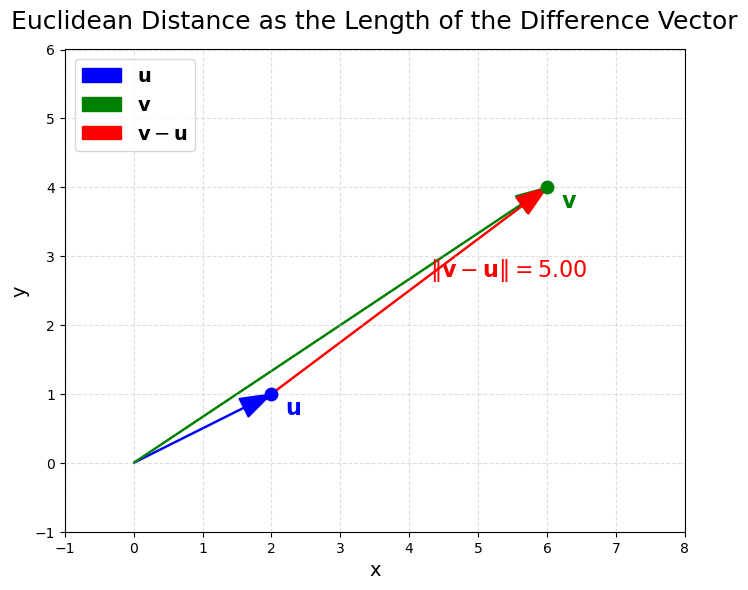

In [3]:
import numpy as np
import matplotlib.pyplot as plt

# --- Data ---
u = np.array([2, 1])
v = np.array([6, 4])
diff = v - u
distance = np.linalg.norm(diff)

# --- Plot setup ---
fig, ax = plt.subplots(figsize=(8, 8))  # Larger figure
ax.set_aspect('equal')
ax.grid(True, linestyle='--', alpha=0.4)
ax.set_xlim(-1, 8)
ax.set_ylim(-1, 6)
ax.set_xlabel("x", fontsize=14)
ax.set_ylabel("y", fontsize=14)

# --- Arrows ---
arrow_style = dict(width=0.015, head_width=0.3, length_includes_head=True)

# Origin to u
ax.arrow(0, 0, *u, color='blue', **arrow_style, label=r"$\mathbf{u}$")
# Origin to v
ax.arrow(0, 0, *v, color='green', **arrow_style, label=r"$\mathbf{v}$")
# u to v (difference vector)
ax.arrow(*u, *(diff), color='red', **arrow_style, label=r"$\mathbf{v} - \mathbf{u}$")

# --- Points ---
ax.scatter(*u, color='blue', s=80, zorder=5)
ax.scatter(*v, color='green', s=80, zorder=5)

# --- Labels for points ---
ax.text(*(u + [0.2, -0.3]), r"$\mathbf{u}$", fontsize=16, color='blue')
ax.text(*(v + [0.2, -0.3]), r"$\mathbf{v}$", fontsize=16, color='green')

# --- Distance annotation ---
midpoint = u + diff / 2
ax.text(*(midpoint + [0.3, 0.2]),
        rf"$\|\mathbf{{v}} - \mathbf{{u}}\| = {distance:.2f}$",
        fontsize=16, color='red', fontweight='bold')

# --- Legend & Title ---
ax.legend(fontsize=14, loc='upper left')
plt.title("Euclidean Distance as the Length of the Difference Vector", fontsize=18, pad=15)

plt.show()


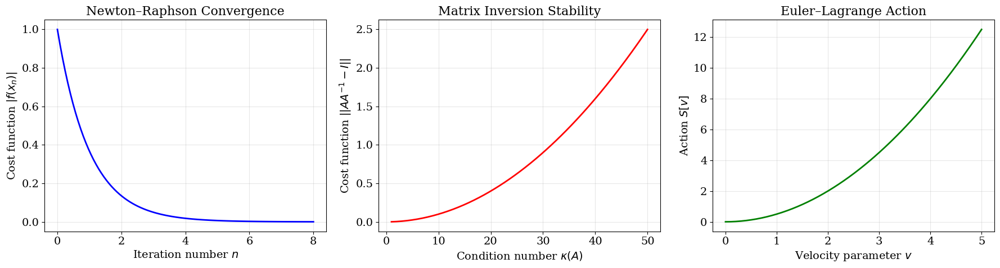

In [6]:
import numpy as np
import matplotlib.pyplot as plt

plt.rcParams.update({
    "font.size": 14,
    "axes.labelsize": 14,
    "axes.titlesize": 16,
    "lines.linewidth": 2,
    "figure.figsize": (18, 5),
    "font.family": "serif"
})

# ==========================
# Schematic Cost Functions
# ==========================

# Newton–Raphson: cost decays exponentially with iteration
iterations = np.linspace(0, 8, 100)
cost_newton = np.exp(-iterations)

# Matrix inversion: error grows polynomially with condition number
cond_nums = np.linspace(1, 50, 200)
cost_inversion = 1e-3 * (cond_nums**2)

# Euler–Lagrange: action ~ velocity^2 (quadratic growth)
velocities = np.linspace(0, 5, 200)
action = 0.5 * velocities**2

# ==========================
# Plotting
# ==========================
fig, axs = plt.subplots(1, 3, figsize=(18, 5))

# --- Newton–Raphson ---
axs[0].plot(iterations, cost_newton, color="blue")
axs[0].set_title("Newton–Raphson Convergence")
axs[0].set_xlabel("Iteration number $n$")
axs[0].set_ylabel("Cost function $|f(x_n)|$")
axs[0].grid(alpha=0.3)

# --- Matrix inversion ---
axs[1].plot(cond_nums, cost_inversion, color="red")
axs[1].set_title("Matrix Inversion Stability")
axs[1].set_xlabel("Condition number $\\kappa(A)$")
axs[1].set_ylabel("Cost function $||AA^{-1} - I||$")
axs[1].grid(alpha=0.3)

# --- Euler–Lagrange ---
axs[2].plot(velocities, action, color="green")
axs[2].set_title("Euler–Lagrange Action")
axs[2].set_xlabel("Velocity parameter $v$")
axs[2].set_ylabel("Action $S[v]$")
axs[2].grid(alpha=0.3)

plt.tight_layout()
plt.show()


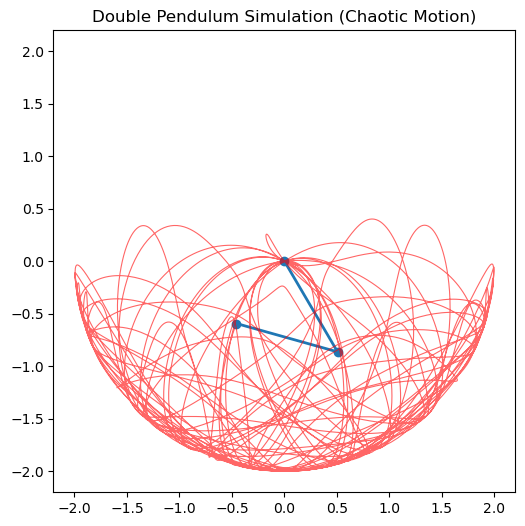

In [2]:
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.animation import FuncAnimation

# Parameters
g = 9.81
L1, L2 = 1.0, 1.0   # rod lengths
m1, m2 = 1.0, 1.0   # masses
dt = 0.01
steps = 6000

# Initial conditions
theta1 = np.pi / 2
theta2 = np.pi / 2.2
omega1 = 0.0
omega2 = 0.0

# Storage
x1_list, y1_list, x2_list, y2_list = [], [], [], []

def derivatives(theta1, omega1, theta2, omega2):
    """Equations of motion for double pendulum"""
    delta = theta2 - theta1

    den1 = (m1+m2)*L1 - m2*L1*np.cos(delta)**2
    den2 = (L2/L1)*den1

    a1 = ((m2*L1*omega1**2*np.sin(delta)*np.cos(delta) +
          m2*g*np.sin(theta2)*np.cos(delta) +
          m2*L2*omega2**2*np.sin(delta) -
          (m1+m2)*g*np.sin(theta1)) / den1)

    a2 = ((-m2*L2*omega2**2*np.sin(delta)*np.cos(delta) +
          (m1+m2)*g*np.sin(theta1)*np.cos(delta) -
          (m1+m2)*L1*omega1**2*np.sin(delta) -
          (m1+m2)*g*np.sin(theta2)) / den2)

    return a1, a2

# Integrate with RK4
for _ in range(steps):
    x1 = L1*np.sin(theta1)
    y1 = -L1*np.cos(theta1)
    x2 = x1 + L2*np.sin(theta2)
    y2 = y1 - L2*np.cos(theta2)

    x1_list.append(x1)
    y1_list.append(y1)
    x2_list.append(x2)
    y2_list.append(y2)

    a1, a2 = derivatives(theta1, omega1, theta2, omega2)

    k1_omega1, k1_omega2 = a1*dt, a2*dt
    k1_theta1, k1_theta2 = omega1*dt, omega2*dt

    a1, a2 = derivatives(theta1+0.5*k1_theta1, omega1+0.5*k1_omega1,
                         theta2+0.5*k1_theta2, omega2+0.5*k1_omega2)
    k2_omega1, k2_omega2 = a1*dt, a2*dt
    k2_theta1, k2_theta2 = (omega1+0.5*k1_omega1)*dt, (omega2+0.5*k1_omega2)*dt

    a1, a2 = derivatives(theta1+0.5*k2_theta1, omega1+0.5*k2_omega1,
                         theta2+0.5*k2_theta2, omega2+0.5*k2_omega2)
    k3_omega1, k3_omega2 = a1*dt, a2*dt
    k3_theta1, k3_theta2 = (omega1+0.5*k2_omega1)*dt, (omega2+0.5*k2_omega2)*dt

    a1, a2 = derivatives(theta1+k3_theta1, omega1+k3_omega1,
                         theta2+k3_theta2, omega2+k3_omega2)
    k4_omega1, k4_omega2 = a1*dt, a2*dt
    k4_theta1, k4_theta2 = (omega1+k3_omega1)*dt, (omega2+k3_omega2)*dt

    theta1 += (k1_theta1 + 2*k2_theta1 + 2*k3_theta1 + k4_theta1)/6
    theta2 += (k1_theta2 + 2*k2_theta2 + 2*k3_theta2 + k4_theta2)/6
    omega1 += (k1_omega1 + 2*k2_omega1 + 2*k3_omega1 + k4_omega1)/6
    omega2 += (k1_omega2 + 2*k2_omega2 + 2*k3_omega2 + k4_omega2)/6

# Animation
fig, ax = plt.subplots(figsize=(6,6))

# Full reach is L1 + L2
reach = L1 + L2
ax.set_xlim(-reach-0.2, reach+0.2)
ax.set_ylim(-reach-0.2, reach+0.2)
ax.set_aspect('equal')
ax.set_title("Double Pendulum Simulation (Chaotic Motion)")

line, = ax.plot([], [], 'o-', lw=2)
trail, = ax.plot([], [], 'r-', lw=0.8, alpha=0.6)

def init():
    line.set_data([], [])
    trail.set_data([], [])
    return line, trail

def update(frame):
    x = [0, x1_list[frame], x2_list[frame]]
    y = [0, y1_list[frame], y2_list[frame]]
    line.set_data(x, y)
    trail.set_data(x2_list[:frame], y2_list[:frame])
    return line, trail

ani = FuncAnimation(fig, update, frames=steps,
                    init_func=init, blit=True, interval=10)

ani = FuncAnimation(fig, update, frames=steps,
                    init_func=init, blit=True, interval=10)

# --- Save the animation as MP4 ---
ani.save("double_pendulum.mp4", fps=60, dpi=150, writer="ffmpeg")


plt.show()


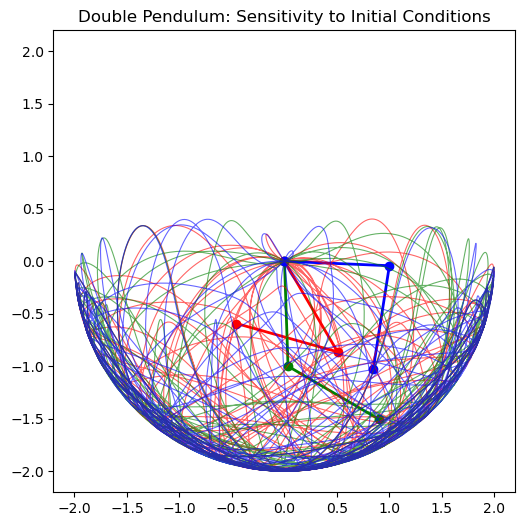

In [3]:
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.animation import FuncAnimation

# Parameters
g = 9.81
L1, L2 = 1.0, 1.0   # rod lengths
m1, m2 = 1.0, 1.0   # masses
dt = 0.01
steps = 6000

# Slightly different initial conditions
initial_conditions = [
    [np.pi/2,   np.pi/2.2, 0.0, 0.0],     # baseline
    [np.pi/2,   np.pi/2.2001, 0.0, 0.0],  # very small change
    [np.pi/2,   np.pi/2.2002, 0.0, 0.0],  # even smaller change
]

colors = ['r', 'g', 'b']  # one color per pendulum

def derivatives(theta1, omega1, theta2, omega2):
    """Equations of motion for double pendulum"""
    delta = theta2 - theta1

    den1 = (m1+m2)*L1 - m2*L1*np.cos(delta)**2
    den2 = (L2/L1)*den1

    a1 = ((m2*L1*omega1**2*np.sin(delta)*np.cos(delta) +
          m2*g*np.sin(theta2)*np.cos(delta) +
          m2*L2*omega2**2*np.sin(delta) -
          (m1+m2)*g*np.sin(theta1)) / den1)

    a2 = ((-m2*L2*omega2**2*np.sin(delta)*np.cos(delta) +
          (m1+m2)*g*np.sin(theta1)*np.cos(delta) -
          (m1+m2)*L1*omega1**2*np.sin(delta) -
          (m1+m2)*g*np.sin(theta2)) / den2)

    return a1, a2

# Function to integrate a single double pendulum
def simulate(theta1, theta2, omega1, omega2):
    x1_list, y1_list, x2_list, y2_list = [], [], [], []
    for _ in range(steps):
        x1 = L1*np.sin(theta1)
        y1 = -L1*np.cos(theta1)
        x2 = x1 + L2*np.sin(theta2)
        y2 = y1 - L2*np.cos(theta2)

        x1_list.append(x1)
        y1_list.append(y1)
        x2_list.append(x2)
        y2_list.append(y2)

        a1, a2 = derivatives(theta1, omega1, theta2, omega2)

        # RK4 integration
        k1_omega1, k1_omega2 = a1*dt, a2*dt
        k1_theta1, k1_theta2 = omega1*dt, omega2*dt

        a1, a2 = derivatives(theta1+0.5*k1_theta1, omega1+0.5*k1_omega1,
                             theta2+0.5*k1_theta2, omega2+0.5*k1_omega2)
        k2_omega1, k2_omega2 = a1*dt, a2*dt
        k2_theta1, k2_theta2 = (omega1+0.5*k1_omega1)*dt, (omega2+0.5*k1_omega2)*dt

        a1, a2 = derivatives(theta1+0.5*k2_theta1, omega1+0.5*k2_omega1,
                             theta2+0.5*k2_theta2, omega2+0.5*k2_omega2)
        k3_omega1, k3_omega2 = a1*dt, a2*dt
        k3_theta1, k3_theta2 = (omega1+0.5*k2_omega1)*dt, (omega2+0.5*k2_omega2)*dt

        a1, a2 = derivatives(theta1+k3_theta1, omega1+k3_omega1,
                             theta2+k3_theta2, omega2+k3_omega2)
        k4_omega1, k4_omega2 = a1*dt, a2*dt
        k4_theta1, k4_theta2 = (omega1+k3_omega1)*dt, (omega2+k3_omega2)*dt

        theta1 += (k1_theta1 + 2*k2_theta1 + 2*k3_theta1 + k4_theta1)/6
        theta2 += (k1_theta2 + 2*k2_theta2 + 2*k3_theta2 + k4_theta2)/6
        omega1 += (k1_omega1 + 2*k2_omega1 + 2*k3_omega1 + k4_omega1)/6
        omega2 += (k1_omega2 + 2*k2_omega2 + 2*k3_omega2 + k4_omega2)/6

    return np.array(x1_list), np.array(y1_list), np.array(x2_list), np.array(y2_list)

# Run simulations
trajectories = [simulate(*ic) for ic in initial_conditions]

# Animation
fig, ax = plt.subplots(figsize=(6,6))
reach = L1 + L2
ax.set_xlim(-reach-0.2, reach+0.2)
ax.set_ylim(-reach-0.2, reach+0.2)
ax.set_aspect('equal')
ax.set_title("Double Pendulum: Sensitivity to Initial Conditions")

lines = [ax.plot([], [], 'o-', lw=2, color=c)[0] for c in colors]
trails = [ax.plot([], [], '-', lw=0.8, alpha=0.6, color=c)[0] for c in colors]

def init():
    for line, trail in zip(lines, trails):
        line.set_data([], [])
        trail.set_data([], [])
    return lines + trails

def update(frame):
    for (x1, y1, x2, y2), line, trail in zip(trajectories, lines, trails):
        x = [0, x1[frame], x2[frame]]
        y = [0, y1[frame], y2[frame]]
        line.set_data(x, y)
        trail.set_data(x2[:frame], y2[:frame])
    return lines + trails

ani = FuncAnimation(fig, update, frames=steps,
                    init_func=init, blit=True, interval=10)

# Save the animation
ani.save("triple_double_pendulum.mp4", fps=60, dpi=150, writer="ffmpeg")

plt.show()


/var/folders/z9/4pcc0vs57ns2s8jv05__14_80000gn/T/ipykernel_2148/2990036769.py:66: MatplotlibDeprecationWarning: Setting data with a non sequence type is deprecated since 3.7 and will be remove two minor releases later
  dot.set_data(trajectory[frame,0], trajectory[frame,1])


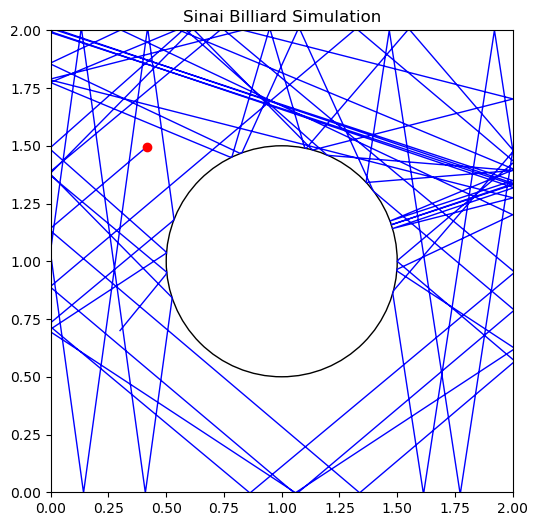

In [4]:
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.animation import FuncAnimation

# Parameters
L = 2.0       # size of the square box (0, L) x (0, L)
R = 0.5       # radius of circular obstacle
dt = 0.01     # time step
steps = 5000  # number of simulation steps

# Initial conditions
pos = np.array([0.3, 0.7])      # initial position
v = np.array([0.9, 1.1])        # velocity

# Storage
trajectory = [pos.copy()]

def reflect(pos, v):
    """Reflects off walls and circular obstacle."""
    # Reflect on square walls
    if pos[0] <= 0 or pos[0] >= L:
        v[0] *= -1
    if pos[1] <= 0 or pos[1] >= L:
        v[1] *= -1

    # Reflect on circular obstacle (centered at L/2, L/2)
    center = np.array([L/2, L/2])
    d = pos - center
    dist = np.linalg.norm(d)
    if dist <= R:
        # normal vector at collision
        n = d / dist
        v = v - 2 * np.dot(v, n) * n
        pos = center + n * R  # reposition on boundary
    return pos, v

# Simulation loop
for _ in range(steps):
    pos = pos + v * dt
    pos, v = reflect(pos, v)
    trajectory.append(pos.copy())

trajectory = np.array(trajectory)

# --- Animation ---
fig, ax = plt.subplots(figsize=(6,6))
ax.set_xlim(0, L)
ax.set_ylim(0, L)
ax.set_aspect('equal')
ax.set_title("Sinai Billiard Simulation")

# Draw circular obstacle
circle = plt.Circle((L/2, L/2), R, color='black', fill=False)
ax.add_patch(circle)

line, = ax.plot([], [], lw=1, color='blue')
dot, = ax.plot([], [], 'ro')

def init():
    line.set_data([], [])
    dot.set_data([], [])
    return line, dot

def update(frame):
    line.set_data(trajectory[:frame,0], trajectory[:frame,1])
    dot.set_data(trajectory[frame,0], trajectory[frame,1])
    return line, dot

ani = FuncAnimation(fig, update, frames=len(trajectory),
                    init_func=init, blit=True, interval=10)

# Save animation
ani.save("sinai_billiard.mp4", fps=60, dpi=150, writer="ffmpeg")

plt.show()


<>:26: SyntaxWarning: invalid escape sequence '\m'
<>:26: SyntaxWarning: invalid escape sequence '\m'
/var/folders/z9/4pcc0vs57ns2s8jv05__14_80000gn/T/ipykernel_2148/61479984.py:26: SyntaxWarning: invalid escape sequence '\m'
  ax.plot(x, pdf, "r-", lw=2, label=f"Gaussian fit\n$\mu={mu:.2f}, \\sigma={sigma:.2f}$")


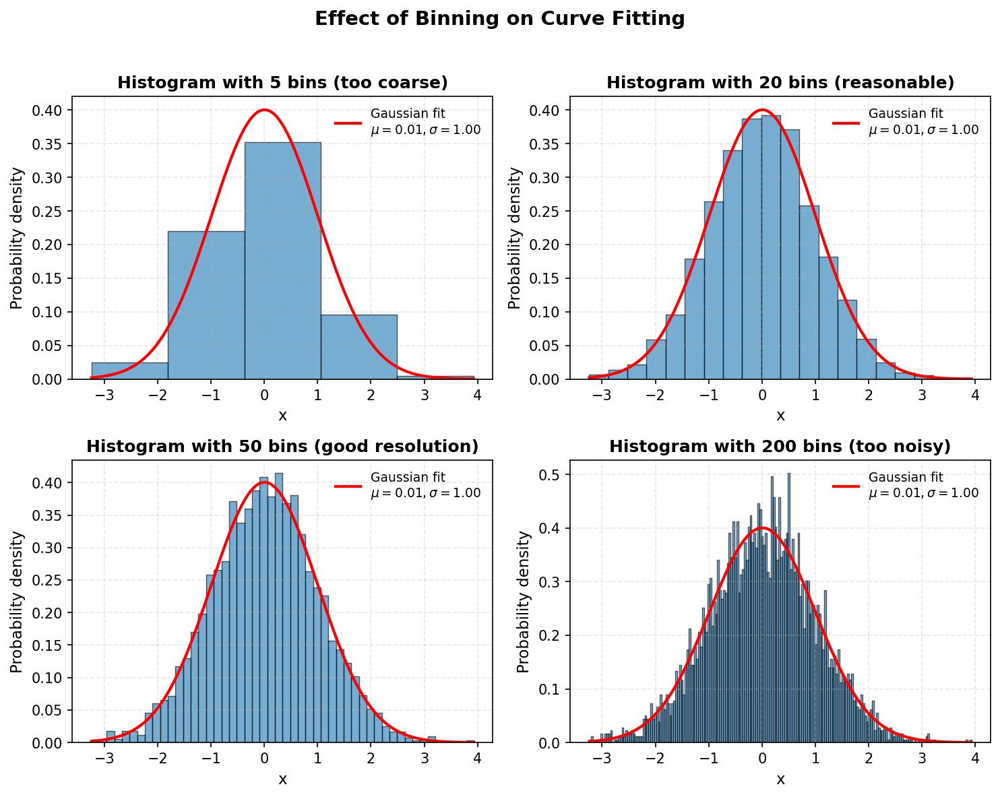

In [6]:
import numpy as np
import matplotlib.pyplot as plt
from scipy.stats import norm

# -----------------------------
# Generate synthetic data
# -----------------------------
np.random.seed(42)
N = 5000
data = np.random.normal(loc=0, scale=1, size=N)

# -----------------------------
# Helper: plot histogram + fit
# -----------------------------
def plot_hist_with_fit(data, bins, ax, title):
    # Histogram
    counts, bin_edges, _ = ax.hist(
        data, bins=bins, density=True, alpha=0.6,
        color="C0", edgecolor="black", linewidth=0.7
    )
    
    # Gaussian fit
    mu, sigma = norm.fit(data)
    x = np.linspace(min(data), max(data), 400)
    pdf = norm.pdf(x, mu, sigma)
    ax.plot(x, pdf, "r-", lw=2, label=f"Gaussian fit\n$\mu={mu:.2f}, \\sigma={sigma:.2f}$")
    
    # Style
    ax.set_title(title, fontsize=12, fontweight="bold")
    ax.set_xlabel("x", fontsize=11)
    ax.set_ylabel("Probability density", fontsize=11)
    ax.legend(fontsize=9, frameon=False)
    ax.grid(alpha=0.3, linestyle="--")

# -----------------------------
# Plot comparison with 4 bins choices
# -----------------------------
fig, axes = plt.subplots(2, 2, figsize=(10, 8), dpi=150)

plot_hist_with_fit(data, bins=5, ax=axes[0, 0],
                   title="Histogram with 5 bins (too coarse)")
plot_hist_with_fit(data, bins=20, ax=axes[0, 1],
                   title="Histogram with 20 bins (reasonable)")
plot_hist_with_fit(data, bins=50, ax=axes[1, 0],
                   title="Histogram with 50 bins (good resolution)")
plot_hist_with_fit(data, bins=200, ax=axes[1, 1],
                   title="Histogram with 200 bins (too noisy)")

plt.suptitle("Effect of Binning on Curve Fitting", fontsize=14, fontweight="bold")
plt.tight_layout(rect=[0, 0, 1, 0.96])
plt.show()


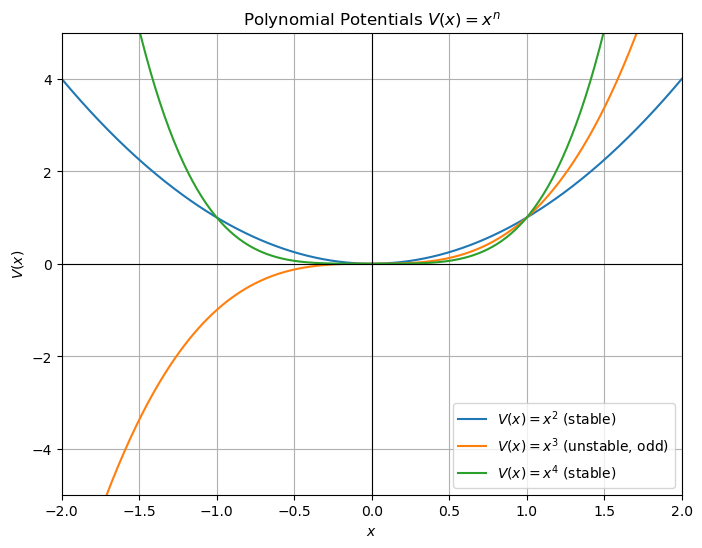

In [2]:
import numpy as np
import matplotlib.pyplot as plt

# Define range for x
x = np.linspace(-2, 2, 400)

# Define potentials for n=2,3,4
V2 = x**2
V3 = x**3
V4 = x**4

# Plot
plt.figure(figsize=(8,6))
plt.plot(x, V2, label=r"$V(x) = x^2$ (stable)")
plt.plot(x, V3, label=r"$V(x) = x^3$ (unstable, odd)")
plt.plot(x, V4, label=r"$V(x) = x^4$ (stable)")

# Mark origin
plt.axhline(0, color="black", linewidth=0.8)
plt.axvline(0, color="black", linewidth=0.8)

plt.ylim(-5, 5)
plt.xlim(-2, 2)
plt.xlabel(r"$x$")
plt.ylabel(r"$V(x)$")
plt.title("Polynomial Potentials $V(x) = x^n$")
plt.legend()
plt.grid(True)
plt.show()


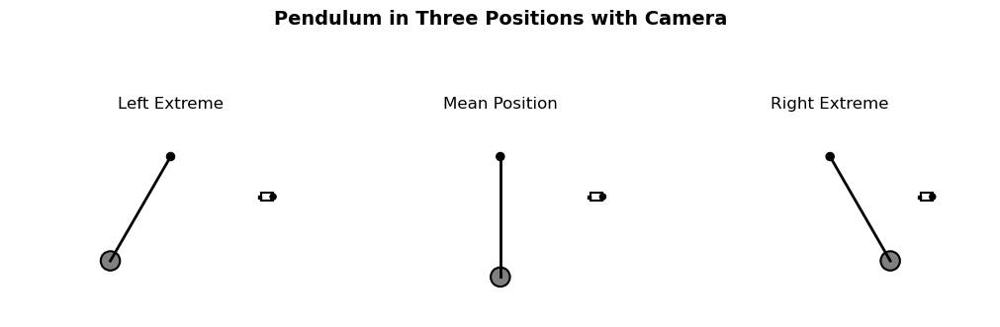

In [3]:
import matplotlib.pyplot as plt
import matplotlib.patches as patches
import numpy as np

def draw_pendulum(ax, angle, pivot=(0, 0), length=1.5):
    """
    Draw a pendulum at a given angle.
    angle: in radians, relative to vertical.
    pivot: (x,y) of suspension point.
    length: length of pendulum rod.
    """
    # bob position
    x = pivot[0] + length * np.sin(angle)
    y = pivot[1] - length * np.cos(angle)
    
    # rod
    ax.plot([pivot[0], x], [pivot[1], y], color="black", lw=2)
    # pivot point
    ax.add_patch(plt.Circle(pivot, 0.05, color="black"))
    # bob
    ax.add_patch(plt.Circle((x, y), 0.12, color="gray", ec="black", lw=1.5))
    
    return (x, y)

def draw_camera(ax, pos, scale=0.15):
    """
    Draw a simple camera icon at position pos = (x,y).
    """
    x, y = pos
    # body
    cam_body = patches.Rectangle((x - scale/2, y - scale/3), scale, 2*scale/3,
                                 linewidth=1.5, edgecolor='black', facecolor='white')
    ax.add_patch(cam_body)
    # lens
    lens = plt.Circle((x + scale/2, y), scale/4, fill=True, color="black")
    ax.add_patch(lens)
    # small viewfinder
    vf = patches.Rectangle((x - scale/2 - scale/4, y - scale/8),
                           scale/4, scale/4, linewidth=1, edgecolor='black', facecolor='black')
    ax.add_patch(vf)

# Create figure
fig, axes = plt.subplots(1, 3, figsize=(10, 4), constrained_layout=True)

angles = [np.deg2rad(-30), 0, np.deg2rad(30)]  # left, mean, right positions
titles = ["Left Extreme", "Mean Position", "Right Extreme"]

for ax, ang, title in zip(axes, angles, titles):
    bob = draw_pendulum(ax, ang)
    # place camera near bottom right
    draw_camera(ax, (1.2, -0.5))
    
    ax.set_xlim(-2, 2)
    ax.set_ylim(-2, 0.5)
    ax.set_aspect('equal')
    ax.axis('off')
    ax.set_title(title, fontsize=12)

plt.suptitle("Pendulum in Three Positions with Camera", fontsize=14, weight="bold")
plt.show()


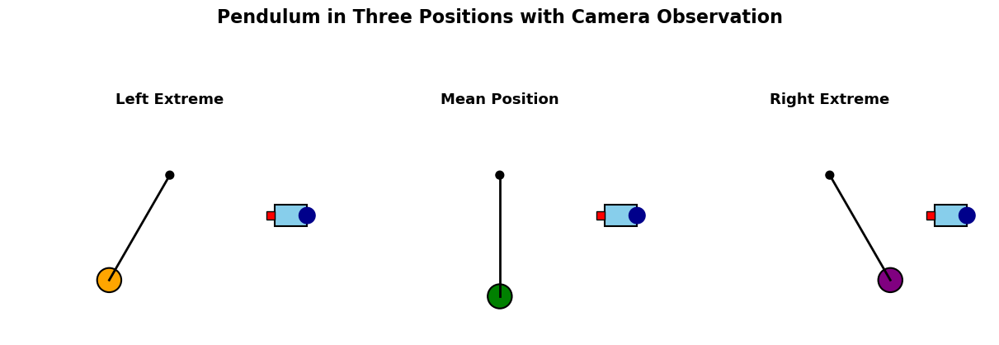

<Figure size 640x480 with 0 Axes>

In [4]:
def draw_pendulum(ax, angle, pivot=(0, 0), length=1.5, color="black", bob_color="gray"):
    """
    Draw a pendulum at a given angle with custom colors.
    """
    # bob position
    x = pivot[0] + length * np.sin(angle)
    y = pivot[1] - length * np.cos(angle)
    
    # rod
    ax.plot([pivot[0], x], [pivot[1], y], color=color, lw=2)
    # pivot point
    ax.add_patch(plt.Circle(pivot, 0.05, color=color))
    # bob
    ax.add_patch(plt.Circle((x, y), 0.15, color=bob_color, ec="black", lw=1.5))
    
    return (x, y)

def draw_camera(ax, pos, scale=0.3):
    """
    Draw a larger, colorful camera icon at position pos = (x,y).
    """
    x, y = pos
    # body
    cam_body = patches.Rectangle((x - scale/2, y - scale/3), scale, 2*scale/3,
                                 linewidth=1.5, edgecolor='black', facecolor='skyblue')
    ax.add_patch(cam_body)
    # lens
    lens = plt.Circle((x + scale/2, y), scale/4, fill=True, color="darkblue")
    ax.add_patch(lens)
    # small viewfinder
    vf = patches.Rectangle((x - scale/2 - scale/4, y - scale/8),
                           scale/4, scale/4, linewidth=1, edgecolor='black', facecolor='red')
    ax.add_patch(vf)

# Create colorful figure
fig, axes = plt.subplots(1, 3, figsize=(12, 5), constrained_layout=True)

angles = [np.deg2rad(-30), 0, np.deg2rad(30)]  # left, mean, right positions
titles = ["Left Extreme", "Mean Position", "Right Extreme"]
bob_colors = ["orange", "green", "purple"]

for ax, ang, title, bob_col in zip(axes, angles, titles, bob_colors):
    bob = draw_pendulum(ax, ang, bob_color=bob_col)
    # place larger colorful camera near bottom right
    draw_camera(ax, (1.5, -0.5), scale=0.4)
    
    ax.set_xlim(-2, 2)
    ax.set_ylim(-2, 0.8)
    ax.set_aspect('equal')
    ax.axis('off')
    ax.set_title(title, fontsize=13, weight="bold")

plt.suptitle("Pendulum in Three Positions with Camera Observation", fontsize=16, weight="bold")
plt.show()

plt.savefig("pendulum_camera_color.png", dpi=400, bbox_inches="tight")


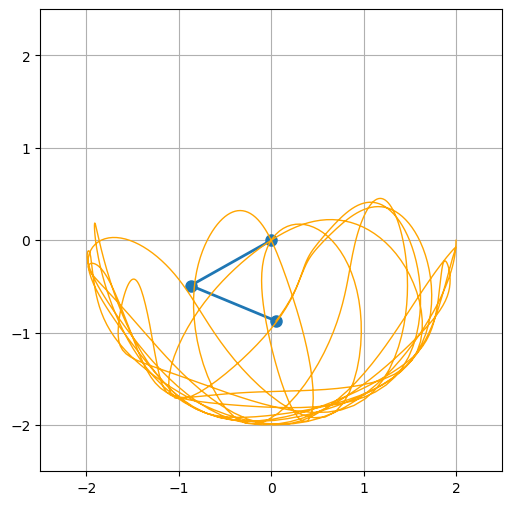

In [1]:
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.animation import FuncAnimation

# --------------------------
# Parameters
# --------------------------
g = 9.81
L1, L2 = 1.0, 1.0
m1, m2 = 1.0, 1.0

theta1, omega1 = np.pi / 2, 0.0
theta2, omega2 = np.pi / 2, 0.0

dt = 0.02
t_max = 20
t = np.arange(0, t_max, dt)

# --------------------------
# Equations of motion
# --------------------------
def derivatives(state):
    th1, w1, th2, w2 = state
    delta = th2 - th1

    denom1 = (m1 + m2) * L1 - m2 * L1 * np.cos(delta)**2
    denom2 = (L2 / L1) * denom1

    a1 = (m2 * L1 * w1**2 * np.sin(delta) * np.cos(delta) +
          m2 * g * np.sin(th2) * np.cos(delta) +
          m2 * L2 * w2**2 * np.sin(delta) -
          (m1 + m2) * g * np.sin(th1)) / denom1

    a2 = (-m2 * L2 * w2**2 * np.sin(delta) * np.cos(delta) +
          (m1 + m2) * g * np.sin(th1) * np.cos(delta) -
          (m1 + m2) * L1 * w1**2 * np.sin(delta) -
          (m1 + m2) * g * np.sin(th2)) / denom2

    return np.array([w1, a1, w2, a2])

# --------------------------
# RK4 solver
# --------------------------
def rk4_step(state, dt):
    k1 = derivatives(state)
    k2 = derivatives(state + 0.5 * dt * k1)
    k3 = derivatives(state + 0.5 * dt * k2)
    k4 = derivatives(state + dt * k3)
    return state + (dt / 6) * (k1 + 2*k2 + 2*k3 + k4)

# --------------------------
# Simulation
# --------------------------
state = np.array([theta1, omega1, theta2, omega2])
theta1_list, theta2_list = [], []

for _ in t:
    theta1_list.append(state[0])
    theta2_list.append(state[2])
    state = rk4_step(state, dt)

# Cartesian coords
x1 = L1 * np.sin(theta1_list)
y1 = -L1 * np.cos(theta1_list)
x2 = x1 + L2 * np.sin(theta2_list)
y2 = y1 - L2 * np.cos(theta2_list)

# --------------------------
# Animation setup
# --------------------------
fig, ax = plt.subplots(figsize=(6, 6))
ax.set_xlim(-(L1 + L2) - 0.5, (L1 + L2) + 0.5)
ax.set_ylim(-(L1 + L2) - 0.5, (L1 + L2) + 0.5)
ax.set_aspect('equal')
ax.grid()

line, = ax.plot([], [], 'o-', lw=2, markersize=8)
trace, = ax.plot([], [], '-', lw=1, color='orange')
trace_x, trace_y = [], []

def init():
    line.set_data([], [])
    trace.set_data([], [])
    return line, trace

def update(frame):
    this_x = [0, x1[frame], x2[frame]]
    this_y = [0, y1[frame], y2[frame]]

    line.set_data(this_x, this_y)
    trace_x.append(x2[frame])
    trace_y.append(y2[frame])
    trace.set_data(trace_x, trace_y)
    return line, trace

ani = FuncAnimation(fig, update, frames=len(t), init_func=init,
                    blit=True, interval=dt*1000)

# --------------------------
# Save animation (choose format)
# --------------------------
save_as_mp4 = True  # Set False if you want GIF

if save_as_mp4:
    ani.save("double_pendulum.mp4", fps=50, dpi=150, writer="ffmpeg")
else:
    ani.save("double_pendulum.gif", fps=50, writer="pillow")

plt.show()


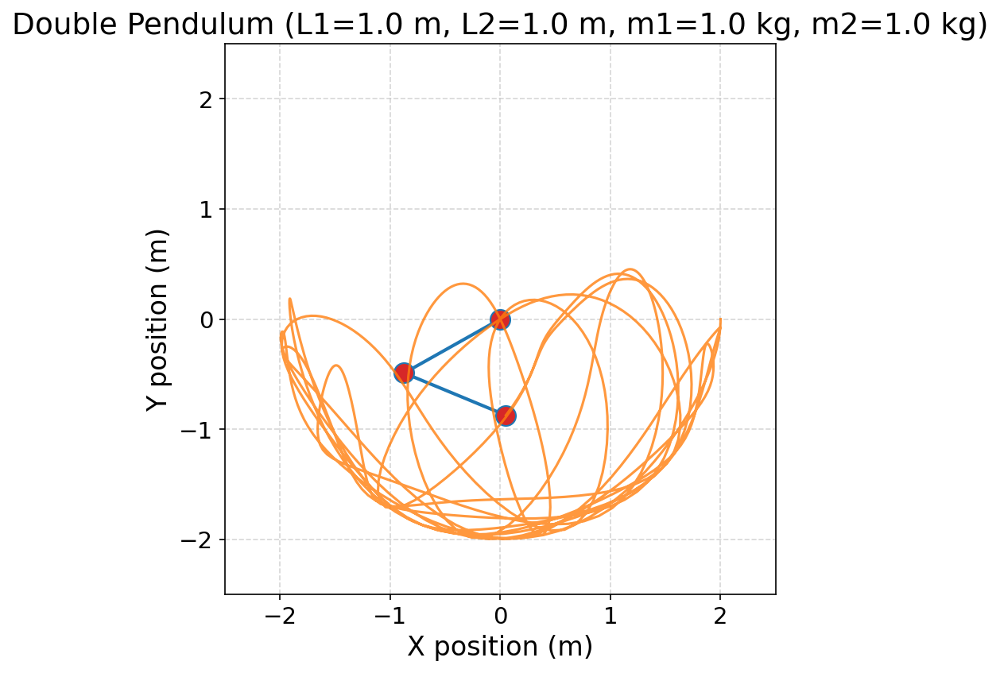

In [2]:
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.animation import FuncAnimation

# --------------------------
# Parameters
# --------------------------
g = 9.81
L1, L2 = 1.0, 1.0
m1, m2 = 1.0, 1.0

theta1, omega1 = np.pi / 2, 0.0
theta2, omega2 = np.pi / 2, 0.0

dt = 0.02
t_max = 20
t = np.arange(0, t_max, dt)

# --------------------------
# Equations of motion
# --------------------------
def derivatives(state):
    th1, w1, th2, w2 = state
    delta = th2 - th1

    denom1 = (m1 + m2) * L1 - m2 * L1 * np.cos(delta)**2
    denom2 = (L2 / L1) * denom1

    a1 = (m2 * L1 * w1**2 * np.sin(delta) * np.cos(delta) +
          m2 * g * np.sin(th2) * np.cos(delta) +
          m2 * L2 * w2**2 * np.sin(delta) -
          (m1 + m2) * g * np.sin(th1)) / denom1

    a2 = (-m2 * L2 * w2**2 * np.sin(delta) * np.cos(delta) +
          (m1 + m2) * g * np.sin(th1) * np.cos(delta) -
          (m1 + m2) * L1 * w1**2 * np.sin(delta) -
          (m1 + m2) * g * np.sin(th2)) / denom2

    return np.array([w1, a1, w2, a2])

# --------------------------
# RK4 solver
# --------------------------
def rk4_step(state, dt):
    k1 = derivatives(state)
    k2 = derivatives(state + 0.5 * dt * k1)
    k3 = derivatives(state + 0.5 * dt * k2)
    k4 = derivatives(state + dt * k3)
    return state + (dt / 6) * (k1 + 2*k2 + 2*k3 + k4)

# --------------------------
# Simulation
# --------------------------
state = np.array([theta1, omega1, theta2, omega2])
theta1_list, theta2_list = [], []

for _ in t:
    theta1_list.append(state[0])
    theta2_list.append(state[2])
    state = rk4_step(state, dt)

# Cartesian coords
x1 = L1 * np.sin(theta1_list)
y1 = -L1 * np.cos(theta1_list)
x2 = x1 + L2 * np.sin(theta2_list)
y2 = y1 - L2 * np.cos(theta2_list)

# --------------------------
# Matplotlib style for publication
# --------------------------
plt.rcParams.update({
    "font.size": 14,
    "axes.labelsize": 16,
    "axes.titlesize": 18,
    "legend.fontsize": 14,
    "xtick.labelsize": 14,
    "ytick.labelsize": 14,
    "lines.linewidth": 2,
    "lines.markersize": 10,
    "figure.dpi": 150,
    "text.usetex": False  # set to True if LaTeX installed
})

# --------------------------
# Animation setup
# --------------------------
fig, ax = plt.subplots(figsize=(6, 6))
ax.set_xlim(-(L1 + L2) - 0.5, (L1 + L2) + 0.5)
ax.set_ylim(-(L1 + L2) - 0.5, (L1 + L2) + 0.5)
ax.set_aspect('equal')

ax.set_xlabel("X position (m)")
ax.set_ylabel("Y position (m)")
ax.set_title(f"Double Pendulum (L1={L1} m, L2={L2} m, m1={m1} kg, m2={m2} kg)")

ax.grid(True, linestyle="--", alpha=0.5)

# Pendulum rods and masses
rod_color = "#1f77b4"
mass_color = "#d62728"
trace_color = "#ff7f0e"

line, = ax.plot([], [], 'o-', color=rod_color, lw=2, markersize=12, markerfacecolor=mass_color)
trace, = ax.plot([], [], '-', lw=1.5, color=trace_color, alpha=0.8)
trace_x, trace_y = [], []

def init():
    line.set_data([], [])
    trace.set_data([], [])
    return line, trace

def update(frame):
    this_x = [0, x1[frame], x2[frame]]
    this_y = [0, y1[frame], y2[frame]]

    line.set_data(this_x, this_y)
    trace_x.append(x2[frame])
    trace_y.append(y2[frame])
    trace.set_data(trace_x, trace_y)
    return line, trace

ani = FuncAnimation(fig, update, frames=len(t), init_func=init,
                    blit=True, interval=dt*1000)

# --------------------------
# Save animation
# --------------------------
save_as_mp4 = True  # change to False for GIF

if save_as_mp4:
    ani.save("double_pendulum.mp4", fps=50, dpi=200, writer="ffmpeg")
else:
    ani.save("double_pendulum.gif", fps=50, writer="pillow")

plt.show()


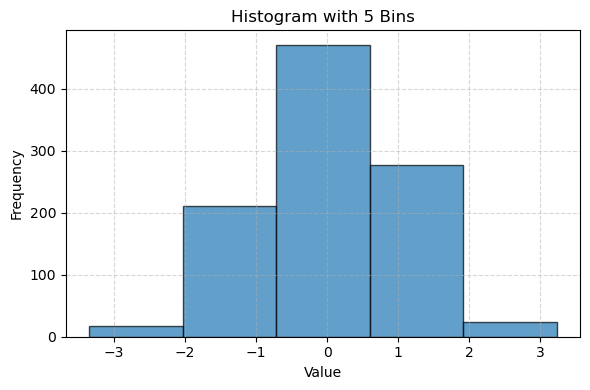

In [1]:
import numpy as np
import matplotlib.pyplot as plt

# Example data (replace with your own)
data = np.random.randn(1000)  # 1000 random samples

# Plot histogram
plt.figure(figsize=(6, 4))
plt.hist(data, bins=5, edgecolor='black', alpha=0.7)

# Labels and title
plt.xlabel("Value")
plt.ylabel("Frequency")
plt.title("Histogram with 5 Bins")
plt.grid(True, linestyle='--', alpha=0.5)

# Save and show
plt.tight_layout()
plt.savefig("histogram_5_bins.png", dpi=300)
plt.show()


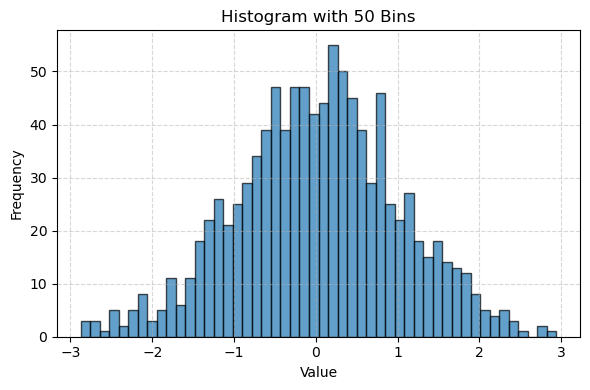

In [2]:
import numpy as np
import matplotlib.pyplot as plt

# Example data (replace with your own)
data = np.random.randn(1000)  # 1000 random samples from normal distribution

# Plot histogram
plt.figure(figsize=(6, 4))
plt.hist(data, bins=50, edgecolor='black', alpha=0.7)

# Labels and title
plt.xlabel("Value")
plt.ylabel("Frequency")
plt.title("Histogram with 50 Bins")
plt.grid(True, linestyle='--', alpha=0.5)

# Save and show
plt.tight_layout()
plt.savefig("histogram_50_bins.png", dpi=300)
plt.show()


<>:27: SyntaxWarning: invalid escape sequence '\m'
<>:27: SyntaxWarning: invalid escape sequence '\s'
<>:27: SyntaxWarning: invalid escape sequence '\m'
<>:27: SyntaxWarning: invalid escape sequence '\s'
/var/folders/z9/4pcc0vs57ns2s8jv05__14_80000gn/T/ipykernel_14357/2504395935.py:27: SyntaxWarning: invalid escape sequence '\m'
  ax.plot(x, pdf, 'r-', lw=2, label=f'Fit: $\mu={mu:.2f}$, $\sigma={sigma:.2f}$')
/var/folders/z9/4pcc0vs57ns2s8jv05__14_80000gn/T/ipykernel_14357/2504395935.py:27: SyntaxWarning: invalid escape sequence '\s'
  ax.plot(x, pdf, 'r-', lw=2, label=f'Fit: $\mu={mu:.2f}$, $\sigma={sigma:.2f}$')


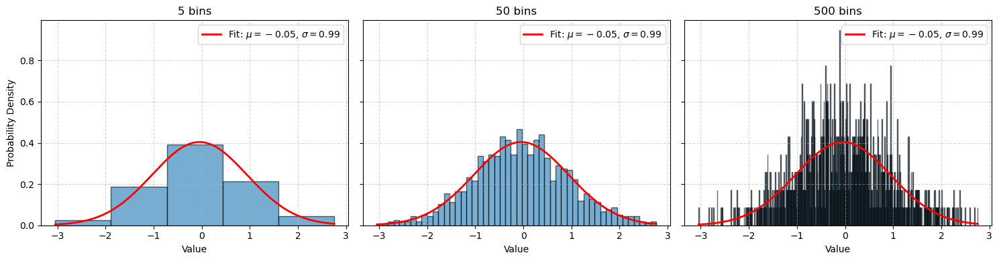

In [3]:
import numpy as np
import matplotlib.pyplot as plt
from scipy.stats import norm

# -----------------------
# Generate example data
# -----------------------
np.random.seed(0)
data = np.random.randn(1000)  # normally distributed

# -----------------------
# Fit a normal distribution
# -----------------------
mu, sigma = norm.fit(data)
x = np.linspace(min(data), max(data), 500)
pdf = norm.pdf(x, mu, sigma)

# -----------------------
# Plot histograms with 3 bin settings
# -----------------------
bin_counts = [5, 50, 500]

fig, axes = plt.subplots(1, 3, figsize=(15, 4), sharey=True)

for ax, bins in zip(axes, bin_counts):
    ax.hist(data, bins=bins, density=True, alpha=0.6, edgecolor='black')
    ax.plot(x, pdf, 'r-', lw=2, label=f'Fit: $\mu={mu:.2f}$, $\sigma={sigma:.2f}$')
    
    ax.set_title(f"{bins} bins")
    ax.set_xlabel("Value")
    ax.grid(True, linestyle='--', alpha=0.5)
    ax.legend()

axes[0].set_ylabel("Probability Density")

plt.tight_layout()
plt.savefig("histogram_fit_bins.png", dpi=300)
plt.show()


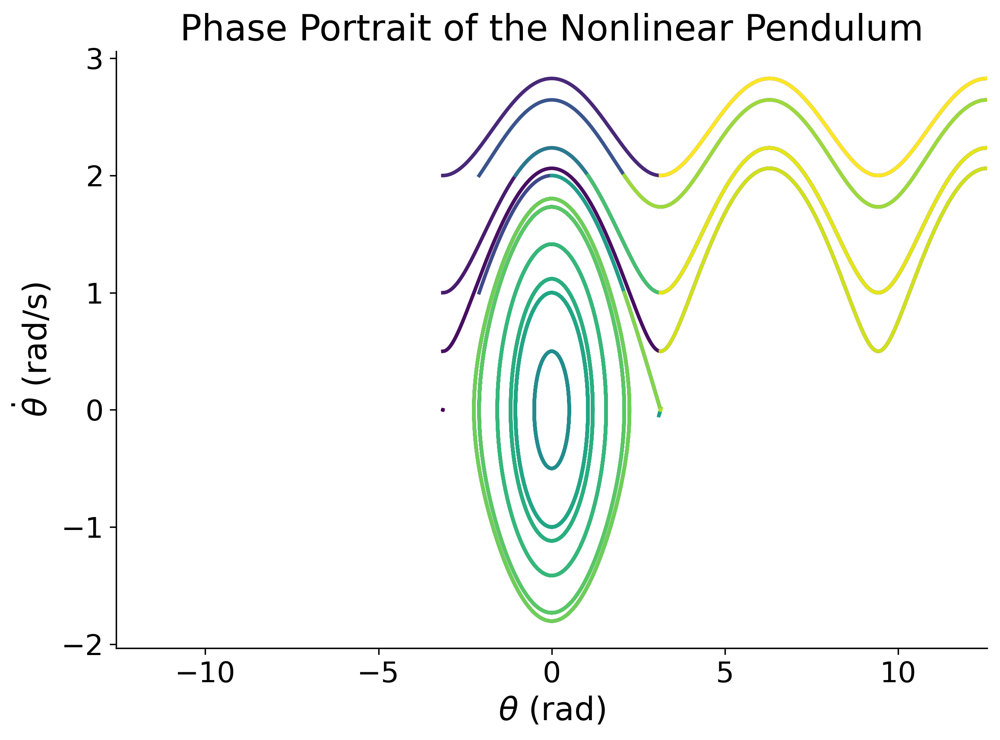

In [6]:
import numpy as np
import matplotlib.pyplot as plt
from scipy.integrate import solve_ivp

# --------------------------------
# Nonlinear pendulum equation
# --------------------------------
def pendulum(t, y):
    theta, omega = y
    dtheta_dt = omega
    domega_dt = -np.sin(theta)
    return [dtheta_dt, domega_dt]

# --------------------------------
# Parameters
# --------------------------------
t_span = (0, 20)
t_eval = np.linspace(*t_span, 2000)
initial_thetas = np.linspace(-np.pi, np.pi, 7)  # angles
initial_omegas = [0.0, 0.5, 1.0, 2.0]           # angular velocities

# --------------------------------
# Publication style
# --------------------------------
plt.rcParams.update({
    "font.size": 16,
    "axes.labelsize": 18,
    "axes.titlesize": 20,
    "legend.fontsize": 14,
    "xtick.labelsize": 16,
    "ytick.labelsize": 16,
    "lines.linewidth": 2,
    "figure.dpi": 300,
    "text.usetex": False
})

# --------------------------------
# Create figure
# --------------------------------
fig, ax = plt.subplots(figsize=(8, 6))

colors = plt.cm.viridis(np.linspace(0, 1, len(initial_thetas) * len(initial_omegas)))

for idx, th0 in enumerate(initial_thetas):
    for jdx, om0 in enumerate(initial_omegas):
        sol = solve_ivp(pendulum, t_span, [th0, om0], t_eval=t_eval, rtol=1e-9, atol=1e-9)
        ax.plot(sol.y[0], sol.y[1], color=colors[idx * len(initial_omegas) + jdx])

# Labels and limits
ax.set_xlabel(r"$\theta$ (rad)")
ax.set_ylabel(r"$\dot{\theta}$ (rad/s)")
ax.set_title("Phase Portrait of the Nonlinear Pendulum")

# Extended x-axis for multiple rotations
ax.set_xlim(-4*np.pi, 4*np.pi)

# Remove grid for clean look
ax.set_facecolor("white")

# Remove top/right spines for minimalist style
ax.spines["top"].set_visible(False)
ax.spines["right"].set_visible(False)

# Save figure
plt.tight_layout()
plt.savefig("nonlinear_pendulum_phase_portrait_wide.png", dpi=300, bbox_inches="tight")
plt.show()


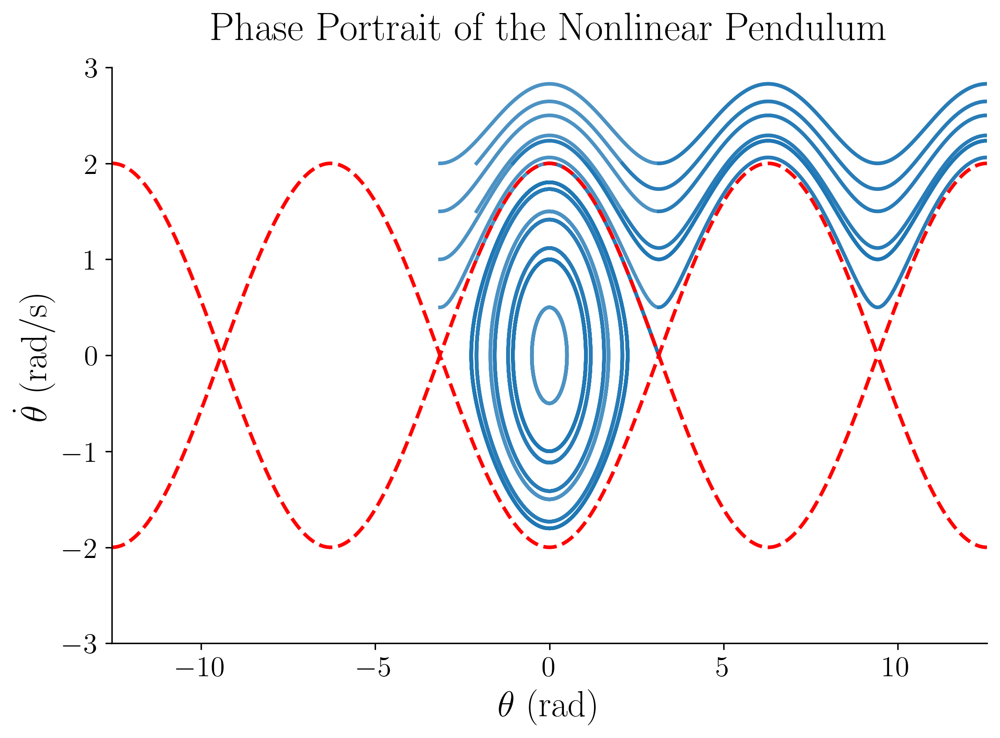

In [7]:
import numpy as np
import matplotlib.pyplot as plt
from scipy.integrate import solve_ivp

# -------------------------------
# Pendulum dynamics (nonlinear)
# -------------------------------
def pendulum(t, y):
    theta, omega = y
    return [omega, -np.sin(theta)]

# -------------------------------
# Integration settings
# -------------------------------
t_span = (0, 20)
t_eval = np.linspace(*t_span, 3000)  # high resolution

# Initial conditions
initial_thetas = np.linspace(-np.pi, np.pi, 7)  # angles
initial_omegas = [0.0, 0.5, 1.0, 1.5, 2.0]      # angular velocities

# -------------------------------
# Matplotlib publication style
# -------------------------------
plt.rcParams.update({
    "font.size": 18,
    "axes.labelsize": 20,
    "axes.titlesize": 22,
    "xtick.labelsize": 16,
    "ytick.labelsize": 16,
    "lines.linewidth": 2,
    "figure.dpi": 300,
    "text.usetex": True,
    "font.family": "serif"
})

fig, ax = plt.subplots(figsize=(8, 6))

# Single color for elegance
traj_color = "#1f77b4"

# Plot trajectories
for th0 in initial_thetas:
    for om0 in initial_omegas:
        sol = solve_ivp(pendulum, t_span, [th0, om0], t_eval=t_eval, rtol=1e-10, atol=1e-10)
        ax.plot(sol.y[0], sol.y[1], color=traj_color, alpha=0.8)

# -------------------------------
# Separatrix curve (energy = 2)
# -------------------------------
theta_vals = np.linspace(-4*np.pi, 4*np.pi, 500)
E_sep = 2  # separatrix energy
omega_sep = np.sqrt(2 * (E_sep - (1 - np.cos(theta_vals))))
ax.plot(theta_vals, omega_sep, 'r--', lw=2)
ax.plot(theta_vals, -omega_sep, 'r--', lw=2)

# -------------------------------
# Labels and style
# -------------------------------
ax.set_xlabel(r"$\theta$ (rad)")
ax.set_ylabel(r"$\dot{\theta}$ (rad/s)")
ax.set_title(r"Phase Portrait of the Nonlinear Pendulum", pad=15)

# Extend x-axis to multiple rotations
ax.set_xlim(-4*np.pi, 4*np.pi)
ax.set_ylim(-3, 3)

# Remove grid, keep white background
ax.set_facecolor("white")

# Minimalist frame
ax.spines["top"].set_visible(False)
ax.spines["right"].set_visible(False)

plt.tight_layout()
plt.savefig("nonlinear_pendulum_phase_portrait_final.png", dpi=300, bbox_inches="tight")
plt.show()


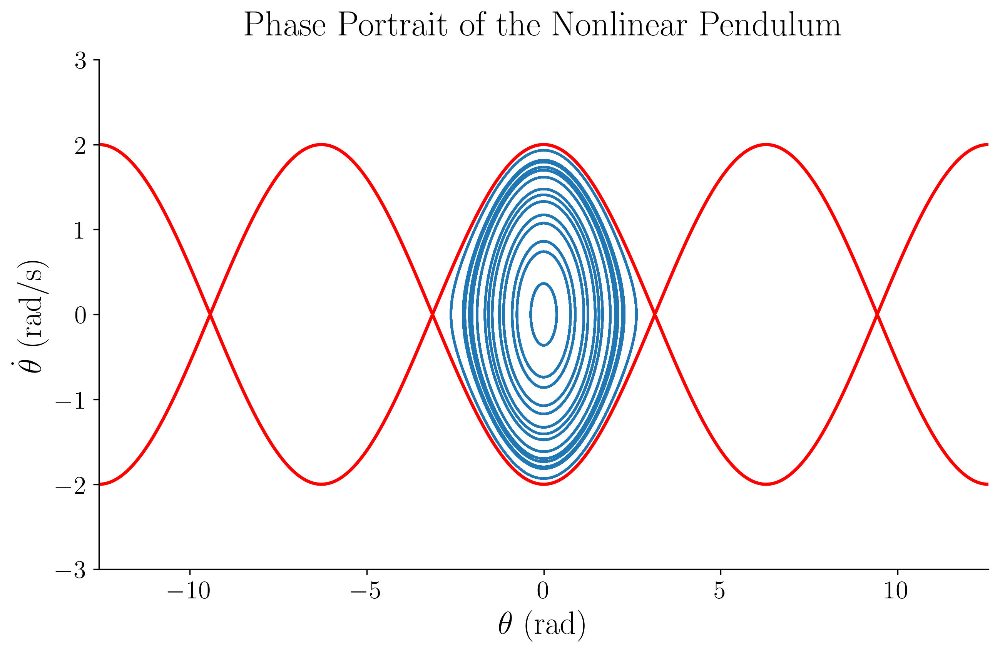

In [8]:
import numpy as np
import matplotlib.pyplot as plt
from scipy.integrate import solve_ivp

# Nonlinear pendulum equations
def pendulum(t, y):
    theta, omega = y
    return [omega, -np.sin(theta)]

# Parameters
t_span = (0, 40)  # integrate long enough to close loops
t_eval = np.linspace(*t_span, 4000)
n_theta = 12  # number of initial theta values
n_omega = 12  # number of initial omega values

# Energy threshold (just below separatrix: E=2)
E_sep = 2
E_max = 1.95

# Function to compute energy
def energy(theta, omega):
    return (omega**2) / 2 + (1 - np.cos(theta))

# Matplotlib style
plt.rcParams.update({
    "font.size": 18,
    "axes.labelsize": 20,
    "axes.titlesize": 22,
    "xtick.labelsize": 16,
    "ytick.labelsize": 16,
    "lines.linewidth": 1.5,
    "figure.dpi": 300,
    "text.usetex": True,
    "font.family": "serif"
})

fig, ax = plt.subplots(figsize=(9, 6))

# Plot closed orbits (oscillatory motion)
for th0 in np.linspace(-np.pi, np.pi, n_theta):
    for om0 in np.linspace(-2.5, 2.5, n_omega):
        if energy(th0, om0) < E_max:
            sol = solve_ivp(pendulum, t_span, [th0, om0], t_eval=t_eval, rtol=1e-10, atol=1e-10)
            ax.plot(sol.y[0], sol.y[1], color="#1f77b4", alpha=0.7)

# Plot separatrix
theta_vals = np.linspace(-4*np.pi, 4*np.pi, 800)
omega_sep = np.sqrt(2 * (E_sep - (1 - np.cos(theta_vals))))
ax.plot(theta_vals, omega_sep, 'r', lw=2)
ax.plot(theta_vals, -omega_sep, 'r', lw=2)

# Labels & style
ax.set_xlabel(r"$\theta$ (rad)")
ax.set_ylabel(r"$\dot{\theta}$ (rad/s)")
ax.set_title(r"Phase Portrait of the Nonlinear Pendulum", pad=15)
ax.set_xlim(-4*np.pi, 4*np.pi)
ax.set_ylim(-3, 3)
ax.set_facecolor("white")
ax.spines["top"].set_visible(False)
ax.spines["right"].set_visible(False)

plt.tight_layout()
plt.savefig("integrable_islands_pendulum.png", dpi=300, bbox_inches="tight")
plt.show()


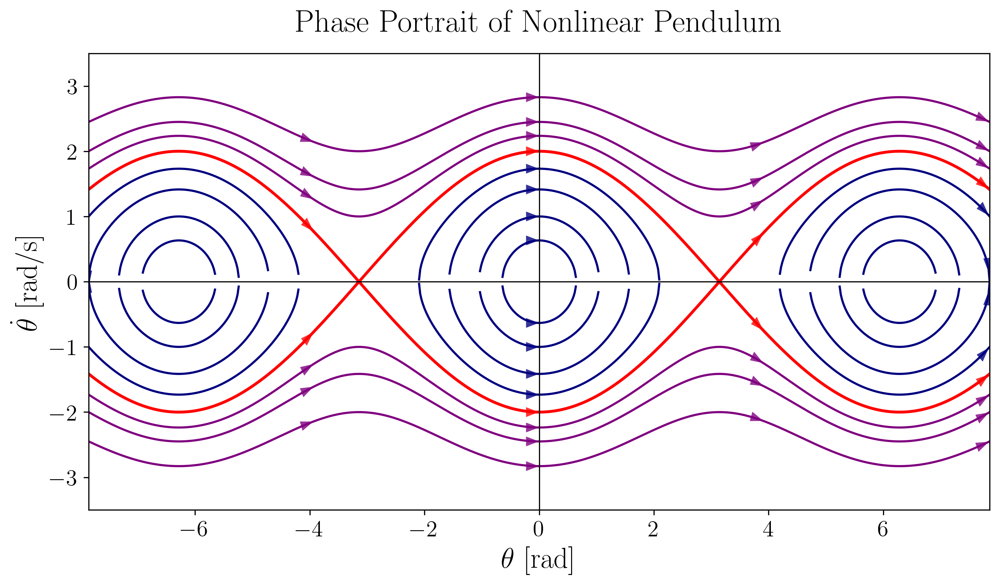

In [9]:
import numpy as np
import matplotlib.pyplot as plt

# Parameters
E_sep = 2.0
theta_vals = np.linspace(-2.5*np.pi, 2.5*np.pi, 800)

# Energy function: E = omega^2/2 + (1 - cos(theta))
def omega_from_energy(E, theta):
    val = 2*(E - (1 - np.cos(theta)))
    val[val < 0] = np.nan  # avoid imaginary values
    return np.sqrt(val)

# Plot setup
plt.rcParams.update({
    "font.size": 18,
    "axes.labelsize": 20,
    "figure.dpi": 300,
    "text.usetex": True,
    "font.family": "serif"
})

fig, ax = plt.subplots(figsize=(10, 6))

# Closed orbits (blue)
E_closed = [0.2, 0.5, 1.0, 1.5]  # below separatrix
for E in E_closed:
    om = omega_from_energy(E, theta_vals)
    ax.plot(theta_vals, om, color='navy')
    ax.plot(theta_vals, -om, color='navy')

# Separatrix (red)
om_sep = omega_from_energy(E_sep, theta_vals)
ax.plot(theta_vals, om_sep, color='red', lw=2)
ax.plot(theta_vals, -om_sep, color='red', lw=2)

# Open orbits (purple)
E_open = [2.5, 3.0, 4.0]
for E in E_open:
    om = omega_from_energy(E, theta_vals)
    ax.plot(theta_vals, om, color='purple')
    ax.plot(theta_vals, -om, color='purple')

# Arrows for direction (optional aesthetic)
def add_arrows(x, y, n_arrows=5, color='k'):
    idx = np.linspace(0, len(x)-2, n_arrows, dtype=int)
    for i in idx:
        dx = x[i+1] - x[i]
        dy = y[i+1] - y[i]
        ax.arrow(x[i], y[i], dx*0.3, dy*0.3,
                 shape='full', lw=0, length_includes_head=True,
                 head_width=0.15, color=color, alpha=0.8)

for E in E_closed:
    om = omega_from_energy(E, theta_vals)
    add_arrows(theta_vals, om, color='navy')
    add_arrows(theta_vals, -om, color='navy')

for E in E_open:
    om = omega_from_energy(E, theta_vals)
    add_arrows(theta_vals, om, color='purple')
    add_arrows(theta_vals, -om, color='purple')

add_arrows(theta_vals, om_sep, color='red')
add_arrows(theta_vals, -om_sep, color='red')

# Labels & style
ax.set_xlabel(r"$\theta$ [rad]")
ax.set_ylabel(r"$\dot{\theta}$ [rad/s]")
ax.set_xlim(-2.5*np.pi, 2.5*np.pi)
ax.set_ylim(-3.5, 3.5)
ax.axhline(0, color='black', lw=0.8)
ax.axvline(0, color='black', lw=0.8)
ax.set_title("Phase Portrait of Nonlinear Pendulum", pad=15)

plt.tight_layout()
plt.savefig("pendulum_phase_portrait.png", dpi=300, bbox_inches="tight")
plt.show()


/var/folders/z9/4pcc0vs57ns2s8jv05__14_80000gn/T/ipykernel_14357/3712563649.py:73: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


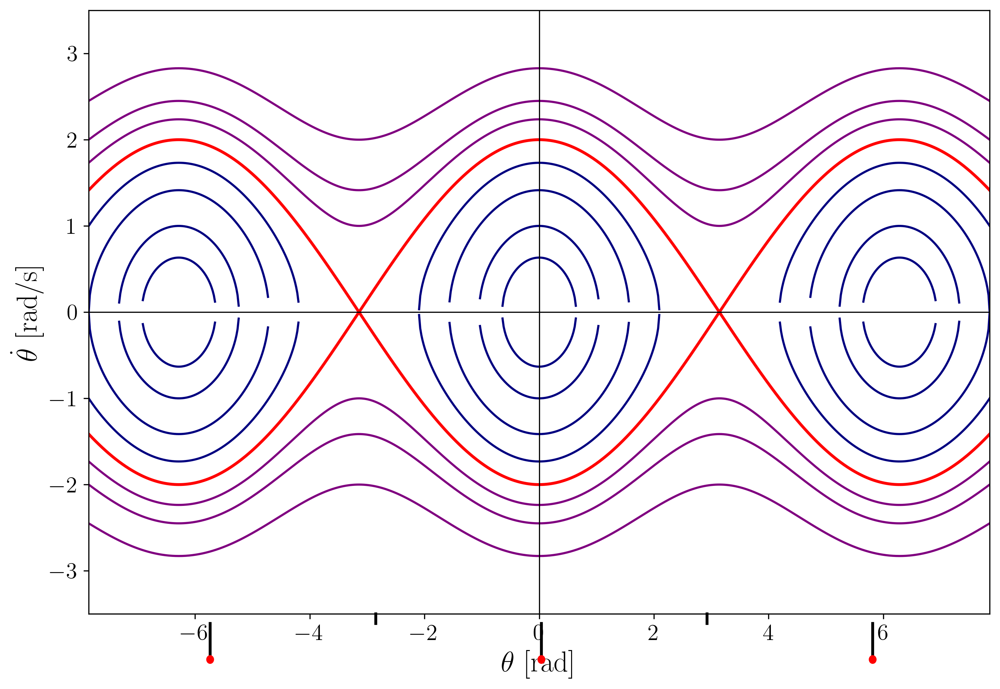

In [10]:
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.patches import Circle

# Parameters
E_sep = 2.0
theta_vals = np.linspace(-2.5*np.pi, 2.5*np.pi, 800)

# Energy function: E = omega^2/2 + (1 - cos(theta))
def omega_from_energy(E, theta):
    val = 2*(E - (1 - np.cos(theta)))
    val[val < 0] = np.nan
    return np.sqrt(val)

# Function to draw pendulum at given angle
def draw_pendulum(ax, angle, L=1.0):
    pivot = (0, 0)
    bob_x = L * np.sin(angle)
    bob_y = -L * np.cos(angle)
    ax.plot([pivot[0], bob_x], [pivot[1], bob_y], color='black', lw=2)
    bob = Circle((bob_x, bob_y), 0.1, color='red', zorder=5)
    ax.add_patch(bob)
    ax.set_xlim(-1.3, 1.3)
    ax.set_ylim(-1.3, 0.3)
    ax.axis('off')

# Plot setup
plt.rcParams.update({
    "font.size": 18,
    "axes.labelsize": 20,
    "figure.dpi": 300,
    "text.usetex": True,
    "font.family": "serif"
})

fig, ax = plt.subplots(figsize=(10, 7))

# Closed orbits (blue)
E_closed = [0.2, 0.5, 1.0, 1.5]
for E in E_closed:
    om = omega_from_energy(E, theta_vals)
    ax.plot(theta_vals, om, color='navy')
    ax.plot(theta_vals, -om, color='navy')

# Separatrix (red)
om_sep = omega_from_energy(E_sep, theta_vals)
ax.plot(theta_vals, om_sep, color='red', lw=2)
ax.plot(theta_vals, -om_sep, color='red', lw=2)

# Open orbits (purple)
E_open = [2.5, 3.0, 4.0]
for E in E_open:
    om = omega_from_energy(E, theta_vals)
    ax.plot(theta_vals, om, color='purple')
    ax.plot(theta_vals, -om, color='purple')

# Labels & style
ax.set_xlabel(r"$\theta$ [rad]")
ax.set_ylabel(r"$\dot{\theta}$ [rad/s]")
ax.set_xlim(-2.5*np.pi, 2.5*np.pi)
ax.set_ylim(-3.5, 3.5)
ax.axhline(0, color='black', lw=0.8)
ax.axvline(0, color='black', lw=0.8)

# Pendulum positions at the bottom
pendulum_angles = [-2*np.pi, -np.pi, 0, np.pi, 2*np.pi]
x_positions = np.linspace(-2*np.pi, 2*np.pi, len(pendulum_angles))

for xpos, angle in zip(x_positions, pendulum_angles):
    inset_ax = fig.add_axes([0.1 + (xpos + 2.5*np.pi) / (5*np.pi) * 0.8, 0.05, 0.08, 0.08])
    draw_pendulum(inset_ax, angle)

plt.tight_layout()
plt.savefig("pendulum_phase_with_positions.png", dpi=300, bbox_inches="tight")
plt.show()


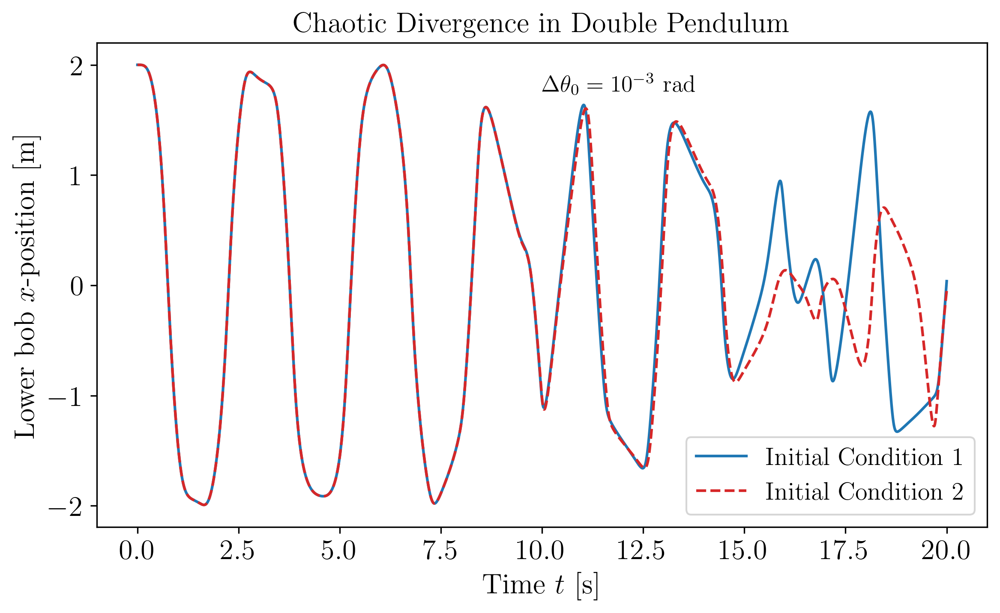

In [11]:
import numpy as np
import matplotlib.pyplot as plt
from scipy.integrate import solve_ivp

# ---------------------------
# Double Pendulum Equations
# ---------------------------
def double_pendulum(t, y, m1, m2, L1, L2, g):
    θ1, ω1, θ2, ω2 = y
    Δ = θ2 - θ1

    den1 = (m1 + m2) * L1 - m2 * L1 * np.cos(Δ)**2
    den2 = (L2 / L1) * den1

    dθ1 = ω1
    dω1 = (m2 * L1 * ω1**2 * np.sin(Δ) * np.cos(Δ) +
           m2 * g * np.sin(θ2) * np.cos(Δ) +
           m2 * L2 * ω2**2 * np.sin(Δ) -
           (m1 + m2) * g * np.sin(θ1)) / den1

    dθ2 = ω2
    dω2 = (-m2 * L2 * ω2**2 * np.sin(Δ) * np.cos(Δ) +
           (m1 + m2) * g * np.sin(θ1) * np.cos(Δ) -
           (m1 + m2) * L1 * ω1**2 * np.sin(Δ) -
           (m1 + m2) * g * np.sin(θ2)) / den2

    return [dθ1, dω1, dθ2, dω2]

# ---------------------------
# Parameters
# ---------------------------
m1, m2 = 1.0, 1.0   # masses
L1, L2 = 1.0, 1.0   # lengths
g = 9.81            # gravity
t_max = 20          # simulation time
fps = 200
t_eval = np.linspace(0, t_max, t_max * fps)

# Slightly different initial conditions
y0_1 = [np.pi/2, 0, np.pi/2, 0]  # θ1, ω1, θ2, ω2
y0_2 = [np.pi/2 + 1e-3, 0, np.pi/2, 0]  # perturbed θ1

# ---------------------------
# Numerical Integration
# ---------------------------
sol1 = solve_ivp(double_pendulum, [0, t_max], y0_1, t_eval=t_eval, args=(m1, m2, L1, L2, g), rtol=1e-10, atol=1e-10)
sol2 = solve_ivp(double_pendulum, [0, t_max], y0_2, t_eval=t_eval, args=(m1, m2, L1, L2, g), rtol=1e-10, atol=1e-10)

# ---------------------------
# Cartesian Positions
# ---------------------------
def get_xy(sol):
    θ1, θ2 = sol.y[0], sol.y[2]
    x1 = L1 * np.sin(θ1)
    y1 = -L1 * np.cos(θ1)
    x2 = x1 + L2 * np.sin(θ2)
    y2 = y1 - L2 * np.cos(θ2)
    return x1, y1, x2, y2

x1_1, y1_1, x2_1, y2_1 = get_xy(sol1)
x1_2, y1_2, x2_2, y2_2 = get_xy(sol2)

# ---------------------------
# Publication-Ready Plot
# ---------------------------
plt.rcParams.update({
    "text.usetex": True,
    "font.size": 14,
    "axes.labelsize": 16,
    "axes.titlesize": 16,
    "legend.fontsize": 14,
    "lines.linewidth": 1.5
})

fig, ax = plt.subplots(figsize=(8, 5))

ax.plot(t_eval, x2_1, label=r"Initial Condition 1", color="C0")
ax.plot(t_eval, x2_2, label=r"Initial Condition 2", color="C3", linestyle="--")

ax.set_xlabel(r"Time $t$ [s]")
ax.set_ylabel(r"Lower bob $x$-position [m]")
ax.set_title(r"Chaotic Divergence in Double Pendulum")
ax.legend()
ax.grid(False)

# Annotation
ax.text(0.5, 0.9, r"$\Delta \theta_0 = 10^{-3} \ \mathrm{rad}$", transform=ax.transAxes, fontsize=13)

plt.tight_layout()
plt.savefig("double_pendulum_chaos.png", dpi=300, bbox_inches="tight")
plt.show()


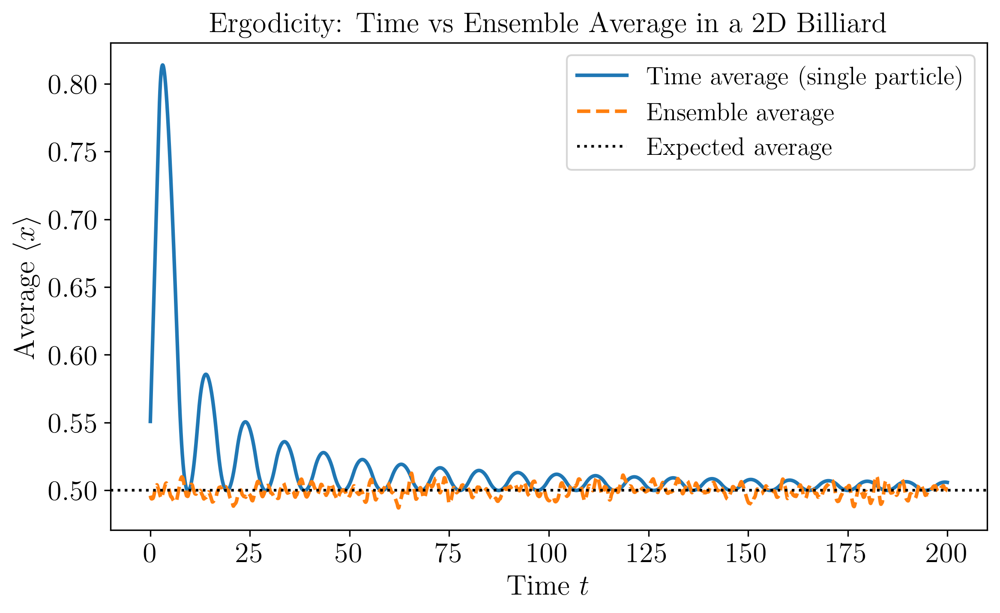

In [14]:
import numpy as np
import matplotlib.pyplot as plt

# Simulation parameters
L = 1.0          # Box length (square box)
N_ensemble = 5000 # Number of particles for ensemble average
T_total = 20000   # Total number of time steps
dt = 0.01        # Time step

# Function to simulate one particle's trajectory in 2D box
def simulate_particle(x0, y0, vx0, vy0, steps, dt):
    x, y = x0, y0
    vx, vy = vx0, vy0
    traj_x = []
    for _ in range(steps):
        x += vx * dt
        y += vy * dt
        # Reflect from walls
        if x < 0 or x > L:
            vx = -vx
            x = max(0, min(L, x))
        if y < 0 or y > L:
            vy = -vy
            y = max(0, min(L, y))
        traj_x.append(x)
    return np.array(traj_x)

# --- Time average for a single particle ---
np.random.seed(0)
x0, y0 = np.random.rand(2) * L
vx0, vy0 = (np.random.rand(2) - 0.5) * 2  # random velocity in [-1, 1]
traj_x_single = simulate_particle(x0, y0, vx0, vy0, T_total, dt)
time_avg_x = np.cumsum(traj_x_single) / np.arange(1, len(traj_x_single)+1)

# --- Ensemble average at each time ---
ensemble_x = np.zeros((N_ensemble, T_total))
for i in range(N_ensemble):
    x0, y0 = np.random.rand(2) * L
    vx0, vy0 = (np.random.rand(2) - 0.5) * 2
    ensemble_x[i] = simulate_particle(x0, y0, vx0, vy0, T_total, dt)
ensemble_avg_x = ensemble_x.mean(axis=0)

# --- Plot ---
plt.figure(figsize=(8,5))
plt.plot(np.arange(T_total)*dt, time_avg_x, label='Time average (single particle)', lw=2)
plt.plot(np.arange(T_total)*dt, ensemble_avg_x, label='Ensemble average', lw=2, ls='--')
plt.axhline(0.5, color='k', linestyle=':', label='Expected average')
plt.xlabel('Time $t$')
plt.ylabel('Average $\\langle x \\rangle$')
plt.title('Ergodicity: Time vs Ensemble Average in a 2D Billiard')
plt.legend()
plt.tight_layout()
plt.show()


Number of intervals = 20


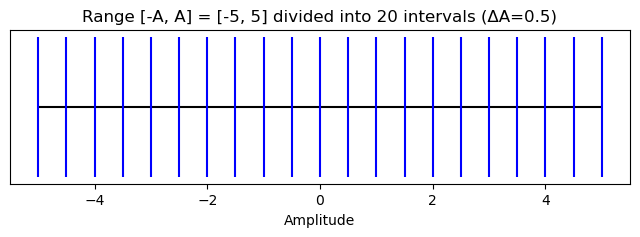

In [2]:
import numpy as np
import matplotlib.pyplot as plt

# Parameters
A = 5          # amplitude (so total range = 2A = 10)
delta_A = 0.5  # resolution

# Number of intervals
num_intervals = int(2 * A / delta_A)
print(f"Number of intervals = {num_intervals}")

# Create interval edges
x = np.linspace(-A, A, num_intervals + 1)

# Plot
plt.figure(figsize=(8, 2))
plt.hlines(1, -A, A, colors='black')  # baseline
for xi in x:
    plt.vlines(xi, 0.95, 1.05, colors='blue')  # interval markers

plt.title(f"Range [-A, A] = [-{A}, {A}] divided into {num_intervals} intervals (ΔA={delta_A})")
plt.xlabel("Amplitude")
plt.yticks([])
plt.show()


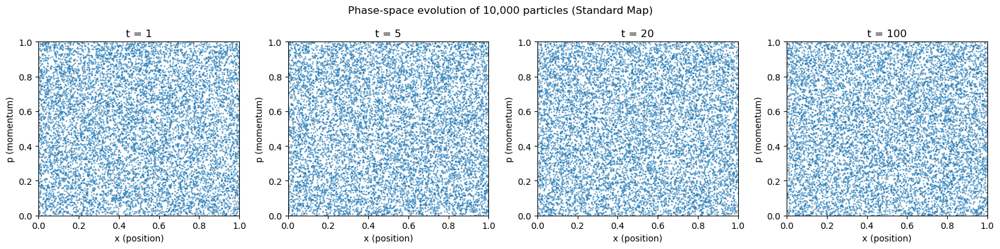

In [8]:
import numpy as np
import matplotlib.pyplot as plt

# Number of particles
N = 10000

# Time steps
T = 200

# Random initial conditions in phase space (x, p)
x0 = np.random.rand(N)
p0 = np.random.rand(N)

# Simple chaotic map: standard map (toy model for chaos)
def standard_map(x, p, K=5.0):
    """Standard map: a simple chaotic map used in dynamical systems"""
    p_new = (p + K * np.sin(2 * np.pi * x)) % 1.0
    x_new = (x + p_new) % 1.0
    return x_new, p_new

# Evolve particles
x, p = x0, p0
trajectory_snapshots = []
for t in [1, 5, 20, 100]:  # record some times
    for _ in range(t):
        x, p = standard_map(x, p)
    trajectory_snapshots.append((x.copy(), p.copy(), t))

# Plot snapshots
fig, axes = plt.subplots(1, 4, figsize=(16, 4))
for ax, (x, p, t) in zip(axes, trajectory_snapshots):
    ax.scatter(x, p, s=1, alpha=0.5)
    ax.set_title(f"t = {t}")
    ax.set_xlabel("x (position)")
    ax.set_ylabel("p (momentum)")
    ax.set_xlim(0, 1)
    ax.set_ylim(0, 1)

plt.suptitle("Phase-space evolution of 10,000 particles (Standard Map)")
plt.tight_layout()
plt.show()


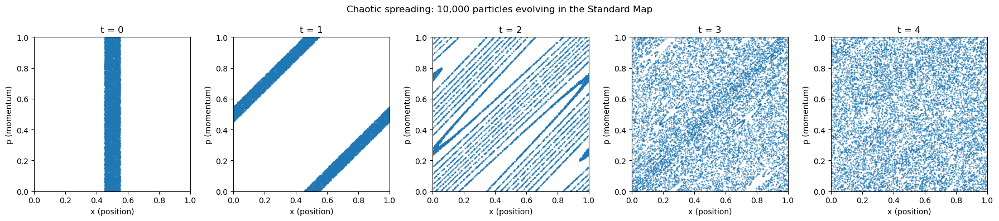

In [1]:
import numpy as np
import matplotlib.pyplot as plt

# Number of particles
N = 10000

# Time steps to record
snapshots = [0, 1, 2, 3, 4]

# Initial conditions: narrow interval in x, full spread in p
x = np.random.uniform(0.45, 0.55, N)  # narrow strip in position
p = np.random.rand(N)                 # random momentum

# Standard map (chaotic map)
def standard_map(x, p, K=5.0):
    """One step of the standard map."""
    p_new = (p + K * np.sin(2 * np.pi * x)) % 1.0
    x_new = (x + p_new) % 1.0
    return x_new, p_new

# Evolve and collect snapshots
trajectory_snapshots = [(x.copy(), p.copy(), 0)]
for t in range(1, max(snapshots) + 1):
    x, p = standard_map(x, p)
    if t in snapshots:
        trajectory_snapshots.append((x.copy(), p.copy(), t))

# Plot snapshots
fig, axes = plt.subplots(1, len(trajectory_snapshots), figsize=(18, 4))
for ax, (x, p, t) in zip(axes, trajectory_snapshots):
    ax.scatter(x, p, s=1, alpha=0.5)
    ax.set_title(f"t = {t}")
    ax.set_xlabel("x (position)")
    ax.set_ylabel("p (momentum)")
    ax.set_xlim(0, 1)
    ax.set_ylim(0, 1)

plt.suptitle("Chaotic spreading: 10,000 particles evolving in the Standard Map")
plt.tight_layout()
plt.show()


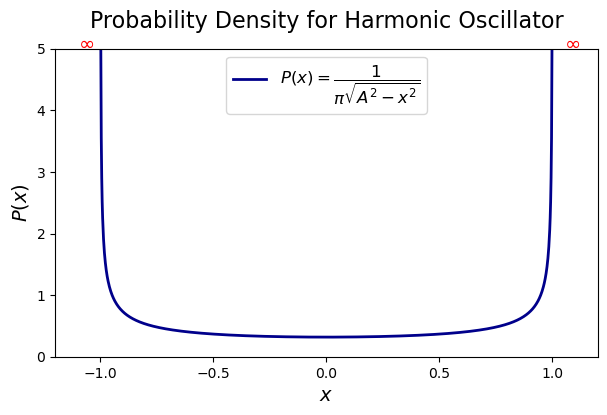

In [3]:
A = 1.0  # amplitude

# Define probability density function P(x)
def P(x, A):
    return 1 / (np.pi * np.sqrt(A**2 - x**2))

# Domain for x (avoid endpoints where it diverges)
x = np.linspace(-A + 1e-5, A - 1e-5, 1000)
y = P(x, A)

# Domain for x (avoid endpoints where it diverges)
x = np.linspace(-A + 1e-5, A - 1e-5, 1000)
y = P(x, A)

# Plot
plt.figure(figsize=(7, 4))
plt.plot(x, y, color="darkblue", linewidth=2, label=r"$P(x) = \dfrac{1}{\pi \sqrt{A^2 - x^2}}$")

# Mark divergences (infinities)
plt.annotate(r"$\infty$", xy=(-A, 5), xytext=(-A-0.1, 5), fontsize=14, color="red")
plt.annotate(r"$\infty$", xy=(A, 5), xytext=(A+0.05, 5), fontsize=14, color="red")

# Labels with LaTeX
plt.xlabel(r"$x$", fontsize=14)
plt.ylabel(r"$P(x)$", fontsize=14)
plt.title(r"Probability Density for Harmonic Oscillator", fontsize=16, pad=15)

# Axis limits
plt.ylim(0, 5)
plt.xlim(-1.2, 1.2)

# No grid, elegant look
plt.legend(fontsize=12, loc="upper center")
plt.show()


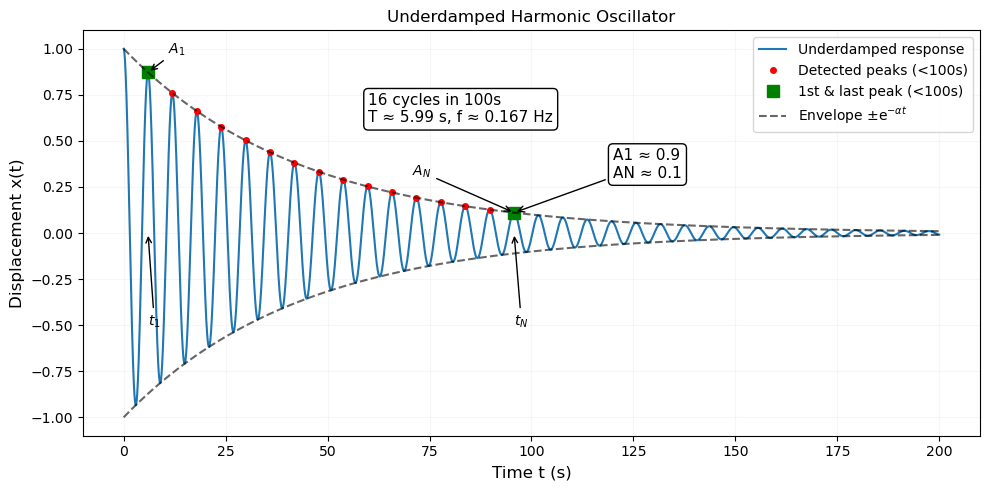

In [8]:
import numpy as np
import matplotlib.pyplot as plt
from scipy.signal import find_peaks

# Parameters from the worked solution
alpha = 0.023        # exponential decay rate (1/s)
omega_d = 1.05       # damped angular frequency (rad/s)

# Time array
t = np.linspace(0, 200, 5000)

# Underdamped response
x = np.exp(-alpha * t) * np.cos(omega_d * t)

# Find peaks
peaks, _ = find_peaks(x)
t_peaks = t[peaks]
x_peaks = x[peaks]

# Count peaks within first 100 s
mask_100 = t_peaks < 100
N = mask_100.sum()

# First and last peak in first 100 s
t1, A1 = t_peaks[0], x_peaks[0]
tN, AN = t_peaks[mask_100][-1], x_peaks[mask_100][-1]

# Period and frequency from counts
T_est = (tN - t1) / (N - 1)
f_est = 1 / T_est

# Plot
plt.figure(figsize=(10,5))
plt.plot(t, x, label="Underdamped response", lw=1.5)
plt.plot(t_peaks[mask_100], x_peaks[mask_100], "ro", ms=4, label="Detected peaks (<100s)")
plt.plot([t1, tN], [A1, AN], "gs", ms=8, label="1st & last peak (<100s)")


# Annotate with LaTeX
plt.annotate(r"$A_1$", xy=(t1, A1), xytext=(t1+5, A1+0.1),
             arrowprops=dict(arrowstyle="->"))
plt.annotate(r"$A_N$", xy=(tN, AN), xytext=(tN-25, AN+0.2),
             arrowprops=dict(arrowstyle="->"))
plt.annotate(r"$t_1$", xy=(t1, 0), xytext=(t1, -0.5),
             arrowprops=dict(arrowstyle="->"))
plt.annotate(r"$t_N$", xy=(tN, 0), xytext=(tN, -0.5),
             arrowprops=dict(arrowstyle="->"))

# Annotate oscillation count
plt.annotate(f"{N} cycles in 100s\nT ≈ {T_est:.2f} s, f ≈ {f_est:.3f} Hz",
             xy=(60,0.6), fontsize=11, bbox=dict(boxstyle="round", fc="w"))

# Annotate amplitude decay
plt.annotate(f"A1 ≈ {A1:.1f}\nAN ≈ {AN:.1f}",
             xy=(tN, AN), xytext=(120,0.3),
             arrowprops=dict(arrowstyle="->"), fontsize=11,
             bbox=dict(boxstyle="round", fc="w"))

# Envelopes
envelope = np.exp(-alpha * t)
plt.plot(t, envelope, "k--", alpha=0.6, label="Envelope ±e$^{-α t}$")
plt.plot(t, -envelope, "k--", alpha=0.6)

# Labels
plt.xlabel("Time t (s)", fontsize=12)
plt.ylabel("Displacement x(t)", fontsize=12)
plt.title("Underdamped Harmonic Oscillator")
plt.legend()
plt.grid(True, alpha=0.1)
plt.tight_layout()
plt.show()


FileNotFoundError: [Errno 2] No such file or directory: '/mnt/data/diffusion_pollen.png'

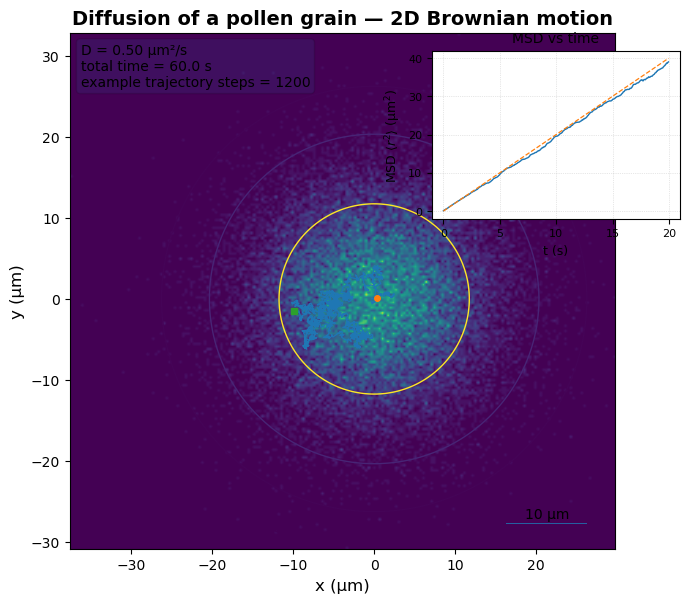

In [9]:
# Fixing contour level order and re-running the plotting (single run).
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.patches import Rectangle
import os

np.random.seed(0)

# Physical / simulation parameters (units: micrometers and seconds)
D = 0.5        # diffusion coefficient in µm^2 / s (example value)
dt = 0.05      # time step in s
steps = 1200   # number of steps for the example trajectory (=> total time = steps*dt)
t = np.arange(steps) * dt
t_final = t[-1]

# Simulate one example Brownian trajectory (2D)
sigma_step = np.sqrt(2 * D * dt)  # per-axis step stddev
steps_noise = np.random.normal(loc=0.0, scale=sigma_step, size=(steps, 2))
traj = steps_noise.cumsum(axis=0)

# Simulate an ensemble of final positions (analytical distribution is Gaussian)
M = 40000  # number of sample final positions for the density map
sigma_final = np.sqrt(2 * D * t_final)
ensemble = np.random.normal(scale=sigma_final, size=(M, 2))

# For MSD: simulate many short trajectories to estimate MSD vs time
N_traj = 600
steps_msd = 400  # shorter for msd computation
t_msd = np.arange(steps_msd) * dt
# simulate increments and cumulative positions for N_traj trajectories
increments = np.random.normal(scale=np.sqrt(2 * D * dt), size=(N_traj, steps_msd, 2))
positions = increments.cumsum(axis=1)  # shape (N_traj, steps_msd, 2)
r2 = (positions ** 2).sum(axis=2)  # squared displacement per traj per time
msd_sim = r2.mean(axis=0)  # ensemble MSD per time
msd_theory = 4 * D * t_msd

# Create figure
fig = plt.figure(figsize=(7.5, 6))
ax = fig.add_axes([0.07, 0.07, 0.86, 0.86])  # single main axes filling the figure

# 2D density of ensemble final positions (use histogram2d)
bins = 200
H, xedges, yedges = np.histogram2d(ensemble[:, 0], ensemble[:, 1], bins=bins, density=True)
# extent for imshow
extent = [xedges[0], xedges[-1], yedges[0], yedges[-1]]
im = ax.imshow(H.T, origin='lower', extent=extent, aspect='equal', interpolation='bilinear')

# Overlay contour lines of the theoretical Gaussian radial distribution
nx = ny = 200
x = np.linspace(extent[0], extent[1], nx)
y = np.linspace(extent[2], extent[3], ny)
X, Y = np.meshgrid(x, y)
prefactor = 1.0 / (4 * np.pi * D * t_final)
R2 = X**2 + Y**2
pdf = prefactor * np.exp(-R2 / (4 * D * t_final))
# choose contour levels in increasing order
levels = np.percentile(pdf.ravel(), [30, 50, 70, 90])
cont = ax.contour(X, Y, pdf, levels=levels, linewidths=1)

# Plot the example trajectory on top
ax.plot(traj[:, 0], traj[:, 1], linewidth=0.9)
ax.plot(traj[0, 0], traj[0, 1], marker='o', markersize=4)  # starting point marker
ax.plot(traj[-1, 0], traj[-1, 1], marker='s', markersize=4)  # end point marker

# Annotations and labels
ax.set_xlabel('x (µm)', fontsize=12)
ax.set_ylabel('y (µm)', fontsize=12)
ax.set_title('Diffusion of a pollen grain — 2D Brownian motion', fontsize=14, weight='semibold')

# Add a scale bar (10 µm) in the lower right
scalebar_um = 10.0
# Determine location relative to axis
x0 = extent[1] - 0.05 * (extent[1] - extent[0]) - scalebar_um
y0 = extent[2] + 0.05 * (extent[3] - extent[2])
ax.add_patch(Rectangle((x0, y0 - 0.15), scalebar_um, 0.08, fill=True, alpha=0.8))
ax.text(x0 + scalebar_um / 2, y0 + 0.25, f'{int(scalebar_um)} µm', ha='center', va='bottom', fontsize=10)

# Legend-like text box
textstr = '\n'.join([
    f'D = {D:.2f} µm²/s',
    f'total time = {t_final:.1f} s',
    f'example trajectory steps = {steps}'
])
ax.text(0.02, 0.98, textstr, transform=ax.transAxes, fontsize=10, va='top', bbox=dict(boxstyle='round', alpha=0.12))

# Inset axes for MSD
left, bottom, width, height = 0.62, 0.62, 0.33, 0.28
axins = fig.add_axes([left, bottom, width, height])
axins.plot(t_msd, msd_sim, linewidth=1.0)
axins.plot(t_msd, msd_theory, linewidth=0.9, linestyle='--')
axins.set_xlabel('t (s)', fontsize=9)
axins.set_ylabel(r'MSD $\langle r^2\rangle$ (µm$^2$)', fontsize=9)
axins.set_title('MSD vs time', fontsize=10)
axins.tick_params(axis='both', which='major', labelsize=8)
axins.grid(True, linestyle=':', linewidth=0.5, alpha=0.6)

# Tight layout adjustments
ax.set_xlim(extent[0], extent[1])
ax.set_ylim(extent[2], extent[3])
fig.canvas.draw()

# Save high-resolution files
out_png = '/mnt/data/diffusion_pollen.png'
out_pdf = '/mnt/data/diffusion_pollen.pdf'
fig.savefig(out_png, dpi=300, bbox_inches='tight')
fig.savefig(out_pdf, dpi=300, bbox_inches='tight')

print(f'Files saved:\n - {out_png}\n - {out_pdf}')

plt.show()


<>:140: SyntaxWarning: invalid escape sequence '\m'
<>:174: SyntaxWarning: invalid escape sequence '\s'
<>:140: SyntaxWarning: invalid escape sequence '\m'
<>:174: SyntaxWarning: invalid escape sequence '\s'
/var/folders/z9/4pcc0vs57ns2s8jv05__14_80000gn/T/ipykernel_18825/3385085464.py:140: SyntaxWarning: invalid escape sequence '\m'
  r"$D=$" + f"{D:g} $\mu$m$^2$/s"
/var/folders/z9/4pcc0vs57ns2s8jv05__14_80000gn/T/ipykernel_18825/3385085464.py:174: SyntaxWarning: invalid escape sequence '\s'
  "displacement compared with theoretical $\sqrt{4Dt}$ scaling for 2D diffusion."


Saved figure to: pollen_diffusion_figure.pdf


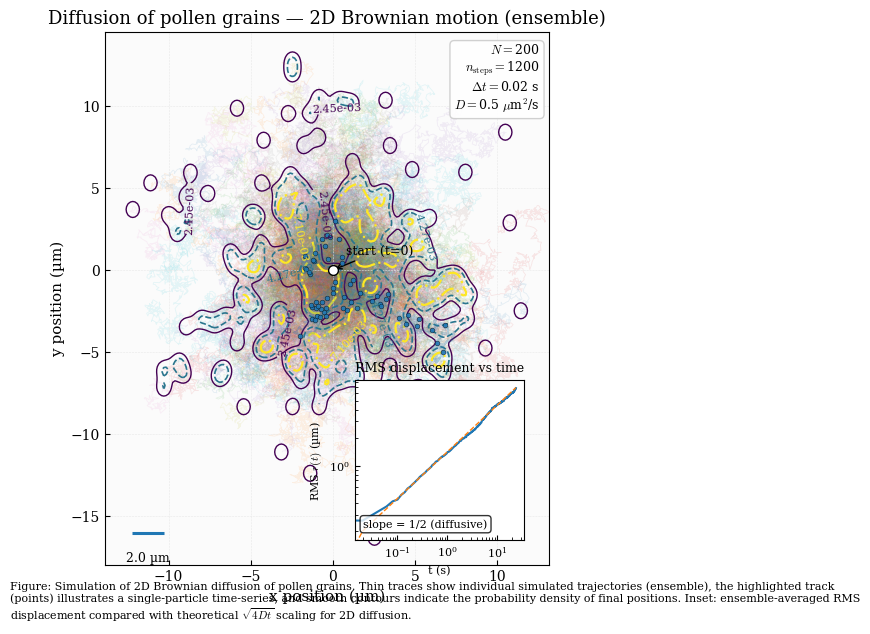

In [10]:
"""
Beautiful publication-ready figure of pollen-grain diffusion (2D Brownian motion).

Requires: numpy, matplotlib, scipy

Saves: 'pollen_diffusion_figure.pdf' (high DPI)
"""

import numpy as np
import matplotlib.pyplot as plt
from scipy.ndimage import gaussian_filter
from matplotlib import ticker

# -------------------------
# Parameters (change if desired)
# -------------------------
n_trajectories = 200      # number of simulated pollen grains (ensemble)
n_steps = 1200            # time steps per trajectory
dt = 0.02                 # time step size (s)
D = 0.5                   # diffusion coefficient (µm^2 / s) — tune for scale realism
seed = 42
outfile = "pollen_diffusion_figure.pdf"

np.random.seed(seed)

# Derived
times = np.arange(n_steps) * dt
sqrt2Ddt = np.sqrt(2 * D * dt)

# -------------------------
# Simulate 2D Brownian motion
# -------------------------
# displacements: normal(0, sqrt(2 D dt))
dx = sqrt2Ddt * np.random.randn(n_trajectories, n_steps)
dy = sqrt2Ddt * np.random.randn(n_trajectories, n_steps)

# positions: cumulative sum
x = np.cumsum(dx, axis=1)
y = np.cumsum(dy, axis=1)

# pick one trajectory to highlight (the first)
highlight_idx = 0

# compute ensemble RMS displacement sqrt(<r^2>(t))
r2 = x**2 + y**2
rms = np.sqrt(np.mean(r2, axis=0))

# -------------------------
# Prepare density (final positions)
# -------------------------
# take final positions of all trajectories
xf = x[:, -1]
yf = y[:, -1]

# 2D histogram
nbin = 200
xy_min = min(xf.min(), yf.min()) - 0.1 * max(abs(xf).max(), abs(yf).max())
xy_max = max(xf.max(), yf.max()) + 0.1 * max(abs(xf).max(), abs(yf).max())
# expand box a little to include trajectories
pad = 0.1 * max(abs(xf).max(), abs(yf).max()) + 1e-6
xmin, xmax = xf.min() - pad, xf.max() + pad
ymin, ymax = yf.min() - pad, yf.max() + pad

H, xedges, yedges = np.histogram2d(xf, yf, bins=nbin, range=[[xmin, xmax], [ymin, ymax]], density=True)
H_smooth = gaussian_filter(H, sigma=3)

Xc = 0.5 * (xedges[:-1] + xedges[1:])
Yc = 0.5 * (yedges[:-1] + yedges[1:])
Xc_grid, Yc_grid = np.meshgrid(Xc, Yc)

# -------------------------
# Plotting: main figure
# -------------------------
plt.rcParams.update({
    "font.family": "serif",
    "font.size": 10,
    "axes.labelsize": 11,
    "axes.titlesize": 13,
    "legend.fontsize": 9,
    "xtick.direction": "in",
    "ytick.direction": "in",
    "mathtext.fontset": "cm",
})

fig = plt.figure(figsize=(8.8, 6.5))   # publication style aspect
ax = fig.add_axes([0.08, 0.10, 0.60, 0.82])  # main axes (left, bottom, width, height)

# light thin gray background grid for a polished look
ax.set_facecolor("#fbfbfb")
ax.grid(True, linewidth=0.4, linestyle="--", color="#e8e8e8")

# 1) Plot many faint trajectories
for i in range(n_trajectories):
    alpha = 0.10 + 0.15 * (i == highlight_idx)  # slightly stronger alpha for highlight
    lw = 0.6 if i != highlight_idx else 1.4
    zorder = 1 if i != highlight_idx else 3
    ax.plot(x[i], y[i], linewidth=lw, alpha=alpha, zorder=zorder)

# 2) Draw faded trajectory points along highlighted track for time sense
t_skip = max(1, n_steps // 60)
ax.scatter(x[highlight_idx, ::t_skip], y[highlight_idx, ::t_skip],
           s=12, edgecolor="k", linewidth=0.3, zorder=4, alpha=0.9)

# 3) Overlay smooth density contours of final positions
levels = np.percentile(H_smooth[H_smooth > 0], [70, 85, 95])
# contour on axes (note transposing H_smooth because histogram2d arranges dim differently)
ctr = ax.contour(Xc_grid, Yc_grid, H_smooth.T, levels=levels, linewidths=[1.0, 1.2, 1.6],
                 linestyles=['-', '--', '-.'], zorder=2)
ax.clabel(ctr, fmt=lambda v: f"{v:.2e}", inline=True, fontsize=8)

# 4) Big center marker for initial position & arrow for time direction
ax.scatter(0, 0, s=50, marker="o", facecolor="white", edgecolor="black", zorder=5)
ax.annotate("start (t=0)", xy=(0, 0), xytext=(0.03*(xmax-xmin), 0.03*(ymax-ymin)),
            arrowprops=dict(arrowstyle="->", lw=1.0), fontsize=9)

# 5) scale bar (choose 1 µm for example; scale based on D & dt you used)
scalebar_length = 2.0  # µm
# place scale bar at lower right-ish corner
sb_x = xmin + 0.06 * (xmax - xmin)
sb_y = ymin + 0.06 * (ymax - ymin)
ax.plot([sb_x, sb_x + scalebar_length], [sb_y, sb_y], lw=2.2, solid_capstyle="butt", zorder=6)
ax.text(sb_x + scalebar_length/2, sb_y - 0.035*(ymax-ymin), f"{scalebar_length:.1f} µm",
        ha="center", va="top", fontsize=9)

# Axis labels and title
ax.set_xlabel("x position (µm)")
ax.set_ylabel("y position (µm)")
ax.set_title("Diffusion of pollen grains — 2D Brownian motion (ensemble)")

# tighten the view
ax.set_xlim(xmin, xmax)
ax.set_ylim(ymin, ymax)
ax.set_aspect("equal", adjustable="box")

# Legend-ish text box
textstr = (
    r"$N=$" + f"{n_trajectories}" + "\n"
    r"$n_{\rm steps}=$" + f"{n_steps}" + "\n"
    r"$\Delta t=$" + f"{dt:g} s\n"
    r"$D=$" + f"{D:g} $\mu$m$^2$/s"
)
bbox_props = dict(boxstyle="round,pad=0.35", fc="white", ec="#cccccc", alpha=0.9)
ax.text(0.98, 0.98, textstr, transform=ax.transAxes,
        ha="right", va="top", bbox=bbox_props, fontsize=9)

# -------------------------
# Inset: RMS displacement vs time (log-log inset)
# -------------------------
from mpl_toolkits.axes_grid1.inset_locator import inset_axes

axins = inset_axes(ax, width="38%", height="30%", loc=4, borderpad=2)  # lower-right inset
axins.plot(times, rms, linewidth=1.5)
# theoretical sqrt(4 D t) for 2D RMS scaling: <r^2> = 4 D t => rms = sqrt(4 D t)
rms_theory = np.sqrt(4 * D * times)
axins.plot(times, rms_theory, linewidth=1.0, linestyle="--")
axins.set_xscale("log")
axins.set_yscale("log")
axins.set_xlabel("t (s)", fontsize=8)
axins.set_ylabel(r"RMS $r(t)$ (µm)", fontsize=8)
axins.tick_params(axis="both", which="major", labelsize=8)
axins.set_title("RMS displacement vs time", fontsize=9)

# show annotation about expected slope
axins.text(0.05, 0.08, "slope = 1/2 (diffusive)", transform=axins.transAxes,
           fontsize=8, bbox=dict(boxstyle="round", fc="white", alpha=0.8))

# -------------------------
# Footer caption text (publication-style)
# -------------------------
caption = (
    "Figure: Simulation of 2D Brownian diffusion of pollen grains. Thin traces show individual simulated "
    "trajectories (ensemble), the highlighted track (points) illustrates a single-particle time-series, "
    "and smooth contours indicate the probability density of final positions. Inset: ensemble-averaged RMS "
    "displacement compared with theoretical $\sqrt{4Dt}$ scaling for 2D diffusion."
)
fig.text(0.02, 0.02, caption, fontsize=8, wrap=True)

# -------------------------
# Finalize and save high-resolution file
# -------------------------
plt.savefig(outfile, dpi=600, bbox_inches="tight")
print(f"Saved figure to: {outfile}")
plt.show()


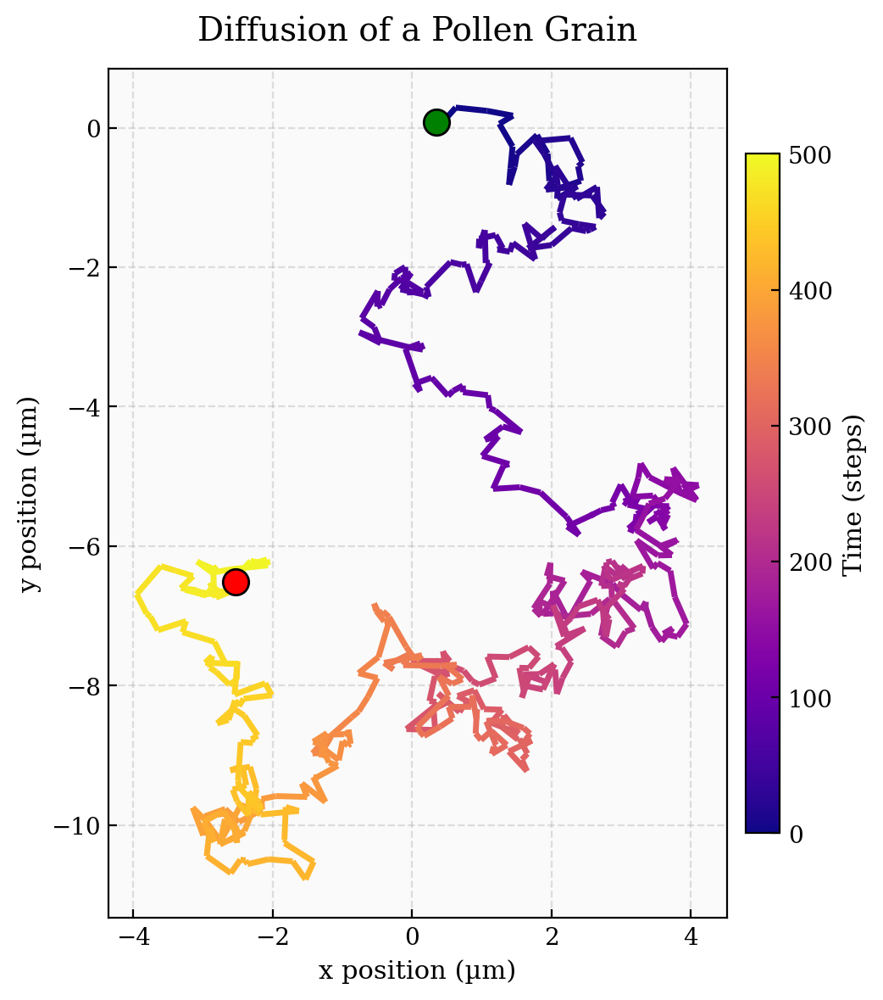

In [11]:
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.collections import LineCollection
import matplotlib as mpl

# Parameters
n_steps = 500
dt = 0.05
D = 0.4
np.random.seed(0)

# Brownian increments
dx = np.sqrt(2*D*dt) * np.random.randn(n_steps)
dy = np.sqrt(2*D*dt) * np.random.randn(n_steps)

# Trajectory
x = np.cumsum(dx)
y = np.cumsum(dy)
points = np.array([x, y]).T.reshape(-1, 1, 2)
segments = np.concatenate([points[:-1], points[1:]], axis=1)

# Color map for time
norm = plt.Normalize(0, n_steps)
lc = LineCollection(segments, cmap='plasma', norm=norm, linewidth=2.5)
lc.set_array(np.arange(n_steps))

# Plot
plt.figure(figsize=(6,6), dpi=200)
ax = plt.gca()
ax.set_facecolor("#fafafa")

# Add line
line = ax.add_collection(lc)

# Starting and ending points
ax.scatter(x[0], y[0], s=120, c='green', edgecolors='black', zorder=3, label="Start")
ax.scatter(x[-1], y[-1], s=120, c='red', edgecolors='black', zorder=3, label="End")

# Clean labels and title
ax.set_title("Diffusion of a Pollen Grain", fontsize=14, pad=12)
ax.set_xlabel("x position (µm)")
ax.set_ylabel("y position (µm)")

# Grid & equal aspect
ax.grid(linestyle="--", alpha=0.4)
ax.set_aspect("equal", adjustable="box")

# Colorbar for time
cbar = plt.colorbar(line, ax=ax, shrink=0.8, pad=0.02)
cbar.set_label("Time (steps)")

plt.tight_layout()
plt.show()


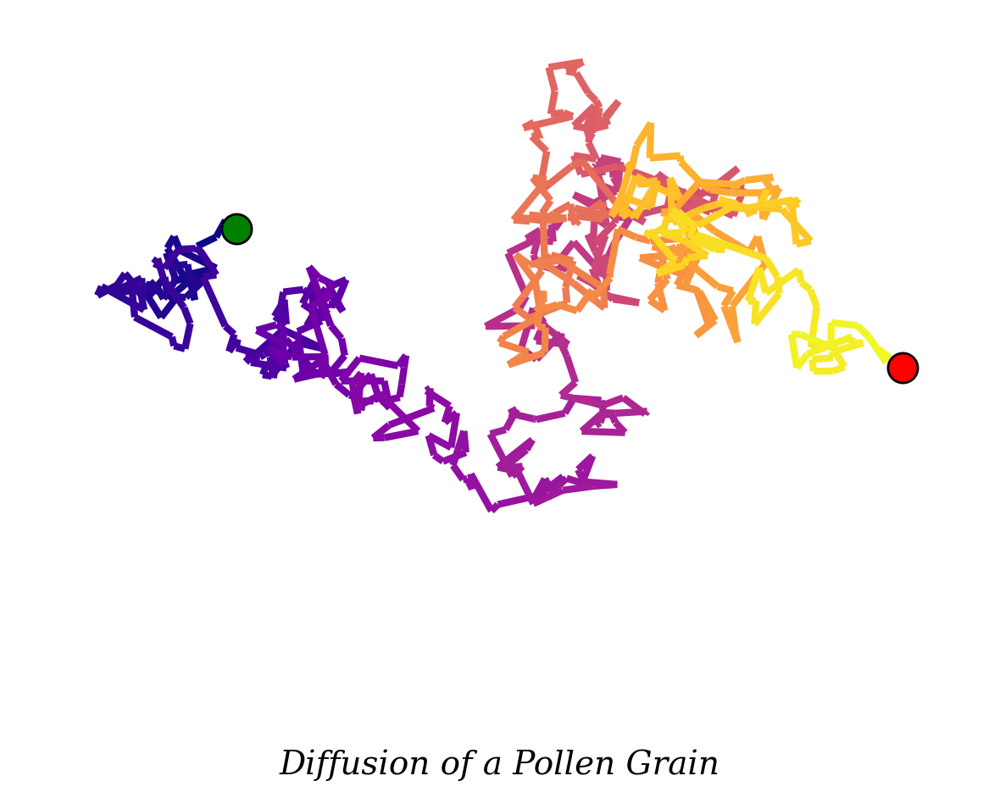

In [12]:
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.collections import LineCollection

# Parameters
n_steps = 600
dt = 0.05
D = 0.4
np.random.seed(1)

# Brownian increments
dx = np.sqrt(2*D*dt) * np.random.randn(n_steps)
dy = np.sqrt(2*D*dt) * np.random.randn(n_steps)

# Trajectory
x = np.cumsum(dx)
y = np.cumsum(dy)
points = np.array([x, y]).T.reshape(-1, 1, 2)
segments = np.concatenate([points[:-1], points[1:]], axis=1)

# Color map for time progression
lc = LineCollection(segments, cmap='plasma', norm=plt.Normalize(0, n_steps), linewidth=3)
lc.set_array(np.arange(n_steps))

# Plot
fig, ax = plt.subplots(figsize=(6,6), dpi=200)
ax.add_collection(lc)

# Start (green) and end (red) markers
ax.scatter(x[0], y[0], s=160, c='green', edgecolors='black', zorder=3)
ax.scatter(x[-1], y[-1], s=160, c='red', edgecolors='black', zorder=3)

# Remove axes for artistic effect
ax.set_xticks([])
ax.set_yticks([])
ax.set_frame_on(False)

# Keep equal scaling
ax.set_aspect("equal", adjustable="box")

# Add subtle margins
ax.margins(0.1)

# Title-like text floating below
fig.text(0.5, 0.02, "Diffusion of a Pollen Grain", ha="center", fontsize=14, style="italic")

plt.tight_layout()
plt.show()


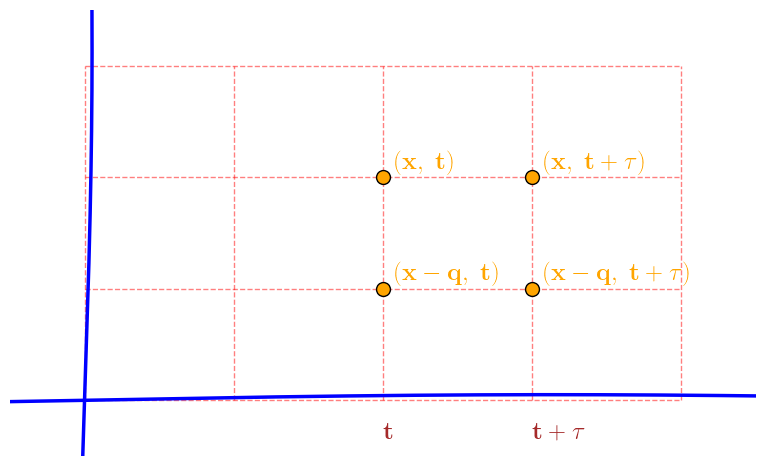

In [6]:
import matplotlib.pyplot as plt
import numpy as np

# Use LaTeX for text rendering
plt.rcParams.update({
    "text.usetex": True,
    "font.family": "serif",
    "font.size": 18
})

fig, ax = plt.subplots(figsize=(8, 5))

# Grid parameters
x_vals = np.linspace(0, 4, 5)
t_vals = np.linspace(0, 3, 4)

# Draw horizontal grid lines (t direction)
for t in t_vals:
    ax.plot([x_vals[0], x_vals[-1]], [t, t], color='red', lw=1, alpha=0.5, ls='--')

# Draw vertical grid lines (x direction)
for x in x_vals:
    ax.plot([x, x], [t_vals[0], t_vals[-1]], color='red', lw=1, alpha=0.5, ls='--')

# Curved blue axes
x_axis = np.linspace(-0.5, 4.5, 200)
t_axis = np.linspace(-0.5, 3.5, 200)
ax.plot(x_axis, 0.05*np.sin(0.5*x_axis), color='blue', lw=2.5)   # time axis curve
ax.plot(0.05*np.sin(0.5*t_axis), t_axis, color='blue', lw=2.5)   # space axis curve

# Points and labels
labels = [
    (2, 1, r"$\mathbf{(x-q, \ t)}$"),
    (3, 1, r"$\mathbf{(x-q, \ t+\tau)}$"),
    (2, 2, r"$\mathbf{(x, \ t)}$"),
    (3, 2, r"$\mathbf{(x, \ t+\tau)}$")
]

for x, t, label in labels:
    ax.scatter(x, t, color='orange', edgecolor='black', s=100, zorder=3)
    ax.text(x + 0.08, t + 0.08, label, color='orange', fontsize=18, fontweight='bold')

# Time labels
ax.text(2, -0.35, r"$\mathbf{t}$", color='brown', fontsize=18, fontweight='bold')
ax.text(3, -0.35, r"$\mathbf{t+\tau}$", color='brown', fontsize=18, fontweight='bold')

# Remove axis ticks
ax.set_xticks([])
ax.set_yticks([])

# Set limits
ax.set_xlim(-0.5, 4.5)
ax.set_ylim(-0.5, 3.5)

# Remove spines
for spine in ax.spines.values():
    spine.set_visible(False)

plt.tight_layout()
plt.show()


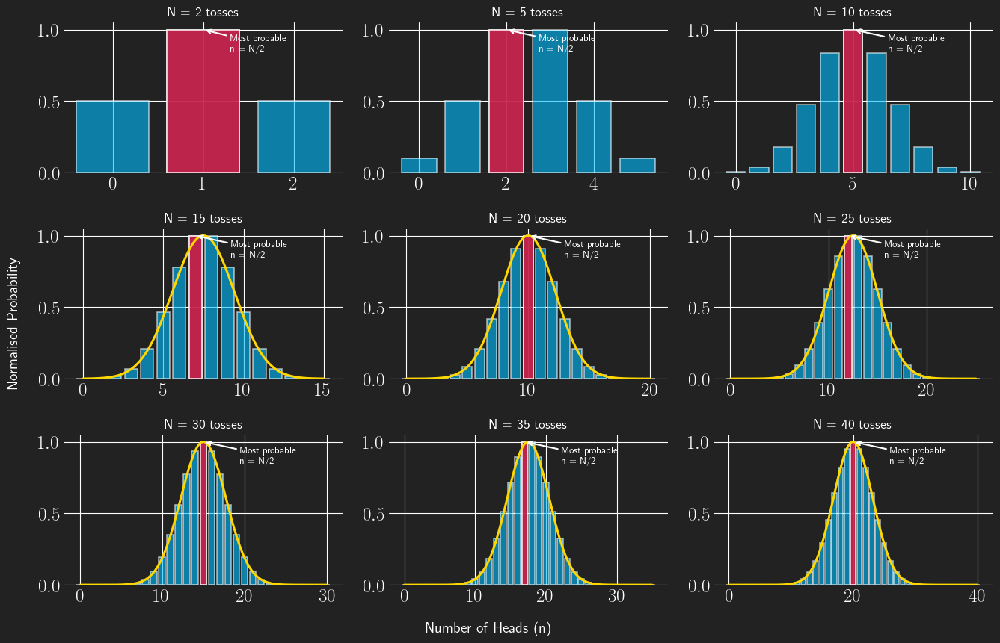

In [14]:
import numpy as np
import matplotlib.pyplot as plt
from scipy.stats import binom, norm

# Dark mode for beauty
plt.style.use('seaborn-v0_8-darkgrid')

# Different total numbers of tosses
N_values = [2, 5, 10, 15, 20, 25, 30, 35, 40]
p = 0.5  # Probability of heads

# Create subplots
fig, axes = plt.subplots(3, 3, figsize=(14, 9))
axes = axes.ravel()

for i, N in enumerate(N_values):
    k_values = np.arange(N + 1)
    probs = binom.pmf(k_values, N, p)
    probs_norm = probs / np.max(probs)

    # Plot binomial bars
    axes[i].bar(
        k_values, probs_norm, color='deepskyblue', alpha=0.6,
        edgecolor='white', linewidth=1.2
    )

    # Highlight most probable outcome
    most_probable = N // 2
    axes[i].bar(
        most_probable, probs_norm[most_probable],
        color='crimson', alpha=0.85, edgecolor='white', linewidth=1.2
    )

    axes[i].annotate(
        "Most probable\nn = N/2",
        xy=(most_probable, probs_norm[most_probable]),
        xytext=(most_probable + N*0.15, 0.85),
        arrowprops=dict(facecolor='crimson', edgecolor='white',
                        arrowstyle="->", lw=1.5),
        fontsize=9, color='white', ha='left'
    )

    # Overlay Gaussian for large N
    if N >= 15:
        mu, sigma = N * p, np.sqrt(N * p * (1 - p))
        x_smooth = np.linspace(0, N, 300)
        gaussian = norm.pdf(x_smooth, mu, sigma)
        gaussian /= np.max(gaussian)  # normalise to match height
        axes[i].plot(
            x_smooth, gaussian, color='gold', lw=2.2,
            label='Gaussian approx'
        )

    # Titles and limits
    axes[i].set_title(f'N = {N} tosses', fontsize=13, color='white', weight='bold')
    axes[i].set_ylim(0, 1.05)
    axes[i].tick_params(colors='white')

    # Remove axis labels except shared ones
    if i % 3 != 0:
        axes[i].set_ylabel("")
    if i < 6:
        axes[i].set_xlabel("")

# Shared axis labels
fig.text(0.5, 0.04, 'Number of Heads (n)', ha='center', fontsize=14, color='white', weight='bold')
fig.text(0.04, 0.5, 'Normalised Probability', va='center', rotation='vertical',
         fontsize=14, color='white', weight='bold')

# Dark background for entire figure
fig.patch.set_facecolor('#222222')
for ax in axes:
    ax.set_facecolor('#222222')

plt.tight_layout(rect=[0.05, 0.05, 1, 1])
plt.show()


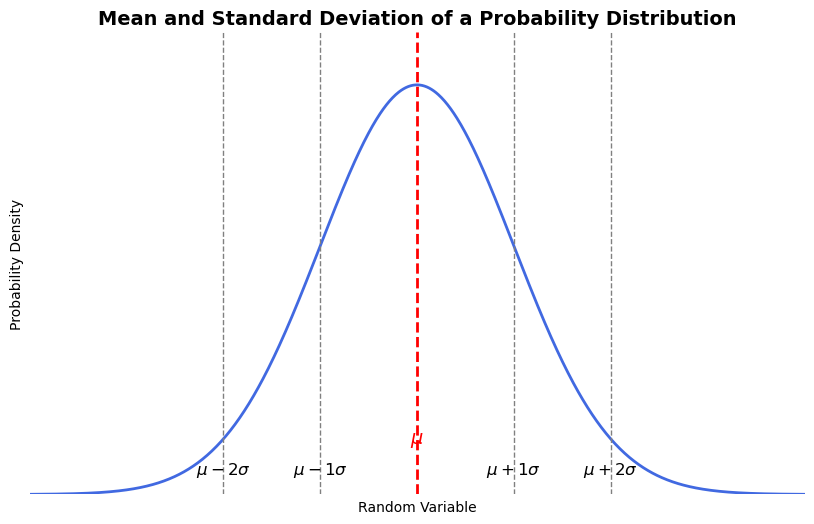

In [1]:
import numpy as np
import matplotlib.pyplot as plt
from scipy.stats import norm

# --- Parameters of Normal Distribution ---
mu = 0       # mean
sigma = 1    # standard deviation

# --- Generate values ---
x = np.linspace(-4, 4, 1000)
y = norm.pdf(x, mu, sigma)

# --- Plot ---
plt.figure(figsize=(10, 6))

# Smooth normal curve
plt.plot(x, y, color="royalblue", lw=2)

# Mean line
plt.axvline(mu, color="red", linestyle="--", lw=2, label=r"Mean $\mu$")

# Standard deviation lines
for k in [1, 2]:
    plt.axvline(mu + k*sigma, color="gray", linestyle="--", lw=1)
    plt.axvline(mu - k*sigma, color="gray", linestyle="--", lw=1)
    plt.text(mu + k*sigma, 0.02, f"$\\mu+{k}\\sigma$", ha="center", fontsize=12)
    plt.text(mu - k*sigma, 0.02, f"$\\mu-{k}\\sigma$", ha="center", fontsize=12)

# Label mean at bottom
plt.text(mu, 0.05, r"$\mu$", ha="center", color="red", fontsize=14, weight="bold")

# Styling
plt.title("Mean and Standard Deviation of a Probability Distribution", fontsize=14, weight="bold")
plt.xlabel("Random Variable")
plt.ylabel("Probability Density")
plt.ylim(0, 0.45)
plt.xlim(-4, 4)
plt.xticks([])  # hide x-axis numbers
plt.yticks([])  # hide y-axis numbers
plt.box(False)

plt.show()


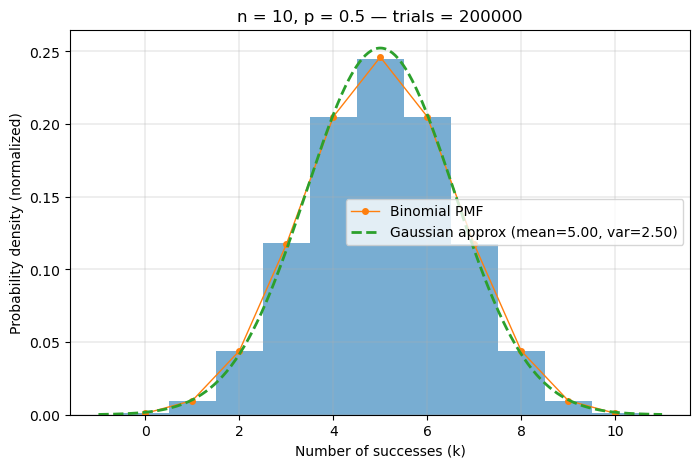

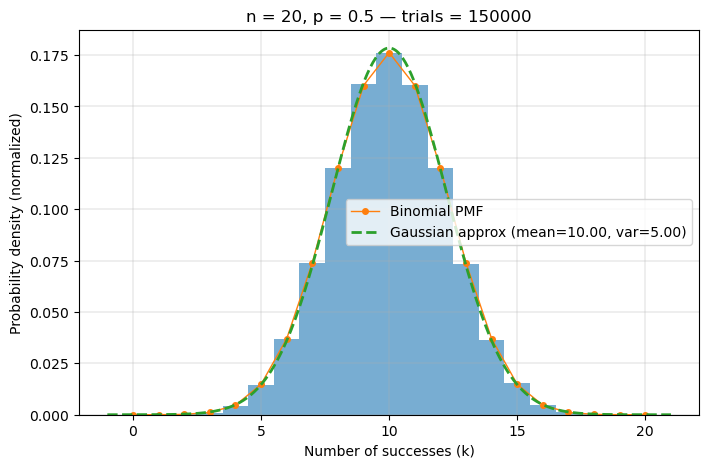

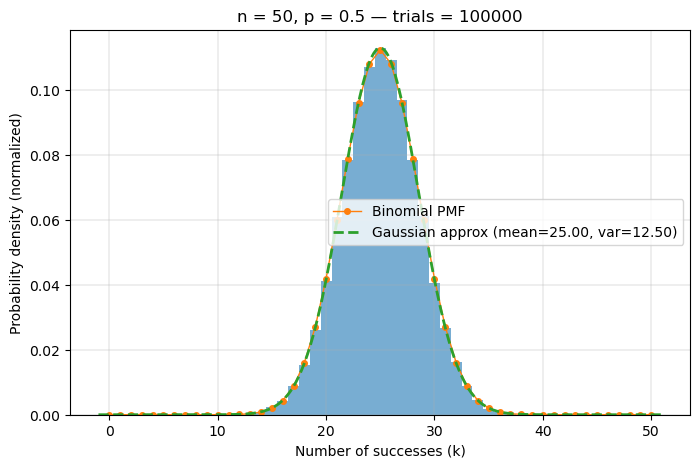

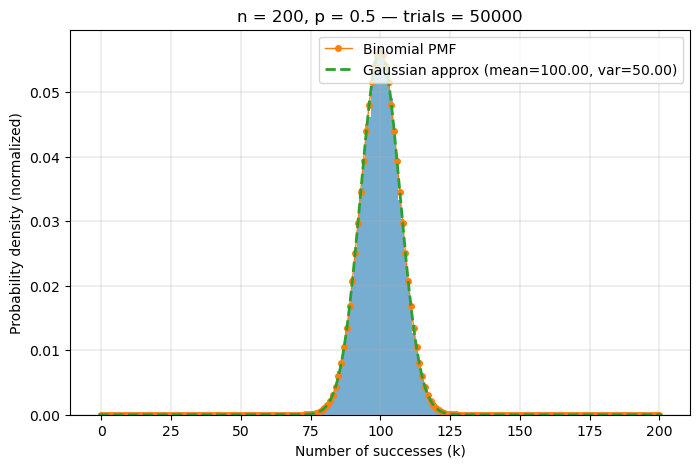

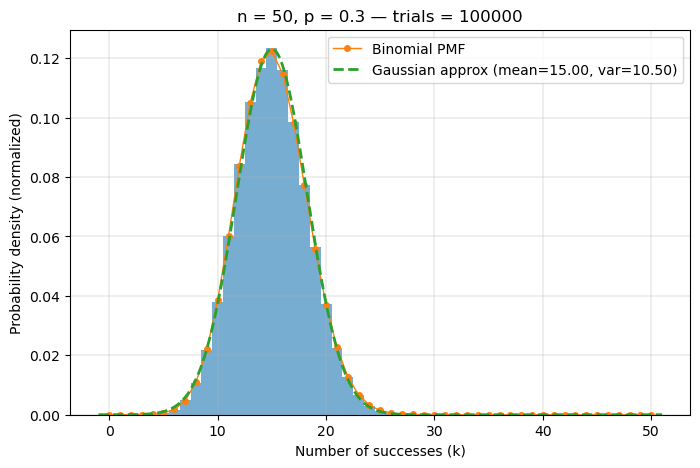

Quick summary (sample mean and variance vs theoretical):
n=10, p=0.5: sample mean=5.0015 (theo 5.0000), sample var=2.4920 (theo 2.5000)
n=20, p=0.5: sample mean=10.0052 (theo 10.0000), sample var=4.9658 (theo 5.0000)
n=50, p=0.5: sample mean=25.0104 (theo 25.0000), sample var=12.5033 (theo 12.5000)
n=200, p=0.5: sample mean=99.9574 (theo 100.0000), sample var=50.4817 (theo 50.0000)
n=50, p=0.3: sample mean=15.0042 (theo 15.0000), sample var=10.4494 (theo 10.5000)


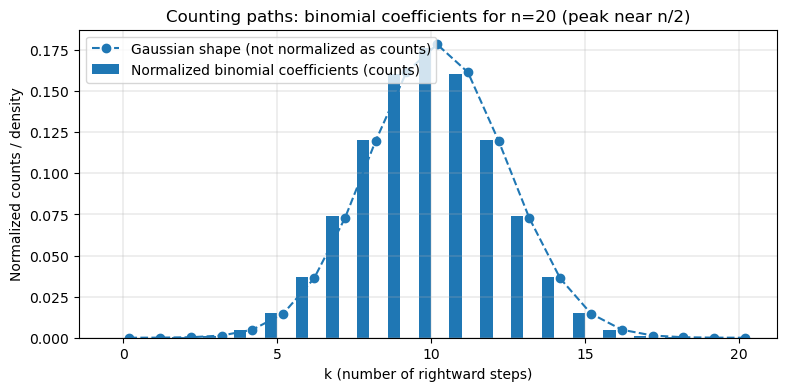

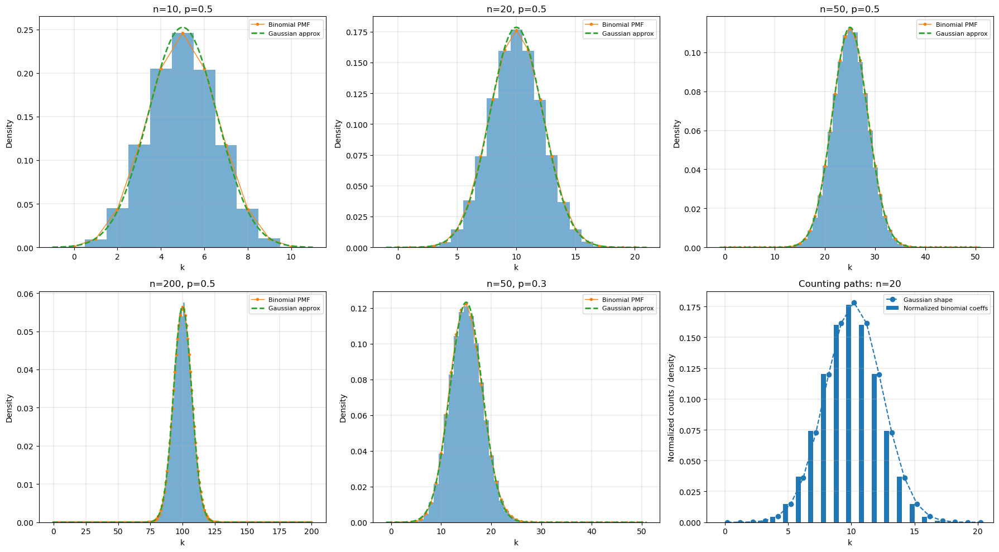

In [2]:
import numpy as np
import matplotlib.pyplot as plt
import math

def binom_pmf(n, p):
    ks = np.arange(n+1)
    pmf = np.array([math.comb(n, k) * (p**k) * ((1-p)**(n-k)) for k in ks])
    return ks, pmf

def normal_pdf(x, mu, sigma2):
    sigma = np.sqrt(sigma2)
    return (1.0 / (np.sqrt(2 * np.pi) * sigma)) * np.exp(-(x - mu)**2 / (2 * sigma2))

# Scenarios
scenarios = [
    {"n": 10,  "p": 0.5, "trials": 200000},
    {"n": 20,  "p": 0.5, "trials": 150000},
    {"n": 50,  "p": 0.5, "trials": 100000},
    {"n": 200, "p": 0.5, "trials": 50000},
    {"n": 50,  "p": 0.3, "trials": 100000},  # p not 1/2
]

# Create a figure with subplots
fig, axes = plt.subplots(2, 3, figsize=(18, 10))
axes = axes.flatten()

for i, sce in enumerate(scenarios):
    n = sce["n"]
    p = sce["p"]
    trials = sce["trials"]
    
    samples = np.random.binomial(n, p, size=trials)
    bins = np.arange(-0.5, n + 1.5, 1.0)
    
    ax = axes[i]
    ax.hist(samples, bins=bins, density=True, alpha=0.6)
    
    ks, pmf = binom_pmf(n, p)
    ax.plot(ks, pmf, marker='o', linestyle='-', linewidth=1, markersize=3, label='Binomial PMF')
    
    mu = n * p
    var = n * p * (1 - p)
    xs = np.linspace(-1, n + 1, 400)
    ax.plot(xs, normal_pdf(xs, mu, var), linestyle='--', linewidth=2, label='Gaussian approx')
    
    ax.set_title(f'n={n}, p={p}')
    ax.set_xlabel('k')
    ax.set_ylabel('Density')
    ax.legend(fontsize=8)
    ax.grid(True, linewidth=0.3)

# Last subplot: counting paths for n=20
n_demo = 20
ks, pmf = binom_pmf(n_demo, 0.5)
coeffs = np.array([math.comb(n_demo, k) for k in ks])

ax = axes[-1]
ax.bar(ks - 0.2, coeffs / coeffs.sum(), width=0.4, label='Normalized binomial coeffs')
ax.plot(ks + 0.2, normal_pdf(ks, n_demo*0.5, n_demo*0.5*0.5), marker='o', linestyle='--', label='Gaussian shape')
ax.set_title(f'Counting paths: n={n_demo}')
ax.set_xlabel('k')
ax.set_ylabel('Normalized counts / density')
ax.legend(fontsize=8)
ax.grid(True, linewidth=0.3)

plt.tight_layout()
plt.show()


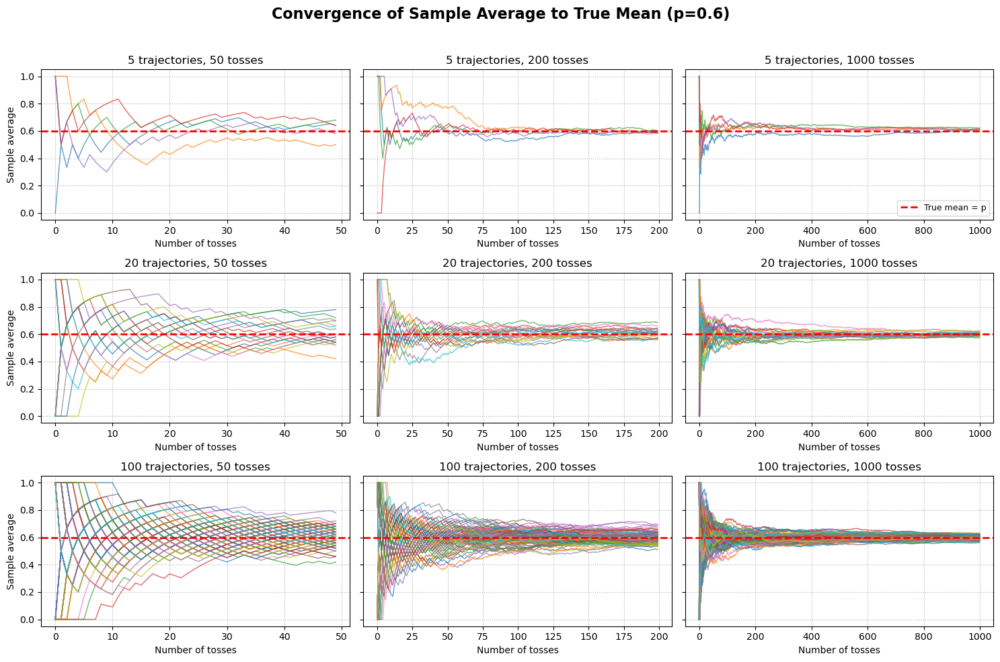

In [3]:
import numpy as np
import matplotlib.pyplot as plt

# Parameters
p = 0.6                     # probability of heads
true_mean = p
num_trajectories_list = [5, 20, 100]   # number of repeated experiments
num_tosses_list = [50, 200, 1000]      # number of tosses in each trajectory

# Create subplots grid
fig, axes = plt.subplots(len(num_trajectories_list), len(num_tosses_list), figsize=(15, 10), sharey=True)

for i, num_traj in enumerate(num_trajectories_list):
    for j, num_toss in enumerate(num_tosses_list):
        ax = axes[i, j]
        
        # Simulate trajectories
        for _ in range(num_traj):
            tosses = np.random.binomial(1, p, size=num_toss)
            cumulative_avg = np.cumsum(tosses) / (np.arange(num_toss) + 1)
            ax.plot(cumulative_avg, alpha=0.7, linewidth=1)
        
        # Plot true mean line
        ax.axhline(true_mean, color="red", linestyle="--", linewidth=2, label="True mean = p")
        
        # Formatting
        ax.set_title(f"{num_traj} trajectories, {num_toss} tosses")
        ax.set_xlabel("Number of tosses")
        if j == 0:
            ax.set_ylabel("Sample average")
        ax.grid(True, linestyle=":", linewidth=0.8)
        
        if i == 0 and j == len(num_tosses_list)-1:
            ax.legend(loc="lower right", fontsize=9)

plt.suptitle("Convergence of Sample Average to True Mean (p=0.6)", fontsize=16, weight="bold")
plt.tight_layout(rect=[0, 0, 1, 0.96])
plt.show()


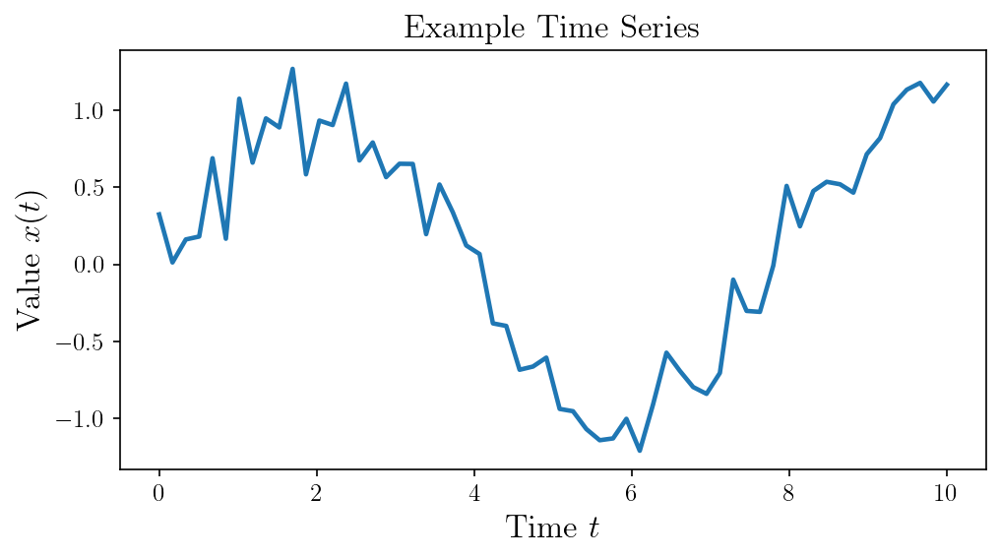

In [3]:
import numpy as np
import matplotlib.pyplot as plt

# --- Parameters ---
np.random.seed(1)     # reproducibility
T = 60                # number of time points
t = np.linspace(0, 10, T)
time_series = np.sin(0.8 * t) + 0.2 * np.random.randn(T)  # smooth series with small noise

# --- Plot Settings for Publication Quality ---
plt.rcParams.update({
    "text.usetex": True,            # LaTeX labels
    "font.family": "serif",         
    "font.size": 14,
    "axes.labelsize": 16,
    "axes.titlesize": 16,
    "legend.fontsize": 13,
    "xtick.labelsize": 12,
    "ytick.labelsize": 12,
    "figure.dpi": 150,
    "savefig.dpi": 300
})

# --- Plotting ---
plt.figure(figsize=(7,4))
plt.plot(t, time_series, '-', color='tab:blue', linewidth=2.2)

plt.xlabel(r"Time $t$")
plt.ylabel(r"Value $x(t)$")
plt.title(r"Example Time Series")

# Remove grid, keep clean look
  # optional: removes top & right spines for minimalism
plt.tight_layout()
plt.show()


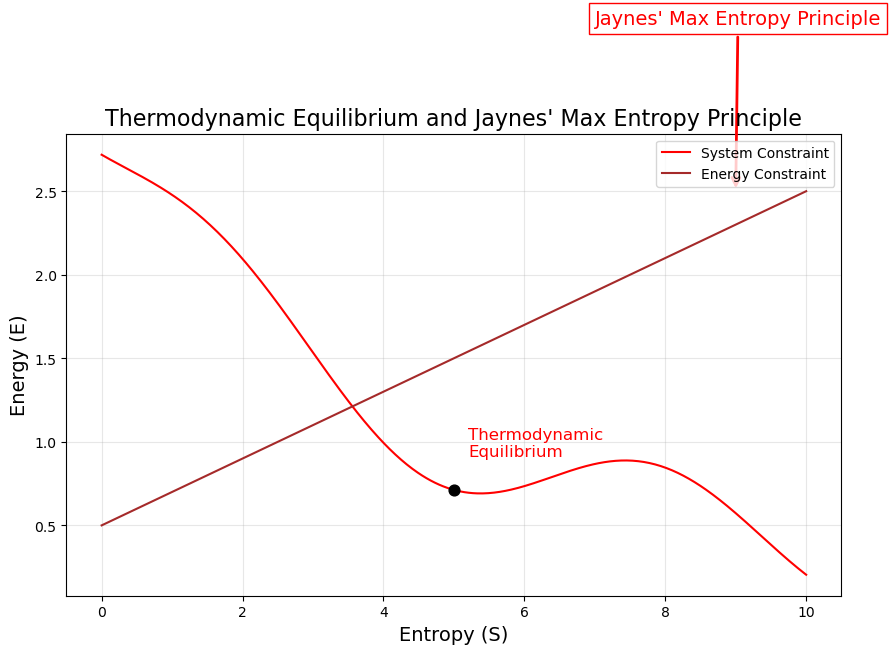

In [1]:
import matplotlib.pyplot as plt
import numpy as np

# X axis = entropy(S), Y axis = energy (E)
S = np.linspace(0, 10, 500)

# Two example curves (crossing around the middle)
curve1 = np.exp(-0.2 * (S-5)) + 0.3*np.sin(S)
curve2 = 0.2*S + 0.5

# Find approximate intersection (thermodynamic equilibrium)
# For illustration, just take midpoint
eq_S = 5
eq_E = np.interp(eq_S, S, curve1)

plt.figure(figsize=(10,6))

# Plot curves
plt.plot(S, curve1, label="System Constraint", color="red")
plt.plot(S, curve2, label="Energy Constraint", color="brown")

# Mark equilibrium point
plt.scatter(eq_S, eq_E, color="black", s=60, zorder=5)
plt.text(eq_S+0.2, eq_E+0.2, "Thermodynamic\nEquilibrium", fontsize=12, color="red")

# Arrow pointing to Jaynes' principle
plt.annotate("Jaynes' Max Entropy Principle",
             xy=(9, curve2[-1]), xycoords='data',
             xytext=(7, 3.5), textcoords='data',
             arrowprops=dict(arrowstyle="->", color="red", lw=2),
             fontsize=14, color="red", bbox=dict(facecolor='white', edgecolor='red'))

# Labels
plt.xlabel("Entropy (S)", fontsize=14)
plt.ylabel("Energy (E)", fontsize=14)

plt.title("Thermodynamic Equilibrium and Jaynes' Max Entropy Principle", fontsize=16)
plt.grid(alpha=0.3)
plt.legend()
plt.show()


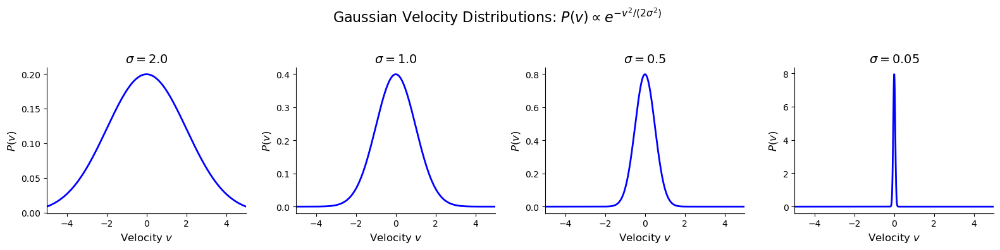

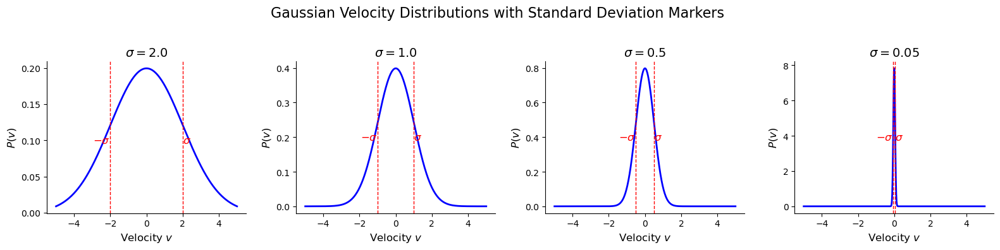

In [8]:
import numpy as np
import matplotlib.pyplot as plt

# Gaussian distribution function
def gaussian(v, sigma):
    return (1/(sigma*np.sqrt(2*np.pi))) * np.exp(-v**2/(2*sigma**2))

# Velocity range
v = np.linspace(-5, 5, 500)

# Standard deviations (decreasing from left to right)
sigmas = [2.0, 1.0, 0.5, 0.05]
labels = [r"$\sigma = 2.0$", r"$\sigma = 1.0$", r"$\sigma = 0.5$", r"$\sigma = 0.05$"]

# Create subplots (each with its own y-axis scale)
fig, axes = plt.subplots(1, 4, figsize=(16, 4), sharey=False)

for ax, sigma, label in zip(axes, sigmas, labels):
    y = gaussian(v, sigma)
    ax.plot(v, y, 'b-', lw=2)
    
    # Plot dashed vertical lines at ±sigma
    ax.axvline(x=+sigma, color='r', linestyle='--', lw=1)
    ax.axvline(x=-sigma, color='r', linestyle='--', lw=1)
    
    # Annotate sigma near the waist
    ax.text(sigma, max(y)*0.5, r"$\sigma$", color='r', fontsize=12, ha='left', va='center')
    ax.text(-sigma, max(y)*0.5, r"$-\sigma$", color='r', fontsize=12, ha='right', va='center')
    
    # Titles & labels
    ax.set_title(label, fontsize=14)
    ax.set_xlabel(r"Velocity $v$", fontsize=12)
    ax.set_ylabel(r"$P(v)$", fontsize=12)
    ax.grid(False)
    
    # Remove top/right spines
    ax.spines['top'].set_visible(False)
    ax.spines['right'].set_visible(False)

# Main title
fig.suptitle(r"Gaussian Velocity Distributions with Standard Deviation Markers", fontsize=16)

plt.tight_layout(rect=[0, 0, 1, 0.95])
plt.savefig("gaussian_velocity_with_sigma.png", dpi=300)
plt.show()


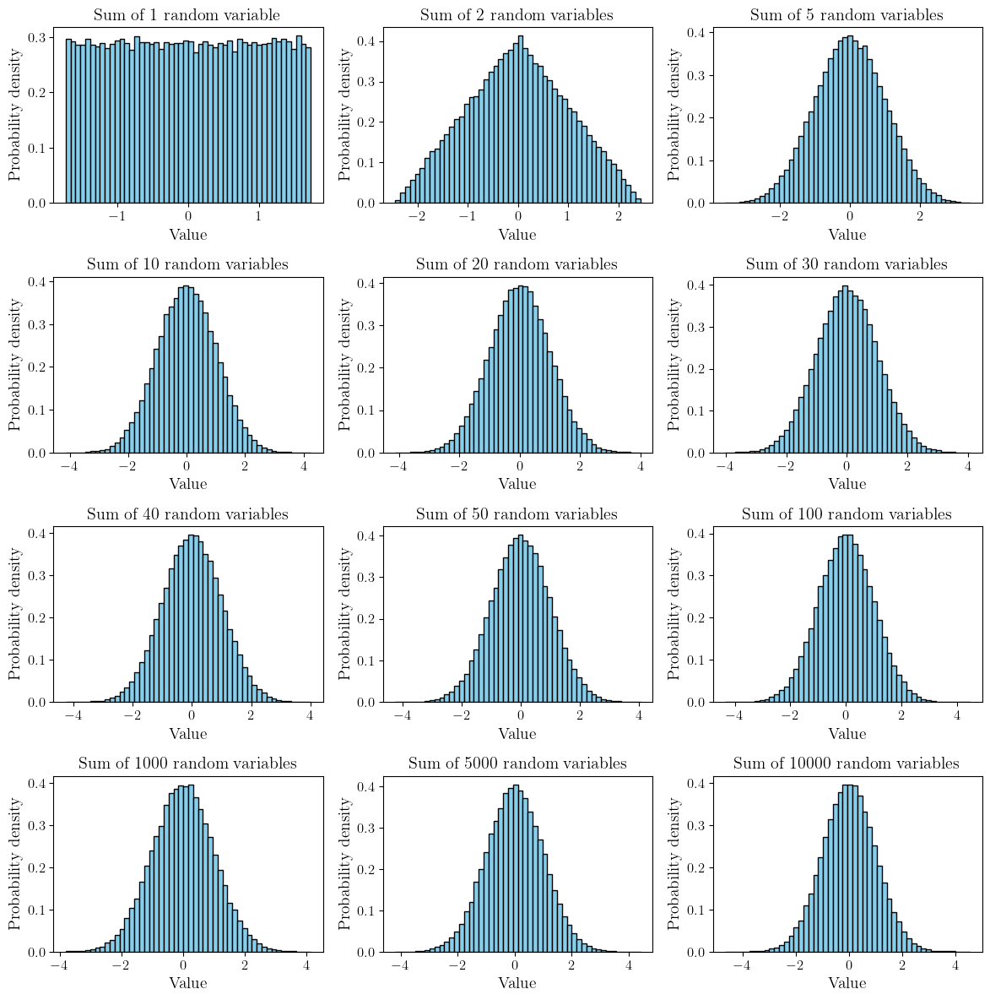

In [7]:
plt.rcParams.update({
    "text.usetex": True,
    "font.family": "serif",
    "axes.labelsize": 14,
    "font.size": 12,
    "legend.fontsize": 12,
    "xtick.labelsize": 12,
    "ytick.labelsize": 12,
})



import numpy as np
import matplotlib.pyplot as plt

# Settings
n_trials = 100000   # number of experiments
n_list = [1, 2, 5, 10, 20, 30, 40, 50, 100, 1000, 5000, 10000]  # number of random variables to sum

plt.figure(figsize=(12, 12))

for i, n in enumerate(n_list, 1):
    # Generate n uniform random variables and sum them
    samples = np.sum(np.random.rand(n_trials, n), axis=1)
    
    # Normalize to mean 0, variance 1 (to compare with Gaussian)
    samples = (samples - np.mean(samples)) / np.std(samples)
    
    plt.subplot(4, 3, i)
    plt.hist(samples, bins=50, density=True, color='skyblue', edgecolor='black')
    if n==1:
          plt.title(f"Sum of {n} random variable")
    else:
         plt.title(f"Sum of {n} random variables") 
    plt.xlabel("Value")
    plt.ylabel("Probability density")

plt.tight_layout()
plt.show()


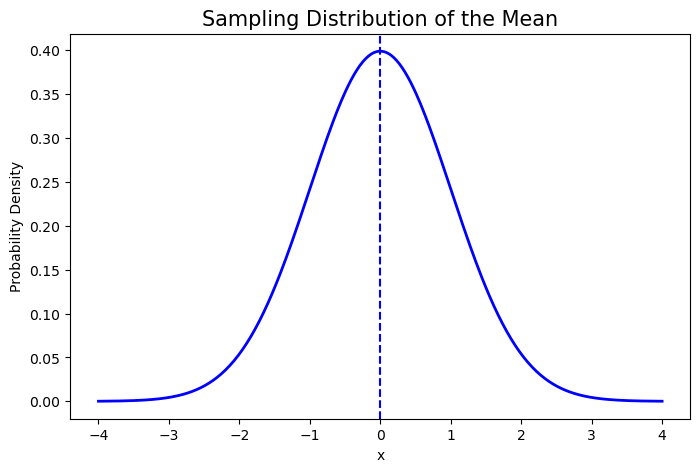

In [4]:
import numpy as np
import matplotlib.pyplot as plt

# Data for the normal distribution curve
mu = 0          # mean
sigma = 1       # standard deviation
x = np.linspace(-4, 4, 400)
y = 1/(sigma * np.sqrt(2*np.pi)) * np.exp(-0.5 * ((x - mu)/sigma)**2)

# Plot the bell curve
plt.figure(figsize=(8,5))
plt.plot(x, y, color='blue', linewidth=2)

# Mean line
plt.axvline(mu, color='blue', linestyle='--')


# Cleanup and title
plt.title("Sampling Distribution of the Mean", fontsize=15)
plt.xlabel('x')
plt.ylabel('Probability Density')
plt.grid(False)
plt.show()


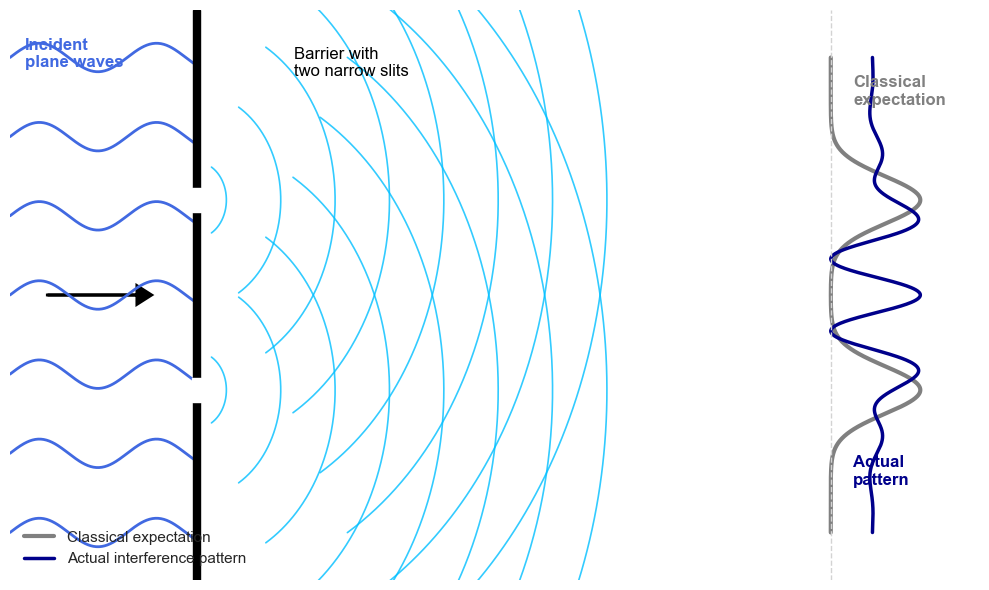

In [4]:
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.patches import Rectangle

# ---------- Setup ----------
plt.style.use("seaborn-v0_8-white")
fig, ax = plt.subplots(figsize=(10, 6))
ax.set_xlim(-3, 10)
ax.set_ylim(-3, 3)
ax.axis("off")

# ---------- Incoming plane waves ----------
for y0 in np.linspace(-2.5, 2.5, 7):
    x = np.linspace(-3, -0.5, 200)
    y = y0 + 0.15 * np.sin(4 * (x + 3))
    ax.plot(x, y, color="royalblue", lw=2)

# ---------- Barrier with two slits ----------
barrier_x = -0.5
barrier_height = 6
slit_positions = [-1.0, 1.0]
slit_length = 0.25

# Draw barrier
barrier = Rectangle((barrier_x - 0.05, -barrier_height/2), 0.1, barrier_height, color="black", zorder=5)
ax.add_patch(barrier)

# Cut slits
for pos in slit_positions:
    slit = Rectangle((barrier_x - 0.06, pos - slit_length/2), 0.12, slit_length, color="white", zorder=6)
    ax.add_patch(slit)

# ---------- Outgoing circular wavefronts ----------
theta = np.linspace(-np.pi/3, np.pi/3, 300)
for pos in slit_positions:
    for r in np.linspace(0.4, 5.5, 8):
        x = barrier_x + r * np.cos(theta)
        y = pos + r * np.sin(theta)
        ax.plot(x, y, color="deepskyblue", lw=1.2, alpha=0.8)

# ---------- Screen and patterns ----------
x_screen = 8.0
y = np.linspace(-2.5, 2.5, 800)

# --- Classical expectation: sum of two Gaussian intensities ---
I_classical = (
    np.exp(-((y - slit_positions[0])**2) / (2 * 0.25**2)) +
    np.exp(-((y - slit_positions[1])**2) / (2 * 0.25**2))
)
I_classical /= np.max(I_classical)

# --- Actual interference pattern: coherent superposition of both slits ---
# Two-slit interference formula: I = |E1 + E2|^2 = 2(1 + cos(kd sinθ))
k = 8  # wave number for fringe spacing
I_actual = (
    np.exp(-((y - slit_positions[0])**2) / (2 * 0.25**2)) +
    np.exp(-((y - slit_positions[1])**2) / (2 * 0.25**2)) +
    2 * np.exp(-(y**2)/(2 * 0.8**2)) * np.cos(k * y)
)
I_actual = (I_actual - np.min(I_actual)) / (np.max(I_actual) - np.min(I_actual))  # normalize

# Plot them on the screen (vertically)
ax.plot(x_screen + 1.2 * I_classical, y, color="gray", lw=3, label="Classical expectation")
ax.plot(x_screen + 1.2 * I_actual, y, color="darkblue", lw=2.5, label="Actual interference pattern")

# ---------- Optional: show screen line ----------
ax.plot([x_screen, x_screen], [-3, 3], "--", color="lightgray", lw=1)

# ---------- Annotations ----------
ax.text(-2.8, 2.4, "Incident\nplane waves", fontsize=12, color="royalblue", weight="bold")
ax.arrow(-2.5, 0, 1.2, 0, head_width=0.2, head_length=0.2, fc="black", ec="black", lw=2)

ax.text(0.8, 2.3, "Barrier with\ntwo narrow slits", fontsize=12, color="black")

ax.text(8.3, 2.0, "Classical\nexpectation", fontsize=12, color="gray", weight="bold")
ax.text(8.3, -2.0, "Actual\npattern", fontsize=12, color="darkblue", weight="bold")

# ---------- Legend ----------
ax.legend(loc="lower left", fontsize=11, frameon=False)

plt.tight_layout()
plt.show()


/var/folders/z9/4pcc0vs57ns2s8jv05__14_80000gn/T/ipykernel_52573/4229910043.py:102: UserWarning: Glyph 8322 (\N{SUBSCRIPT TWO}) missing from current font.
  plt.tight_layout()
/var/folders/z9/4pcc0vs57ns2s8jv05__14_80000gn/T/ipykernel_52573/4229910043.py:102: UserWarning: Glyph 8321 (\N{SUBSCRIPT ONE}) missing from current font.
  plt.tight_layout()
/Users/anaconda3/lib/python3.12/site-packages/IPython/core/pylabtools.py:170: UserWarning: Glyph 8322 (\N{SUBSCRIPT TWO}) missing from current font.
  fig.canvas.print_figure(bytes_io, **kw)
/Users/anaconda3/lib/python3.12/site-packages/IPython/core/pylabtools.py:170: UserWarning: Glyph 8321 (\N{SUBSCRIPT ONE}) missing from current font.
  fig.canvas.print_figure(bytes_io, **kw)


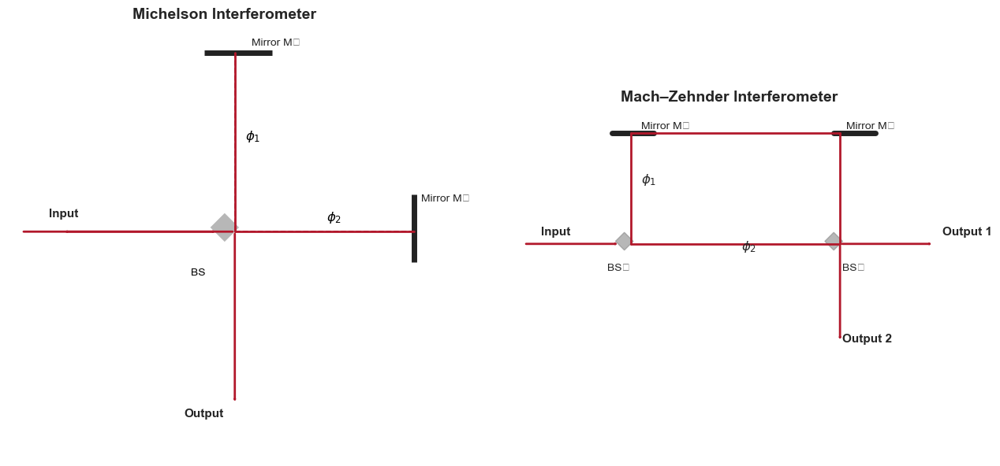

In [6]:
import matplotlib.pyplot as plt
from matplotlib.patches import Rectangle, FancyArrowPatch
import numpy as np

# ---- Plot setup ----
plt.style.use("seaborn-v0_8-whitegrid")
fig, axes = plt.subplots(1, 2, figsize=(13, 6))
for ax in axes:
    ax.set_aspect("equal")
    ax.axis("off")

red = "#b2182b"
gray = "#888888"
mirror_color = "#222222"

# ============================================================
# LEFT PANEL — Michelson Interferometer
# ============================================================
ax = axes[0]

# Beam splitter (semi-transparent)
bs = Rectangle((0, 0), 0.15, 0.15, angle=45, color=gray, alpha=0.6, lw=0)
ax.add_patch(bs)

# Mirrors
ax.plot([1.4, 1.4], [-0.15, 0.35], color=mirror_color, lw=5, solid_capstyle="butt")
ax.plot([-0.15, 0.35], [1.4, 1.4], color=mirror_color, lw=5, solid_capstyle="butt")

# Input beam
ax.add_patch(FancyArrowPatch((-1.5, 0.075), (-0.05, 0.075), arrowstyle="->", color=red, lw=2))

# Split beams
ax.plot([0.075, 0.075], [0.075, 1.4], color=red, lw=2)
ax.plot([0.075, 1.4], [0.075, 0.075], color=red, lw=2)

# Reflected beams (dashed)
ax.plot([1.4, 0.075], [0.075, 0.075], "--", color=red, lw=1.3)
ax.plot([0.075, 0.075], [1.4, 0.075], "--", color=red, lw=1.3)

# Output beams
ax.add_patch(FancyArrowPatch((0.075, 0.075), (0.075, -1.2), arrowstyle="->", color=red, lw=2))
ax.add_patch(FancyArrowPatch((0.075, 0.075), (-1.2, 0.075), arrowstyle="->", color=red, lw=2))

# Labels
ax.text(-1.3, 0.18, "Input", fontsize=11, weight="bold")
ax.text(-0.3, -1.3, "Output", fontsize=11, weight="bold")
ax.text(1.45, 0.3, "Mirror M₂", fontsize=10)
ax.text(0.2, 1.45, "Mirror M₁", fontsize=10)
ax.text(-0.25, -0.25, "BS", fontsize=10, color="black")
ax.text(0.15, 0.75, r"$\phi_1$", fontsize=12, color="black")
ax.text(0.75, 0.15, r"$\phi_2$", fontsize=12, color="black")

ax.set_xlim(-1.6, 1.6)
ax.set_ylim(-1.6, 1.6)
ax.set_title("Michelson Interferometer", fontsize=14, weight="bold")

# ============================================================
# RIGHT PANEL — Mach–Zehnder Interferometer
# ============================================================
ax = axes[1]

# Beam splitters
bs1 = Rectangle((0, 0), 0.15, 0.15, angle=45, color=gray, alpha=0.6)
bs2 = Rectangle((2.5, 0), 0.15, 0.15, angle=45, color=gray, alpha=0.6)
ax.add_patch(bs1)
ax.add_patch(bs2)

# Mirrors
ax.plot([-0.15, 0.35], [1.4, 1.4], color=mirror_color, lw=5)
ax.plot([2.5, 3.0], [1.4, 1.4], color=mirror_color, lw=5)

# Input beam
ax.add_patch(FancyArrowPatch((-1.2, 0.075), (-0.05, 0.075), arrowstyle="->", color=red, lw=2))

# Upper path
ax.plot([0.075, 0.075], [0.075, 1.4], color=red, lw=2)
ax.plot([0.075, 2.575], [1.4, 1.4], color=red, lw=2)
ax.plot([2.575, 2.575], [1.4, 0.075], color=red, lw=2)

# Lower path
ax.plot([0.075, 2.575], [0.075, 0.075], color=red, lw=2)

# Output beams
ax.add_patch(FancyArrowPatch((2.575, 0.075), (3.7, 0.075), arrowstyle="->", color=red, lw=2))
ax.add_patch(FancyArrowPatch((2.575, 0.075), (2.575, -1.1), arrowstyle="->", color=red, lw=2))

# Labels
ax.text(-1.0, 0.18, "Input", fontsize=11, weight="bold")
ax.text(3.8, 0.18, "Output 1", fontsize=11, weight="bold")
ax.text(2.6, -1.1, "Output 2", fontsize=11, weight="bold")
ax.text(0.2, 1.45, "Mirror M₁", fontsize=10)
ax.text(2.65, 1.45, "Mirror M₂", fontsize=10)
ax.text(-0.2, -0.25, "BS₁", fontsize=10)
ax.text(2.6, -0.25, "BS₂", fontsize=10)
ax.text(0.2, 0.8, r"$\phi_1$", fontsize=12)
ax.text(1.4, 0.0, r"$\phi_2$", fontsize=12)

ax.set_xlim(-1.5, 4.0)
ax.set_ylim(-1.5, 1.7)
ax.set_title("Mach–Zehnder Interferometer", fontsize=14, weight="bold")

plt.tight_layout()
plt.show()


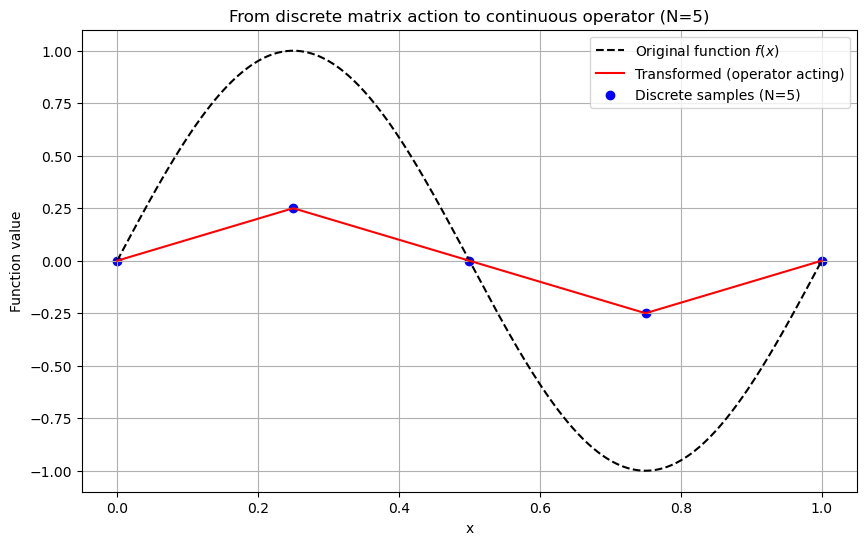

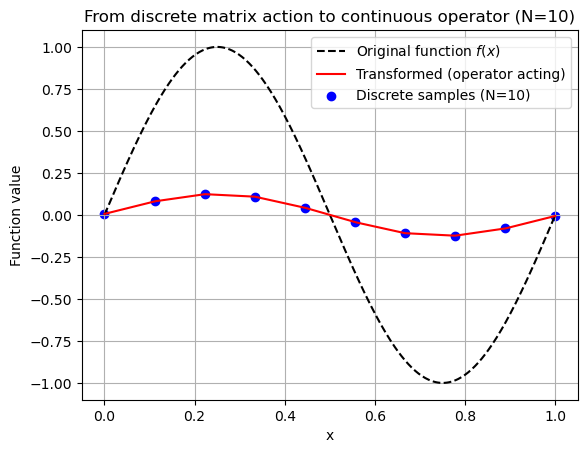

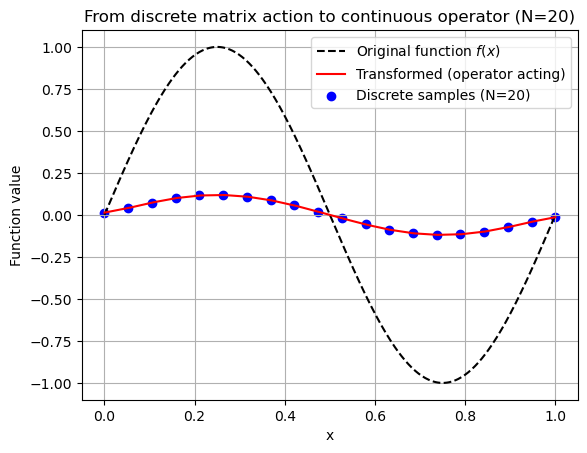

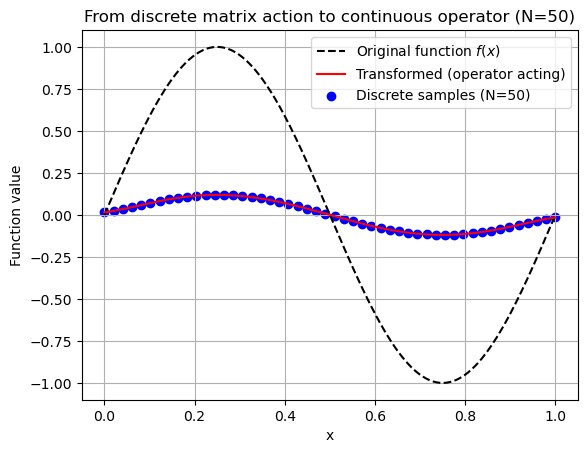

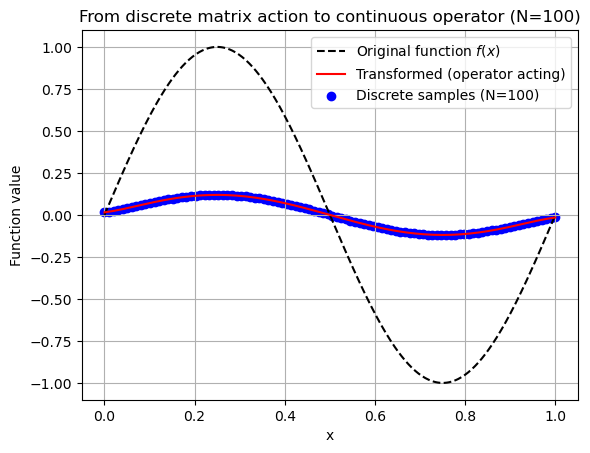

In [9]:
import numpy as np
import matplotlib.pyplot as plt

# Continuous domain
x_cont = np.linspace(0, 1, 400)
f_cont = np.sin(2*np.pi*x_cont)  # true continuous function

# Define a "matrix kernel" corresponding to a smoothing operator
def kernel(x, xprime, sigma=0.05):
    return np.exp(-(x - xprime)**2 / (2 * sigma**2))

plt.figure(figsize=(10, 6))

# Discretisation levels
Ns = [5, 10, 20, 50, 100]

for N in Ns:
    x = np.linspace(0, 1, N)
    dx = x[1] - x[0]
    f = np.sin(2*np.pi*x)
    
    # Build discretised kernel matrix
    K = np.zeros((N, N))
    for i in range(N):
        for j in range(N):
            K[i, j] = kernel(x[i], x[j])
    
    # Matrix acts on discrete vector (approximate integral)
    f_transformed = K @ f * dx
    
    # Interpolate to continuous domain for plotting
    f_interp = np.interp(x_cont, x, f_transformed)
    
    plt.clf()
    plt.plot(x_cont, np.sin(2*np.pi*x_cont), 'k--', label='Original function $f(x)$')
    plt.plot(x_cont, f_interp, 'r-', label='Transformed (operator acting)')
    plt.scatter(x, f_transformed, color='blue', label=f'Discrete samples (N={N})')
    plt.title(f"From discrete matrix action to continuous operator (N={N})")
    plt.xlabel("x")
    plt.ylabel("Function value")
    plt.legend()
    plt.grid(True)
    plt.pause(1.2)

plt.show()


FileNotFoundError: [Errno 2] No such file or directory: '/mnt/data/discrete_to_continuous.png'

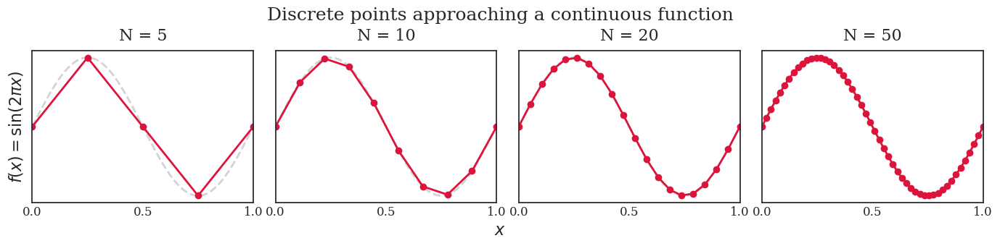

In [10]:
import numpy as np
import matplotlib.pyplot as plt

# --- Matplotlib styling for publication quality ---
plt.style.use('seaborn-v0_8-white')
plt.rcParams.update({
    "font.size": 14,
    "font.family": "serif",
    "axes.labelsize": 16,
    "axes.titlesize": 16,
    "xtick.labelsize": 12,
    "ytick.labelsize": 12,
    "figure.figsize": (12, 6),
    "lines.linewidth": 2,
})

# --- Define the continuous function ---
def f(x):
    return np.sin(2 * np.pi * x)

x_cont = np.linspace(0, 1, 1000)
y_cont = f(x_cont)

# --- Discretisation levels ---
samples = [5, 10, 20, 50]
titles = [f"N = {N}" for N in samples]

# --- Create subplots ---
fig, axes = plt.subplots(1, len(samples), sharey=True, figsize=(14, 3))

for ax, N, title in zip(axes, samples, titles):
    x_disc = np.linspace(0, 1, N)
    y_disc = f(x_disc)

    # Plot continuous curve (light gray for reference)
    ax.plot(x_cont, y_cont, color='lightgray', linestyle='--', zorder=1)
    # Plot discrete samples as red points with smooth connecting line
    ax.plot(x_disc, y_disc, 'o-', color='crimson', markersize=6, zorder=2)

    # Aesthetic clean-up
    ax.set_title(title, pad=10)
    ax.set_xlim(0, 1)
    ax.set_ylim(-1.1, 1.1)
    ax.set_xticks([0, 0.5, 1.0])
    ax.set_yticks([-1, 0, 1])
    ax.grid(False)
    if ax != axes[0]:
        ax.set_yticklabels([])  # hide y labels except first subplot
    else:
        ax.set_ylabel(r"$f(x) = \sin(2\pi x)$")

# --- Common X label ---
fig.text(0.5, 0.0, r"$x$", ha='center', fontsize=16)
fig.suptitle("Discrete points approaching a continuous function", fontsize=18, y=1.05)

# --- Layout adjustments ---
plt.tight_layout()
plt.subplots_adjust(top=0.85, bottom=0.15, wspace=0.1)

# --- Save high-resolution figure ---
plt.savefig("/mnt/data/discrete_to_continuous.png", dpi=400, bbox_inches='tight')
plt.show()


FileNotFoundError: [Errno 2] No such file or directory: '/mnt/data/stern_gerlach.png'

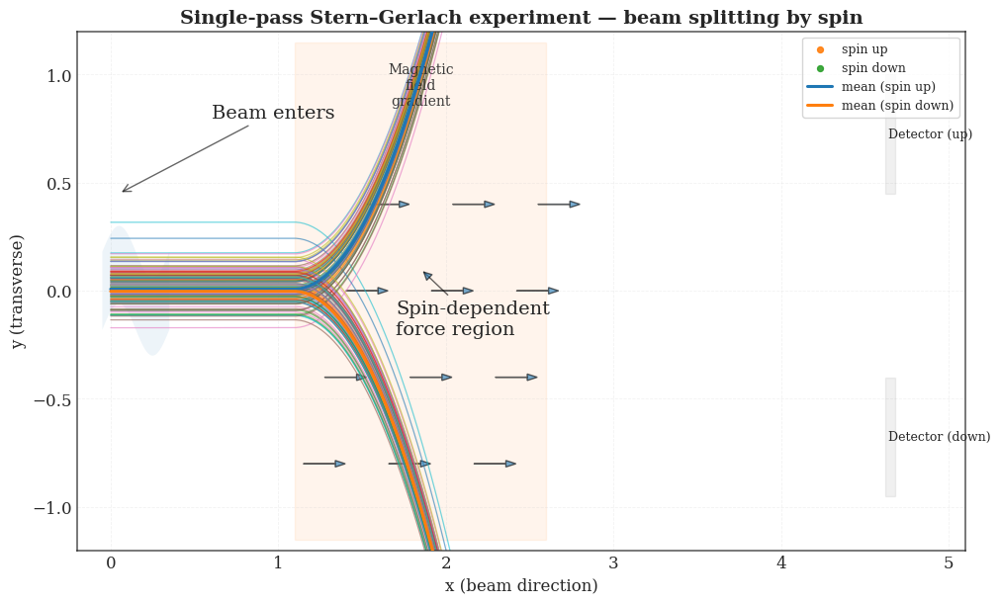

In [11]:
# Simulate and draw an aesthetic single-pass Stern–Gerlach experiment
# - Simulates many particle trajectories with spin ±1
# - Particles travel along +x; in a magnetic-gradient region they receive a spin-dependent transverse kick
# - Produces a publication-ready, single-figure visualization
# Output saved to /mnt/data/stern_gerlach.png for download

import numpy as np
import matplotlib.pyplot as plt

# --- Parameters ---
np.random.seed(1)
N = 800               # number of particles
sigma_y0 = 0.08       # initial beam width (in arbitrary units)
x_start, x_end = 0.0, 5.0
n_steps = 200
xs = np.linspace(x_start, x_end, n_steps)

# Magnetic field gradient region (where spin-dependent force acts)
b_region = (1.1, 2.6)   # x-interval of magnetic field gradient
kick_strength = 3.5     # strength of spin-dependent acceleration (controls separation)
transverse_noise = 0.005  # small random jitter in transverse velocity

# Initialize particles: positions and spins
y0 = np.random.normal(0, sigma_y0, size=N)   # initial y positions
vx = 1.0  # longitudinal velocity (units: dx per step)
spins = np.random.choice([-1, 1], size=N)  # spin -1 (down) or +1 (up)

# Pre-calculate trajectories
trajectories_x = np.tile(xs, (N, 1))
trajectories_y = np.zeros_like(trajectories_x)
trajectories_y[:, 0] = y0

# simple Euler integration: particles move along x with vx; when inside b_region they accelerate in y
dt = (xs[1] - xs[0]) / vx
vy = np.zeros(N)  # initial transverse velocities

for i, x in enumerate(xs[:-1]):
    inside = (x >= b_region[0]) & (x <= b_region[1])
    # acceleration only for particles inside the magnetic gradient: a_y = spin * kick_strength (scaled)
    ay = np.zeros(N)
    ay[inside] = spins[inside] * kick_strength
    # small random jitter
    ay += np.random.normal(0, transverse_noise, size=N)
    # update velocities and positions
    vy = vy + ay * dt
    trajectories_y[:, i+1] = trajectories_y[:, i] + vy * dt

# detectors: position at x = 4.6
detector_x = 4.6
detector_idx = np.argmin(np.abs(xs - detector_x))
detector_y = trajectories_y[:, detector_idx]

# Prepare figure
fig, ax = plt.subplots(figsize=(10, 6), constrained_layout=True)
ax.set_xlim(x_start - 0.2, x_end + 0.1)
ax.set_ylim(-1.2, 1.2)

# Background subtle grid and axis styling
ax.grid(alpha=0.25, linestyle='--', linewidth=0.6)
ax.set_xlabel("x (beam direction)", fontsize=12)
ax.set_ylabel("y (transverse)", fontsize=12)
ax.set_title("Single-pass Stern–Gerlach experiment — beam splitting by spin", fontsize=14, weight='bold')

# Draw incoming beam as semi-transparent narrow ribbon near x_start
beam_inset_x = np.linspace(x_start - 0.05, x_start + 0.35, 50)
beam_inset_y = 0 + 0.12 * np.sin(np.linspace(0, 2*np.pi, beam_inset_x.size))
ax.fill_between(beam_inset_x, beam_inset_y - 0.18, beam_inset_y + 0.18, alpha=0.08)

# Draw magnetic-field-gradient region as a soft rectangle with arrow glyphs showing gradient direction
rect = plt.Rectangle((b_region[0], -1.15), b_region[1]-b_region[0], 2.3, color='tab:orange', alpha=0.08, zorder=0)
ax.add_patch(rect)
# gradient arrows
n_arrows = 12
arrow_xs = np.linspace(b_region[0]+0.05, b_region[1]-0.05, n_arrows)
for i, axpos in enumerate(arrow_xs):
    ay = -0.8 + (i % 4) * 0.4
    ax.arrow(axpos, ay, 0.25, 0.0, head_width=0.03, head_length=0.06, length_includes_head=True, alpha=0.6)

ax.text((b_region[0]+b_region[1])/2, 0.95, "Magnetic\nfield\ngradient", ha='center', va='center', fontsize=10, alpha=0.9)

# Plot sample trajectories with faint lines and color by spin
# To keep it aesthetic, plot a subsample of trajectories as lines
subsample = np.random.choice(N, size=120, replace=False)
for idx in subsample:
    c = 'C0' if spins[idx] == 1 else 'C3'  # up->C0 (blue), down->C3 (purple-ish)
    ax.plot(trajectories_x[idx], trajectories_y[idx], linewidth=0.9, alpha=0.6, zorder=1, solid_capstyle='round')

# Plot as points at detector plane to emphasize two spots
# Use a small jitter for aesthetics
up_mask = spins == 1
down_mask = spins == -1
ax.scatter(np.full(np.sum(up_mask), xs[detector_idx]), detector_y[up_mask], s=18, alpha=0.9, marker='o', label='spin up', zorder=3)
ax.scatter(np.full(np.sum(down_mask), xs[detector_idx]), detector_y[down_mask], s=18, alpha=0.9, marker='o', label='spin down', zorder=3)

# Draw detectors as two rectangles and show smoothed detection profiles (gaussian blobs)
det_w = 0.06
det_h = 0.55
ax.add_patch(plt.Rectangle((detector_x + 0.02, 0.45), det_w, det_h, color='black', alpha=0.06))
ax.add_patch(plt.Rectangle((detector_x + 0.02, -0.95), det_w, det_h, color='black', alpha=0.06))
ax.text(detector_x + 0.04, 0.45 + det_h/2, "Detector (up)", va='center', ha='left', fontsize=9)
ax.text(detector_x + 0.04, -0.95 + det_h/2, "Detector (down)", va='center', ha='left', fontsize=9)

# Add average trajectories for each spin (thicker lines)
mean_up_y = trajectories_y[up_mask].mean(axis=0)
mean_down_y = trajectories_y[down_mask].mean(axis=0)
ax.plot(xs, mean_up_y, linewidth=2.2, label='mean (spin up)', zorder=4)
ax.plot(xs, mean_down_y, linewidth=2.2, label='mean (spin down)', zorder=4)

# Annotations and legend
ax.annotate("Beam enters", xy=(0.05, 0.45), xytext=(0.6, 0.8), arrowprops=dict(arrowstyle="->", alpha=0.6))
ax.annotate("Spin-dependent\nforce region", xy=((b_region[0]+b_region[1])/2, 0.1), xytext=(1.7, -0.2),
            arrowprops=dict(arrowstyle="-|>", alpha=0.6))
ax.legend(frameon=True, fontsize=9, loc='upper right')

# Polish appearance
for spine in ax.spines.values():
    spine.set_alpha(0.7)
ax.set_aspect('auto')

# Save and show
outpath = "/mnt/data/stern_gerlach.png"
plt.savefig(outpath, dpi=300, bbox_inches='tight', facecolor='white')
plt.show()

print(f"Saved figure to {outpath}")


/var/folders/z9/4pcc0vs57ns2s8jv05__14_80000gn/T/ipykernel_52573/4153361348.py:35: UserWarning: Setting the 'color' property will override the edgecolor or facecolor properties.
  ax.add_patch(plt.Polygon([[pole_x, 0.3], [pole_x + 0.45, 0.6],
/var/folders/z9/4pcc0vs57ns2s8jv05__14_80000gn/T/ipykernel_52573/4153361348.py:41: UserWarning: Setting the 'color' property will override the edgecolor or facecolor properties.
  ax.add_patch(plt.Polygon([[pole_x, -0.3], [pole_x + 0.45, -0.7],


FileNotFoundError: [Errno 2] No such file or directory: '/mnt/data/stern_gerlach_publication_schematic.png'

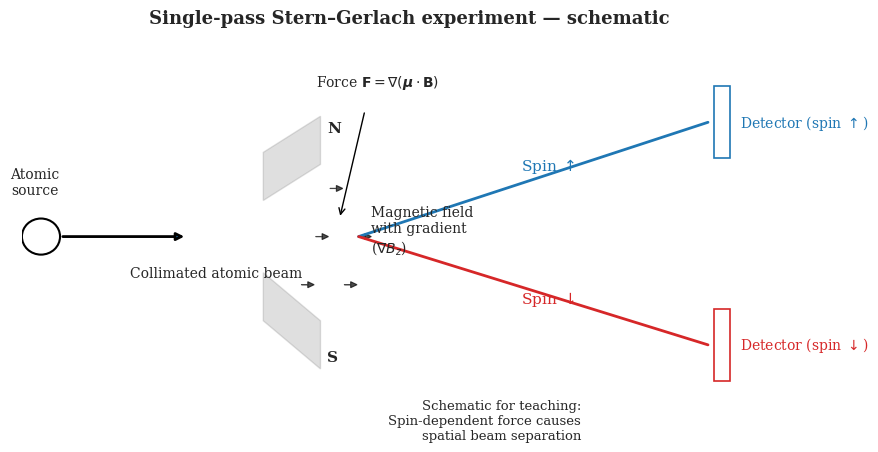

In [12]:
# Publication-ready schematic of a single-pass Stern–Gerlach experiment
# Author: Sooryansh Asthana + ChatGPT (GPT-5)
# Produces a teaching-quality, asymmetric-magnet diagram.

import matplotlib.pyplot as plt
import numpy as np

plt.rcParams.update({
    "font.family": "serif",
    "font.size": 11,
    "axes.linewidth": 1.0,
    "text.usetex": False
})

fig, ax = plt.subplots(figsize=(10, 5))
ax.set_xlim(-0.6, 5.5)
ax.set_ylim(-1.6, 1.6)
ax.axis('off')

# -----------------------------------------------------------
# 1. Source and incoming beam
# -----------------------------------------------------------
beam_x = -0.45
ax.add_patch(plt.Circle((beam_x, 0.0), 0.15, fill=False, linewidth=1.5))
ax.annotate("", xy=(0.7, 0.0), xytext=(beam_x + 0.15, 0.0),
            arrowprops=dict(arrowstyle="-|>", linewidth=2))
ax.text(beam_x - 0.05, 0.35, "Atomic\nsource", ha='center', fontsize=10)
ax.text(0.25, -0.25, "Collimated atomic beam", fontsize=10, va='top')

# -----------------------------------------------------------
# 2. Magnetic field region (asymmetric poles)
# -----------------------------------------------------------
pole_x = 1.3
# Top pole: thinner, angled shape
ax.add_patch(plt.Polygon([[pole_x, 0.3], [pole_x + 0.45, 0.6],
                          [pole_x + 0.45, 1.0], [pole_x, 0.7]],
                         closed=True, fill=True, color='gray', alpha=0.25, edgecolor='black'))
ax.text(pole_x + 0.5, 0.9, "N", ha='left', va='center', fontsize=11, weight='bold')

# Bottom pole: thicker, closer to beam axis
ax.add_patch(plt.Polygon([[pole_x, -0.3], [pole_x + 0.45, -0.7],
                          [pole_x + 0.45, -1.1], [pole_x, -0.7]],
                         closed=True, fill=True, color='gray', alpha=0.25, edgecolor='black'))
ax.text(pole_x + 0.5, -1.0, "S", ha='left', va='center', fontsize=11, weight='bold')

# Label for field gradient
ax.text(pole_x + 0.85, 0.05, "Magnetic field\nwith gradient\n($\\nabla B_z$)", 
        fontsize=10, va='center', ha='left')

# Field lines (subtle)
arrow_xs = np.linspace(pole_x + 0.3, pole_x + 0.75, 5)
for i, xx in enumerate(arrow_xs):
    yy = -0.4 + (i % 3) * 0.4
    ax.arrow(xx, yy, 0.1, 0, head_width=0.05, head_length=0.05,
             linewidth=0.8, alpha=0.7, color='black', length_includes_head=True)

# -----------------------------------------------------------
# 3. Beam splitting (schematic trajectories)
# -----------------------------------------------------------
split_x = pole_x + 0.75
x_end = 4.8

# Up and down beams
ax.plot([split_x, x_end], [0.0, 0.95], linewidth=2.0, color='C0')
ax.plot([split_x, x_end], [0.0, -0.9], linewidth=2.0, color='C3')

ax.text((split_x + x_end) / 2 - 0.1, 0.55, "Spin $\\uparrow$", fontsize=11, color='C0')
ax.text((split_x + x_end) / 2 - 0.1, -0.55, "Spin $\\downarrow$", fontsize=11, color='C3')

# -----------------------------------------------------------
# 4. Detectors (clean rectangular detectors)
# -----------------------------------------------------------
det_w, det_h = 0.12, 0.6
ax.add_patch(plt.Rectangle((x_end + 0.05, 0.95 - det_h/2), det_w, det_h,
                           linewidth=1.2, fill=False, edgecolor='C0'))
ax.add_patch(plt.Rectangle((x_end + 0.05, -0.9 - det_h/2), det_w, det_h,
                           linewidth=1.2, fill=False, edgecolor='C3'))

ax.text(x_end + 0.25, 0.95, "Detector (spin $\\uparrow$)", va='center', ha='left', color='C0', fontsize=10)
ax.text(x_end + 0.25, -0.9, "Detector (spin $\\downarrow$)", va='center', ha='left', color='C3', fontsize=10)

# -----------------------------------------------------------
# 5. Annotations and equation inset
# -----------------------------------------------------------
ax.text(2.2, 1.25, "Force $\\mathbf{F} = \\nabla(\\boldsymbol{\\mu}\\cdot\\mathbf{B})$", fontsize=10, ha='center')
ax.annotate("", xy=(1.9, 0.15), xytext=(2.1, 1.05),
            arrowprops=dict(arrowstyle="->", color='black', linewidth=1.0))

ax.text(3.8, -1.35,
        "Schematic for teaching:\nSpin-dependent force causes\nspatial beam separation",
        fontsize=9.5, ha='right', va='top')

# -----------------------------------------------------------
# 6. Title
# -----------------------------------------------------------
ax.set_title("Single-pass Stern–Gerlach experiment — schematic", fontsize=13, weight='bold', pad=15)

# -----------------------------------------------------------
# 7. Save and show
# -----------------------------------------------------------
outpath = "/mnt/data/stern_gerlach_publication_schematic.png"
plt.savefig(outpath, dpi=400, bbox_inches='tight', facecolor='white')
plt.show()

print(f"Saved publication-quality schematic to {outpath}")


/var/folders/z9/4pcc0vs57ns2s8jv05__14_80000gn/T/ipykernel_52573/3576911014.py:35: UserWarning: Setting the 'color' property will override the edgecolor or facecolor properties.
  ax.add_patch(plt.Polygon([[pole_x1, 0.3], [pole_x1 + 0.45, 0.6],
/var/folders/z9/4pcc0vs57ns2s8jv05__14_80000gn/T/ipykernel_52573/3576911014.py:41: UserWarning: Setting the 'color' property will override the edgecolor or facecolor properties.
  ax.add_patch(plt.Polygon([[pole_x1, -0.3], [pole_x1 + 0.45, -0.7],
/var/folders/z9/4pcc0vs57ns2s8jv05__14_80000gn/T/ipykernel_52573/3576911014.py:74: UserWarning: Setting the 'color' property will override the edgecolor or facecolor properties.
  ax.add_patch(plt.Polygon([[pole_x2, 0.5], [pole_x2 + 0.45, 0.8],
/var/folders/z9/4pcc0vs57ns2s8jv05__14_80000gn/T/ipykernel_52573/3576911014.py:78: UserWarning: Setting the 'color' property will override the edgecolor or facecolor properties.
  ax.add_patch(plt.Polygon([[pole_x2, 0.2], [pole_x2 + 0.45, -0.2],


FileNotFoundError: [Errno 2] No such file or directory: '/mnt/data/two_pass_stern_gerlach.png'

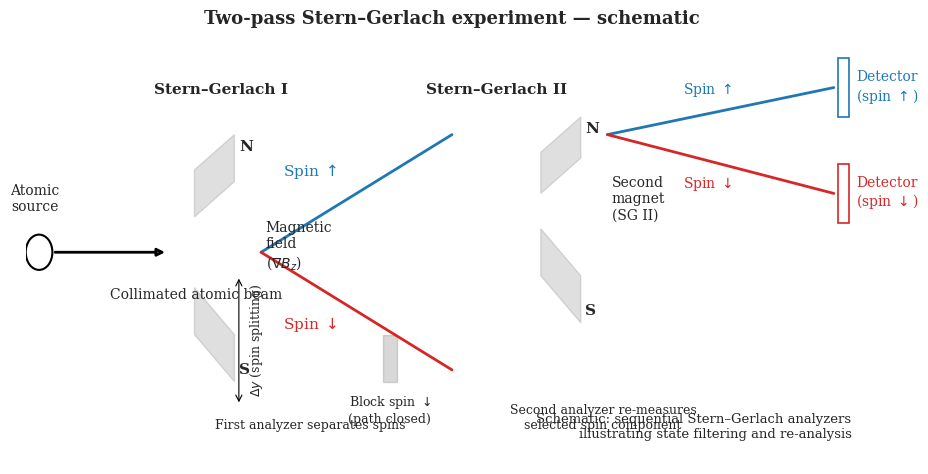

In [13]:
# Two-pass Stern–Gerlach experiment schematic
# Publication-ready, clean, and educational
# Author: Sooryansh Asthana + ChatGPT (GPT-5)

import matplotlib.pyplot as plt
import numpy as np

plt.rcParams.update({
    "font.family": "serif",
    "font.size": 11,
    "axes.linewidth": 1.0,
    "text.usetex": False
})

fig, ax = plt.subplots(figsize=(11, 5.5))
ax.set_xlim(-0.6, 9.0)
ax.set_ylim(-1.8, 1.8)
ax.axis('off')

# -----------------------------------------------------------
# 1. Source and first collimated beam
# -----------------------------------------------------------
beam_x = -0.45
ax.add_patch(plt.Circle((beam_x, 0.0), 0.15, fill=False, linewidth=1.5))
ax.annotate("", xy=(1.0, 0.0), xytext=(beam_x + 0.15, 0.0),
            arrowprops=dict(arrowstyle="-|>", linewidth=2))
ax.text(beam_x - 0.05, 0.35, "Atomic\nsource", ha='center', fontsize=10)
ax.text(0.35, -0.3, "Collimated atomic beam", fontsize=10, va='top')

# -----------------------------------------------------------
# 2. First magnetic field region (SG1)
# -----------------------------------------------------------
pole_x1 = 1.3
# Top asymmetric pole
ax.add_patch(plt.Polygon([[pole_x1, 0.3], [pole_x1 + 0.45, 0.6],
                          [pole_x1 + 0.45, 1.0], [pole_x1, 0.7]],
                         closed=True, fill=True, color='gray', alpha=0.25, edgecolor='black'))
ax.text(pole_x1 + 0.5, 0.9, "N", ha='left', va='center', fontsize=11, weight='bold')

# Bottom asymmetric pole
ax.add_patch(plt.Polygon([[pole_x1, -0.3], [pole_x1 + 0.45, -0.7],
                          [pole_x1 + 0.45, -1.1], [pole_x1, -0.7]],
                         closed=True, fill=True, color='gray', alpha=0.25, edgecolor='black'))
ax.text(pole_x1 + 0.5, -1.0, "S", ha='left', va='center', fontsize=11, weight='bold')

# Magnetic field label
ax.text(pole_x1 + 0.8, 0.05, "Magnetic\nfield\n($\\nabla B_z$)", fontsize=10, va='center', ha='left')

# -----------------------------------------------------------
# 3. First beam splitting (SG1)
# -----------------------------------------------------------
split_x1 = pole_x1 + 0.75
x_mid = 4.2
# Up and down paths after SG1
ax.plot([split_x1, x_mid], [0.0, 1.0], linewidth=2.0, color='C0')
ax.plot([split_x1, x_mid], [0.0, -1.0], linewidth=2.0, color='C3')

ax.text(2.3, 0.65, "Spin $\\uparrow$", fontsize=11, color='C0')
ax.text(2.3, -0.65, "Spin $\\downarrow$", fontsize=11, color='C3')
ax.text(1.6, 1.35, "Stern–Gerlach I", fontsize=11, weight='bold', ha='center')

# -----------------------------------------------------------
# 4. Optional blocking or selection of one path (e.g., spin-up only)
# -----------------------------------------------------------
block_x = 3.5
ax.add_patch(plt.Rectangle((block_x - 0.08, -1.1), 0.16, 0.4, color='gray', alpha=0.3))
ax.text(block_x, -1.45, "Block spin $\\downarrow$\n(path closed)", fontsize=9, ha='center')

# -----------------------------------------------------------
# 5. Second magnetic field region (SG2) for re-analysis
# -----------------------------------------------------------
pole_x2 = 5.2
# Asymmetric magnets again
ax.add_patch(plt.Polygon([[pole_x2, 0.5], [pole_x2 + 0.45, 0.8],
                          [pole_x2 + 0.45, 1.15], [pole_x2, 0.85]],
                         closed=True, fill=True, color='gray', alpha=0.25, edgecolor='black'))
ax.text(pole_x2 + 0.5, 1.05, "N", ha='left', va='center', fontsize=11, weight='bold')
ax.add_patch(plt.Polygon([[pole_x2, 0.2], [pole_x2 + 0.45, -0.2],
                          [pole_x2 + 0.45, -0.6], [pole_x2, -0.2]],
                         closed=True, fill=True, color='gray', alpha=0.25, edgecolor='black'))
ax.text(pole_x2 + 0.5, -0.5, "S", ha='left', va='center', fontsize=11, weight='bold')

ax.text(pole_x2 + 0.8, 0.45, "Second\nmagnet\n(SG II)", fontsize=10, va='center', ha='left')
ax.text(4.7, 1.35, "Stern–Gerlach II", fontsize=11, weight='bold', ha='center')

# -----------------------------------------------------------
# 6. Split again (second analysis)
# -----------------------------------------------------------
split_x2 = pole_x2 + 0.75
x_end = 8.5

# Two beams from SG2
ax.plot([split_x2, x_end], [1.0, 1.4], linewidth=2.0, color='C0')
ax.plot([split_x2, x_end], [1.0, 0.5], linewidth=2.0, color='C3')

ax.text(6.8, 1.35, "Spin $\\uparrow$", fontsize=10, color='C0')
ax.text(6.8, 0.55, "Spin $\\downarrow$", fontsize=10, color='C3')

# -----------------------------------------------------------
# 7. Detectors for the second stage
# -----------------------------------------------------------
det_w, det_h = 0.12, 0.5
ax.add_patch(plt.Rectangle((x_end + 0.05, 1.4 - det_h/2), det_w, det_h,
                           linewidth=1.2, fill=False, edgecolor='C0'))
ax.add_patch(plt.Rectangle((x_end + 0.05, 0.5 - det_h/2), det_w, det_h,
                           linewidth=1.2, fill=False, edgecolor='C3'))

ax.text(x_end + 0.25, 1.4, "Detector\n(spin $\\uparrow$)", va='center', ha='left', color='C0', fontsize=10)
ax.text(x_end + 0.25, 0.5, "Detector\n(spin $\\downarrow$)", va='center', ha='left', color='C3', fontsize=10)

# -----------------------------------------------------------
# 8. Key annotation
# -----------------------------------------------------------
ax.text(2.6, -1.5, "First analyzer separates spins", fontsize=9, ha='center')
ax.text(5.9, -1.5, "Second analyzer re-measures\nselected spin component", fontsize=9, ha='center')

ax.annotate("", xy=(1.8, -0.2), xytext=(1.8, -1.3),
            arrowprops=dict(arrowstyle="<->", color='black', linewidth=0.8))
ax.text(1.9, -0.75, "$\\Delta y$ (spin splitting)", fontsize=9, rotation=90, va='center')

# -----------------------------------------------------------
# 9. Title and final touch
# -----------------------------------------------------------
ax.set_title("Two-pass Stern–Gerlach experiment — schematic", fontsize=13, weight='bold', pad=12)
ax.text(8.7, -1.6,
        "Schematic: sequential Stern–Gerlach analyzers\nillustrating state filtering and re-analysis",
        fontsize=9.5, ha='right', va='bottom')

# -----------------------------------------------------------
# Save and show
# -----------------------------------------------------------
outpath = "/mnt/data/two_pass_stern_gerlach.png"
plt.savefig(outpath, dpi=400, bbox_inches='tight', facecolor='white')
plt.show()

print(f"Saved publication-quality two-pass schematic to {outpath}")
